In [ ]:
!pip install -r "/content/drive/MyDrive/Colab Notebooks/LEVX_1km/requirements.txt"

In [ ]:
!pip install lazypredict

In [2]:
#@title Nearest points Harmonie
import plotly.express as px
import pandas as pd
import numpy as np

coor = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/LEVX_1km/Harmonie_wrf_ml/distan_lat42.22lon-8.63p2R4Km.csv")
px.set_mapbox_access_token("pk.eyJ1IjoiZ3JhbmFudHVpbiIsImEiOiJja3B4dGU4OTkwMTFmMm9ycnNhMjJvaGJqIn0.VWzx_PkD9A5cSUVsn_ijCA")
px.scatter_mapbox(coor, hover_data=['distance'],lat='lat', lon='lon',color='distance', title="Nearest points",
                           color_continuous_scale=px.colors.cyclical.IceFire,)

In [9]:
#@title Load actual data (wind direction and wind speed) from station (dir -1 means variable direcction)
import pandas as pd
station = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/LEVX_1km/Harmonie_wrf_ml/LEVXY2021Y2023.csv",
                          usecols = ["time","dir_o","spd_o"],
                          parse_dates=["time"]).set_index("time")
print("Time from:",station.index[0],"to:",station.index[-1], "number of measures:",len(station.index))
station.describe()

Time from: 2021-12-01 00:00:00 to: 2023-03-14 23:30:00 number of measures: 23129


,dir_o,spd_o
count,23129.000000,23123.000000
mean,155.337325,3.056673
std,113.621368,1.914485
min,-1.000000,0.000000
25%,20.000000,1.543332
50%,200.000000,2.572220
75%,240.000000,4.115552
max,360.000000,17.491096


In [10]:
#@title Climatology labeled and relationship variable wind (VRB) and wind intensity. Observed wind direction label :dir_l
#wind direction to interval dir=-1 variable wind
from IPython.display import display,Markdown

interval = pd.IntervalIndex.from_tuples([(-1.5, -0.5),(-0.5,20), (20, 40), (40, 60),
                                           (60,80),(80,100),(100,120),(120,140),(140,160),
                                           (160,180),(180,200),(200,220),(220,240),
                                           (240,260),(260,280),(280,300),(300,320),
                                           (320,340),(340,360)])

labels = ['VRB', '[0, 20]', '(20, 40]', '(40, 60]','(60, 80]', '(80, 100]',
          '(100, 120]', '(120, 140]','(140, 160]', '(160, 180]', '(180, 200]',
          '(200, 220]','(220, 240]', '(240, 260]', '(260, 280]', '(280, 300]',
          '(300, 320]', '(320, 340]', '(340, 360]']

station["dir_l"] = pd.cut(station["dir_o"], bins=interval,retbins=False,
                        labels=labels).map({a:b for a,b in zip(interval,labels)}).astype('category')


#observed climatology
title0 = "wind direction climatology"
display(Markdown(f"**{title0}**"))
display(station["dir_l"].value_counts(normalize= True).transform(lambda x: '{:,.0%}'.format(x)))

station["spd_o_kt"]=np.rint(station["spd_o"]*1.94384)
title1 = "wind intensity percentage (kt) when wind variable"
display(Markdown(f"**{title1}**"))
display(station[station.dir_l=="VRB"]["spd_o_kt"].value_counts(normalize = True).transform(lambda x: '{:,.0%}'.format(x)))

title2 = "wind direction when wind speed equal or less than 3 kt"
display(Markdown(f"**{title2}**"))
station[station.spd_o_kt<=3]["dir_l"].value_counts(normalize = True).transform(lambda x: '{:,.0%}'.format(x))


**wind direction climatology**

VRB           19%
(180, 200]    15%
(200, 220]    12%
(220, 240]     9%
[0, 20]        7%
(260, 280]     6%
(240, 260]     6%
(20, 40]       5%
(160, 180]     5%
(340, 360]     3%
(280, 300]     3%
(40, 60]       3%
(300, 320]     2%
(320, 340]     1%
(60, 80]       1%
(140, 160]     1%
(80, 100]      1%
(100, 120]     1%
(120, 140]     0%
Name: dir_l, dtype: object

**wind intensity percentage (kt) when wind variable**

2.0     46%
1.0     26%
3.0     12%
4.0      7%
5.0      4%
6.0      2%
7.0      1%
8.0      1%
9.0      0%
11.0     0%
10.0     0%
12.0     0%
13.0     0%
14.0     0%
15.0     0%
Name: spd_o_kt, dtype: object

**wind direction when wind speed equal or less than 3 kt**

VRB           57%
[0, 20]        9%
(220, 240]     5%
(200, 220]     3%
(240, 260]     3%
(20, 40]       3%
(180, 200]     3%
(340, 360]     3%
(260, 280]     2%
(280, 300]     2%
(40, 60]       2%
(320, 340]     2%
(300, 320]     2%
(160, 180]     2%
(100, 120]     1%
(80, 100]      1%
(140, 160]     1%
(60, 80]       1%
(120, 140]     0%
Name: dir_l, dtype: object

In [46]:
#@title Load forecast day 0 Harmonie
#forecast d0
model_h = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/LEVX_1km/Harmonie_wrf_ml/lat42.22lon-8.63p2R1KmD0_h.csv",parse_dates=["time"]).set_index("time").add_suffix("_h")
print("Time from:",model_h.index[0],"to:",model_h.index[-1], "number of measures:",len(model_h.index))
model_h

Time from: 2021-12-01 00:00:00 to: 2023-03-15 23:00:00 number of measures: 11280


,dir0_h,snow_prec0_h,isocero0_h,mod0_h,racha_u0_h,racha_v0_h,mslp0_h,temp0_h,rh0_h,visibility0_h,...,cape1_h,cin1_h,cfh1_h,cfl1_h,cfm1_h,cft1_h,HGT5001_h,HGT8501_h,T5001_h,T8501_h
time,,,,,,,,,,,,,,,,,,,,,
2021-12-01 00:00:00,69.51,0,1966.10,0.16,-0.27,-0.09,100237.00,280.77,0.96,4059.89,...,-14176.54,3240.00,0.07,0.12,0.00,0.18,56205.03,15365.16,255.05,277.22
2021-12-01 01:00:00,139.15,0,2003.55,0.25,-0.24,0.30,100189.50,280.40,0.94,9189.69,...,-0.88,10756.00,0.54,0.99,0.00,1.00,56150.84,15324.68,254.83,276.93
2021-12-01 02:00:00,126.09,0,2161.32,0.79,-0.89,0.71,100138.34,280.94,0.95,7637.18,...,-0.63,15854.00,1.00,1.00,0.02,1.00,56078.43,15267.43,254.60,277.25
2021-12-01 03:00:00,146.36,0,2023.51,1.19,-0.96,1.57,100092.60,281.09,0.97,3359.18,...,-0.61,9198.00,1.00,1.00,0.02,1.00,56038.57,15241.89,254.18,276.96
2021-12-01 04:00:00,161.50,0,1939.89,0.77,-0.34,1.17,100037.55,281.71,0.93,10551.13,...,-0.24,7302.00,1.00,1.00,0.00,1.00,56013.51,15197.96,254.43,276.63
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-03-15 19:00:00,305.26,0,1640.09,2.13,2.87,-2.21,98969.20,284.56,0.87,15984.84,...,-12319.16,4359.00,0.00,0.00,0.00,0.00,55919.75,14493.48,257.83,283.26
2023-03-15 20:00:00,308.34,0,1674.70,1.20,1.45,-1.25,98957.14,283.02,0.94,10792.88,...,-13695.14,3242.00,0.86,0.00,0.00,0.86,55875.79,14474.95,257.68,283.32
2023-03-15 21:00:00,323.48,0,1632.16,0.32,0.29,-0.43,98937.27,282.00,0.97,3531.59,...,-14594.07,3242.00,1.00,0.00,0.00,1.00,55839.30,14450.24,258.16,283.05


In [29]:
#@title Concatenate Harmonie and station data. Delete rows with wind direction variable obseved
#concat station vs meteorological  model. Delete variable (VRB) observed direction
df_vrb_h = pd.concat([station,model_h],axis=1).drop(columns=["spd_o","spd_o_kt"]).dropna()
print("dataframe with wind variable")
print("Time from:",df_vrb_h.index[0],"to:",df_vrb_h.index[-1], "number of measures:",len(df_vrb_h.index))
df_all_h = df_vrb_h[df_vrb_h.dir_o!=-1]
print("dataframe without wind variable")
print("Time from:",df_all_h.index[0],"to:",df_all_h.index[-1], "number of measures:",len(df_all_h.index))
df_all_h

dataframe with wind variable
Time from: 2021-12-01 00:00:00 to: 2023-03-14 23:00:00 number of measures: 11225
dataframe without wind variable
Time from: 2021-12-01 00:00:00 to: 2023-03-14 23:00:00 number of measures: 9032


,dir_o,dir_l,dir0_h,snow_prec0_h,isocero0_h,mod0_h,racha_u0_h,racha_v0_h,mslp0_h,temp0_h,...,cape1_h,cin1_h,cfh1_h,cfl1_h,cfm1_h,cft1_h,HGT5001_h,HGT8501_h,T5001_h,T8501_h
time,,,,,,,,,,,,,,,,,,,,,
2021-12-01 00:00:00,220.0,"(200, 220]",69.51,0.0,1966.10,0.16,-0.27,-0.09,100237.00,280.77,...,-14176.54,3240.0,0.07,0.12,0.00,0.18,56205.03,15365.16,255.05,277.22
2021-12-01 01:00:00,220.0,"(200, 220]",139.15,0.0,2003.55,0.25,-0.24,0.30,100189.50,280.40,...,-0.88,10756.0,0.54,0.99,0.00,1.00,56150.84,15324.68,254.83,276.93
2021-12-01 02:00:00,220.0,"(200, 220]",126.09,0.0,2161.32,0.79,-0.89,0.71,100138.34,280.94,...,-0.63,15854.0,1.00,1.00,0.02,1.00,56078.43,15267.43,254.60,277.25
2021-12-01 03:00:00,220.0,"(200, 220]",146.36,0.0,2023.51,1.19,-0.96,1.57,100092.60,281.09,...,-0.61,9198.0,1.00,1.00,0.02,1.00,56038.57,15241.89,254.18,276.96
2021-12-01 04:00:00,210.0,"(200, 220]",161.50,0.0,1939.89,0.77,-0.34,1.17,100037.55,281.71,...,-0.24,7302.0,1.00,1.00,0.00,1.00,56013.51,15197.96,254.43,276.63
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-03-14 19:00:00,270.0,"(260, 280]",274.20,0.0,1807.90,1.92,3.35,-0.38,99867.76,285.11,...,-0.73,10736.0,0.93,0.99,0.00,1.00,56128.31,15035.52,256.50,275.67
2023-03-14 20:00:00,210.0,"(200, 220]",286.38,0.0,1908.94,1.50,2.52,-0.85,99901.39,284.96,...,-0.55,6768.0,0.95,1.00,0.00,1.00,56184.24,15056.29,256.91,275.74
2023-03-14 21:00:00,210.0,"(200, 220]",249.59,0.0,1871.24,0.87,1.52,0.50,99906.75,284.80,...,-0.15,6768.0,0.93,1.00,0.00,1.00,56221.86,15064.11,257.13,275.81


In [30]:
#@title Label meteorological points variable dir0 as dir0_h_l and observed wind direction label as dir_l
#label meteorological model variables dir0
df_all_h["dir0_h_l"] = pd.cut(df_all_h["dir0_h"], bins=interval,retbins=False,labels=labels).map({a:b for a,b in zip(interval,labels)}).astype('category')


df_all_h[["dir_l","dir0_h_l"]].sample(20)

<ipython-input-30-f3e91f8b0420>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,dir_l,dir0_h_l
time,,
2022-05-04 00:00:00,"[0, 20]","(340, 360]"
2022-05-31 08:00:00,"(200, 220]","(100, 120]"
2022-12-18 02:00:00,"(180, 200]","(140, 160]"
2022-11-08 19:00:00,"(200, 220]","(240, 260]"
2022-07-03 13:00:00,"(40, 60]","[0, 20]"
2021-12-03 04:00:00,"[0, 20]","(320, 340]"
2022-03-16 03:00:00,"(280, 300]","(300, 320]"
2022-03-31 16:00:00,"(280, 300]","(300, 320]"
2022-02-04 06:00:00,"(220, 240]","(300, 320]"


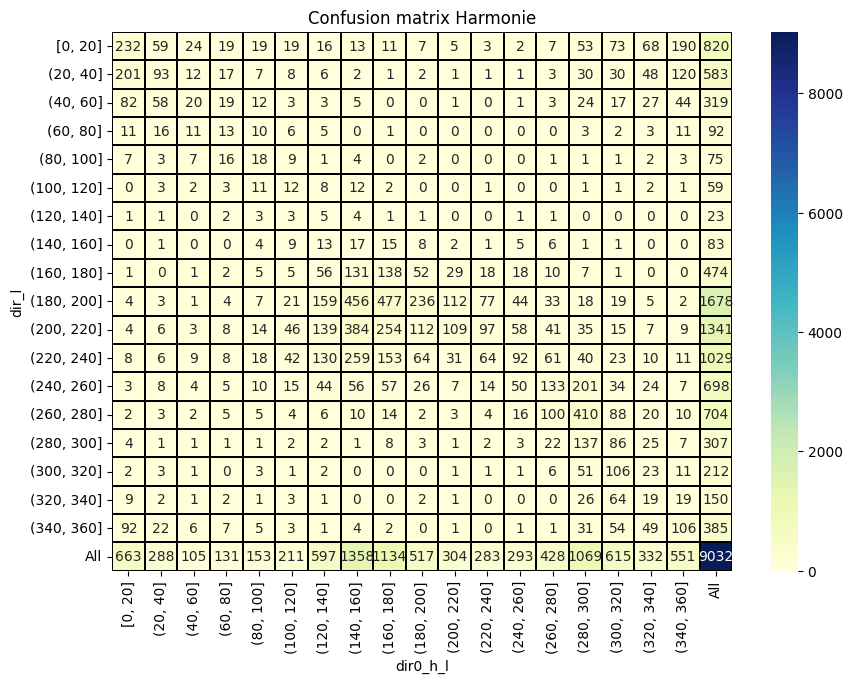

In [46]:
#@title Confusion matrix  Harmonie
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 7))
plt.title("Confusion matrix Harmonie")

global_sc = pd.crosstab(df_all_h.dir_l, df_all_h.dir0_h_l,margins=True,)
sns.heatmap(global_sc,annot=True,cmap="YlGnBu",fmt='.0f',linewidths=.2,linecolor='black');

<ipython-input-32-4ba089722594>:9: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



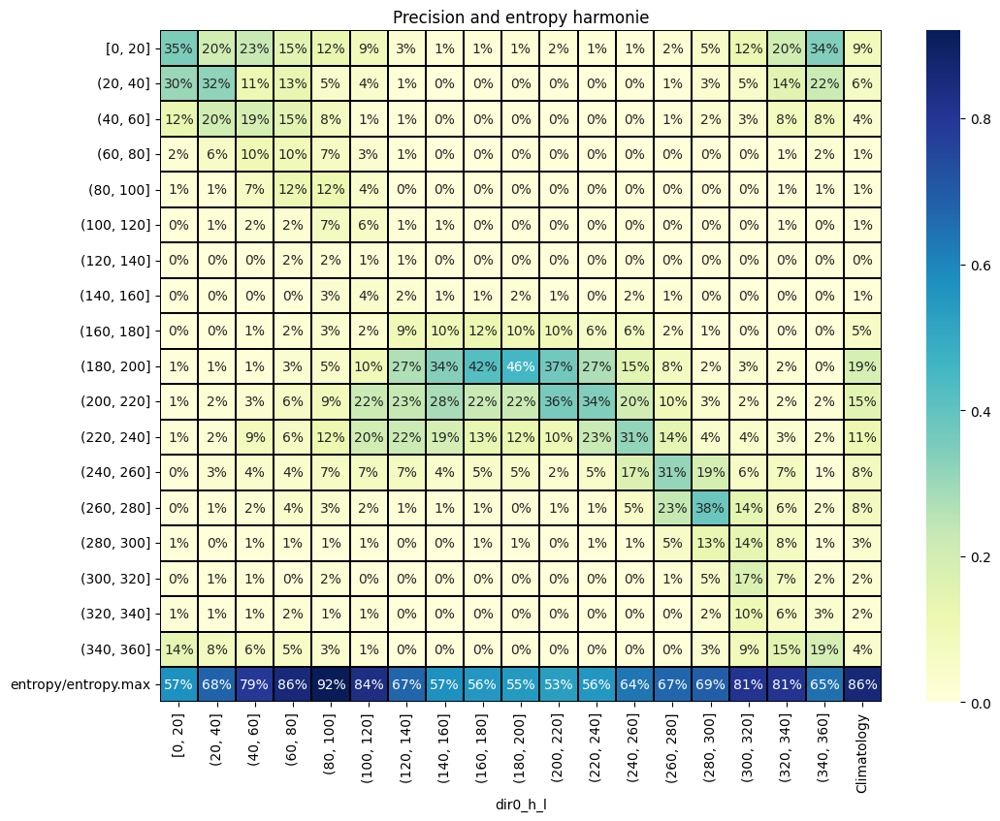

In [32]:

#@title Precision and entropy
import math
from scipy.stats import entropy


plt.figure(figsize=(12, 9))
plt.title("Precision and entropy harmonie")
column_sc = pd.crosstab(df_all_h.dir_l, df_all_h.dir0_h_l, margins=True,normalize="columns")
column_sc = column_sc.append(pd.DataFrame(entropy(column_sc,base=2)/(math.log2(column_sc.shape[0])),columns=["entropy/entropy.max"],
                    index=column_sc.columns).T).rename(columns={"All":"Climatology"})
sns.heatmap(column_sc,annot=True,cmap="YlGnBu",fmt='.0%',linewidths=.2,linecolor='black');

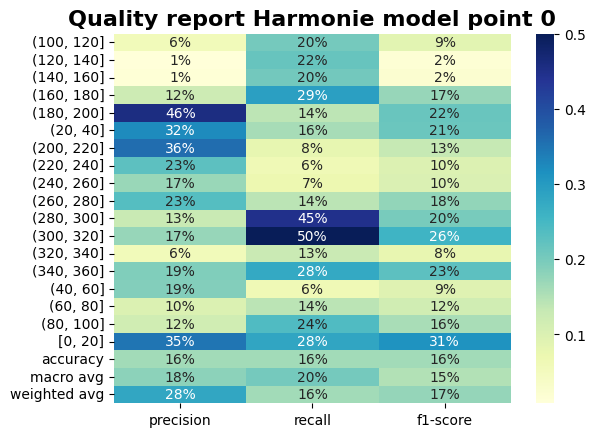

In [33]:
#@title Meteorological model score point 0
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt
import seaborn as sns


cr = pd.DataFrame(classification_report(df_all_h.dir_l, df_all_h.dir0_h_l,output_dict=True)).T.sort_index()
seab = sns.heatmap(cr.drop(columns=["support"]),annot=True,cmap="YlGnBu",fmt='.0%',)
seab.set_title("Quality report Harmonie model point 0", fontsize=16, fontweight='bold')
plt.show()

In [34]:
#@title Test association between observed variable and meteorological model (point 0) (Pearson’s chi square test). Significance level (alpha) = 0.01
#two way table
from scipy.stats import chi2_contingency

alpha = 0.01

#stadistic(sta), pvalue (p), degrees of freedom (dof) and expected values (exp)
sta, p, dof, exp = chi2_contingency(pd.crosstab(df_all_h.dir_l,df_all_h.dir0_h_l))

#degrees of freedoom (rows-1)*(columns-1) to test associationbetween two variables

print('p-value:',p)
print('Significance level:',alpha)
print('Degres of of freedom: ',dof)
print("Stadistic",sta)

if p<=alpha:
    print("Reject H0,There is an association between meteorological model variables and observed values")
else:
    print("Retain H0,There is no association between meteorological model variables and observed values")


if pd.crosstab(df_all_h.dir_l,df_all_h.dir0_h_l).min().min()<5:
  print("All cells must be more than five!!!. No Chi square test posible")

p-value: 0.0
Significance level: 0.01
Degres of of freedom:  289
Stadistic 12995.593509861188
Reject H0,There is an association between meteorological model variables and observed values
All cells must be more than five!!!. No Chi square test posible


In [48]:
#@title Machine learning forecast with lazypredict. Forecast without variable winds
from sklearn.model_selection import train_test_split
import lazypredict
from lazypredict.Supervised import LazyClassifier


# X and Y
Y = df_all_h.dir_l
X = df_all_h[['dir0_h', 'snow_prec0_h', 'isocero0_h', 'mod0_h',
       'racha_u0_h', 'racha_v0_h', 'mslp0_h', 'temp0_h', 'rh0_h',
       'visibility0_h', 'lhevapac0_h', 'lhsublac0_h', 'lwflx0_h', 'prec0_h',
       'swflx0_h', 'shflxac0_h', 'cape0_h', 'cin0_h', 'cfh0_h', 'cfl0_h',
       'cfm0_h', 'cft0_h', 'HGT5000_h', 'HGT8500_h', 'T5000_h', 'T8500_h',
       'dir1_h', 'snow_prec1_h', 'isocero1_h', 'mod1_h', 'racha_u1_h',
       'racha_v1_h', 'mslp1_h', 'temp1_h', 'rh1_h', 'visibility1_h',
       'lhevapac1_h', 'lhsublac1_h', 'lwflx1_h', 'prec1_h', 'swflx1_h',
       'shflxac1_h', 'cape1_h', 'cin1_h', 'cfh1_h', 'cfl1_h', 'cfm1_h',
       'cft1_h', 'HGT5001_h', 'HGT8501_h', 'T5001_h', 'T8501_h']]

np.random.seed(1)
X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size=0.2, )


multiple_model = LazyClassifier(verbose =0, ignore_warnings = True,predictions=True)
models,predictions = multiple_model.fit(X_train,X_test,y_train,y_test)
display(models)
title = "Display y_pred for every machine learning model"
display(Markdown(f"**{title}**"))
display(predictions)

100%|██████████| 29/29 [02:12<00:00,  4.57s/it]


,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
RandomForestClassifier,0.46,0.31,None,0.44,5.38
ExtraTreesClassifier,0.46,0.30,None,0.44,2.91
LabelSpreading,0.38,0.30,None,0.38,5.44
LabelPropagation,0.38,0.30,None,0.38,2.66
LGBMClassifier,0.46,0.29,None,0.44,14.82
LinearDiscriminantAnalysis,0.39,0.28,None,0.37,0.19
BaggingClassifier,0.41,0.28,None,0.40,3.52
LogisticRegression,0.40,0.25,None,0.37,1.78
KNeighborsClassifier,0.38,0.25,None,0.37,0.20


**Display y_pred for every machine learning model**

,AdaBoostClassifier,BaggingClassifier,BernoulliNB,CalibratedClassifierCV,DecisionTreeClassifier,DummyClassifier,ExtraTreeClassifier,ExtraTreesClassifier,GaussianNB,KNeighborsClassifier,...,NearestCentroid,PassiveAggressiveClassifier,Perceptron,QuadraticDiscriminantAnalysis,RandomForestClassifier,RidgeClassifier,RidgeClassifierCV,SGDClassifier,SVC,LGBMClassifier
0,"(40, 60]","(340, 360]","(40, 60]","(340, 360]","(40, 60]","(180, 200]","[0, 20]","(340, 360]","(340, 360]","(340, 360]",...,"(340, 360]","[0, 20]","(340, 360]","(340, 360]","(340, 360]","[0, 20]","[0, 20]","(20, 40]","(340, 360]","(340, 360]"
1,"(300, 320]","(220, 240]","(320, 340]","(220, 240]","(240, 260]","(180, 200]","(320, 340]","(220, 240]","(160, 180]","(220, 240]",...,"(320, 340]","(240, 260]","(280, 300]","(280, 300]","(220, 240]","(180, 200]","(180, 200]","(220, 240]","(220, 240]","(240, 260]"
2,"(320, 340]","(300, 320]","(300, 320]","(300, 320]","(300, 320]","(180, 200]","(300, 320]","(300, 320]","(300, 320]","(200, 220]",...,"(300, 320]","(300, 320]","(280, 300]","(280, 300]","(300, 320]","(300, 320]","(260, 280]","(300, 320]","(300, 320]","(300, 320]"
3,"(180, 200]","(180, 200]","(140, 160]","(180, 200]","(180, 200]","(180, 200]","(180, 200]","(180, 200]","(180, 200]","(180, 200]",...,"(140, 160]","(180, 200]","(180, 200]","(140, 160]","(180, 200]","(180, 200]","(180, 200]","(200, 220]","(180, 200]","(160, 180]"
4,"(140, 160]","(200, 220]","(180, 200]","(220, 240]","(200, 220]","(180, 200]","(300, 320]","(200, 220]","(160, 180]","(200, 220]",...,"(180, 200]","(220, 240]","(220, 240]","(220, 240]","(220, 240]","(220, 240]","(220, 240]","(240, 260]","(220, 240]","(200, 220]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1802,"(220, 240]","(200, 220]","(200, 220]","(200, 220]","(180, 200]","(180, 200]","(220, 240]","(200, 220]","(160, 180]","(200, 220]",...,"(160, 180]","(200, 220]","(180, 200]","(160, 180]","(200, 220]","(180, 200]","(180, 200]","(220, 240]","(200, 220]","(200, 220]"
1803,"(200, 220]","(180, 200]","(180, 200]","(180, 200]","(200, 220]","(180, 200]","(160, 180]","(180, 200]","(160, 180]","(180, 200]",...,"(160, 180]","(160, 180]","(180, 200]","(160, 180]","(180, 200]","(180, 200]","(180, 200]","(180, 200]","(180, 200]","(180, 200]"
1804,"(200, 220]","(240, 260]","(180, 200]","(220, 240]","(240, 260]","(180, 200]","(240, 260]","(240, 260]","(160, 180]","(160, 180]",...,"(140, 160]","(200, 220]","(180, 200]","(160, 180]","(240, 260]","(220, 240]","(220, 240]","(220, 240]","(220, 240]","(220, 240]"
1805,"(200, 220]","(220, 240]","(220, 240]","(220, 240]","(200, 220]","(180, 200]","(220, 240]","(220, 240]","(220, 240]","(220, 240]",...,"(220, 240]","(100, 120]","(200, 220]","(340, 360]","(220, 240]","(220, 240]","(220, 240]","(220, 240]","(220, 240]","(220, 240]"


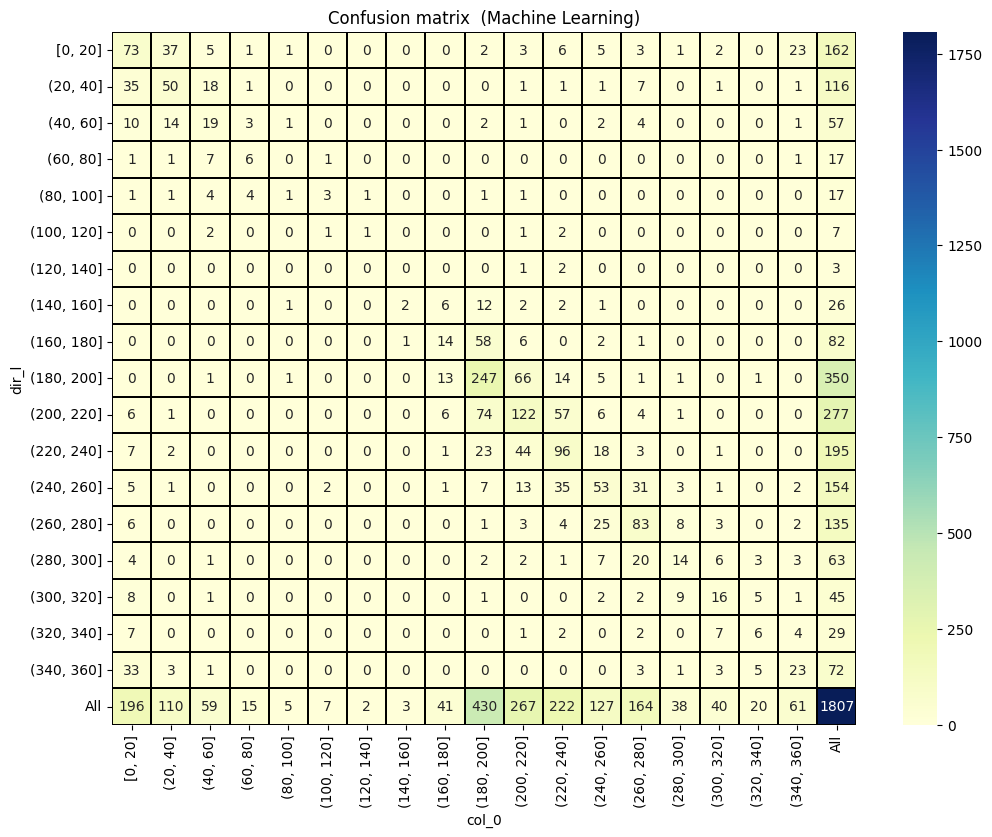

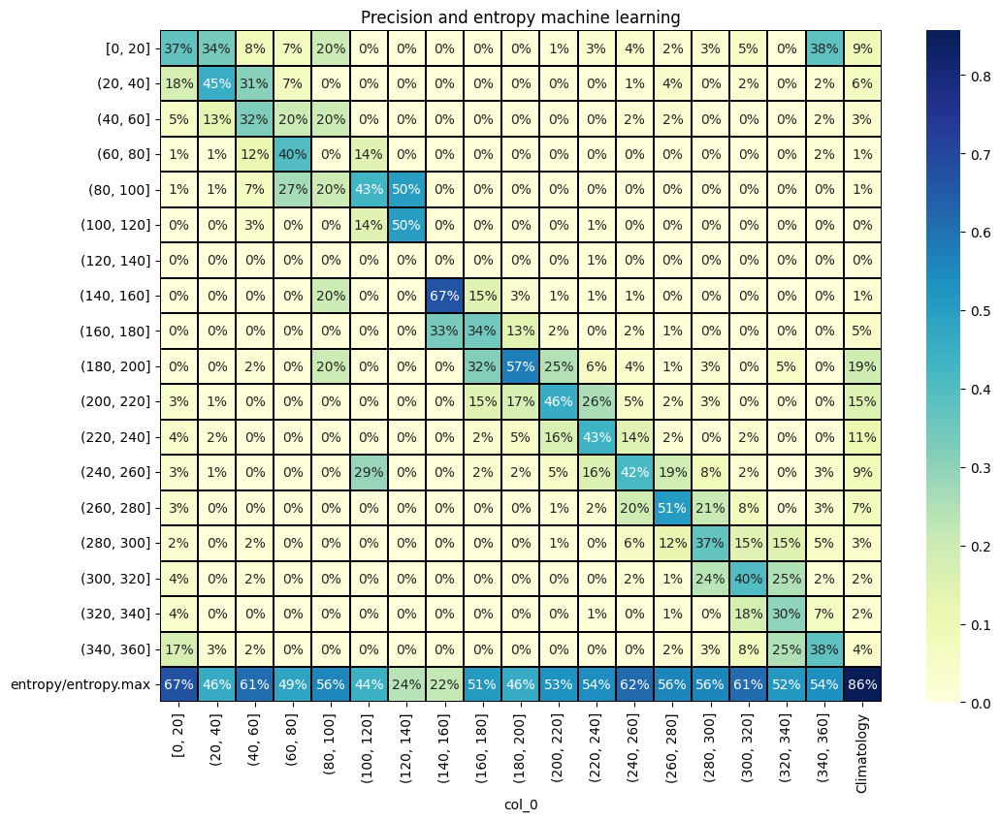

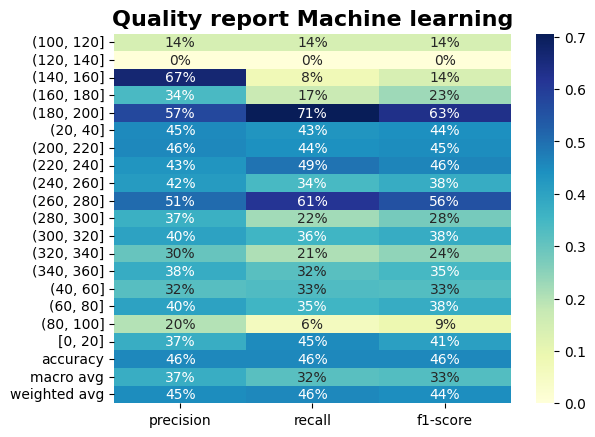

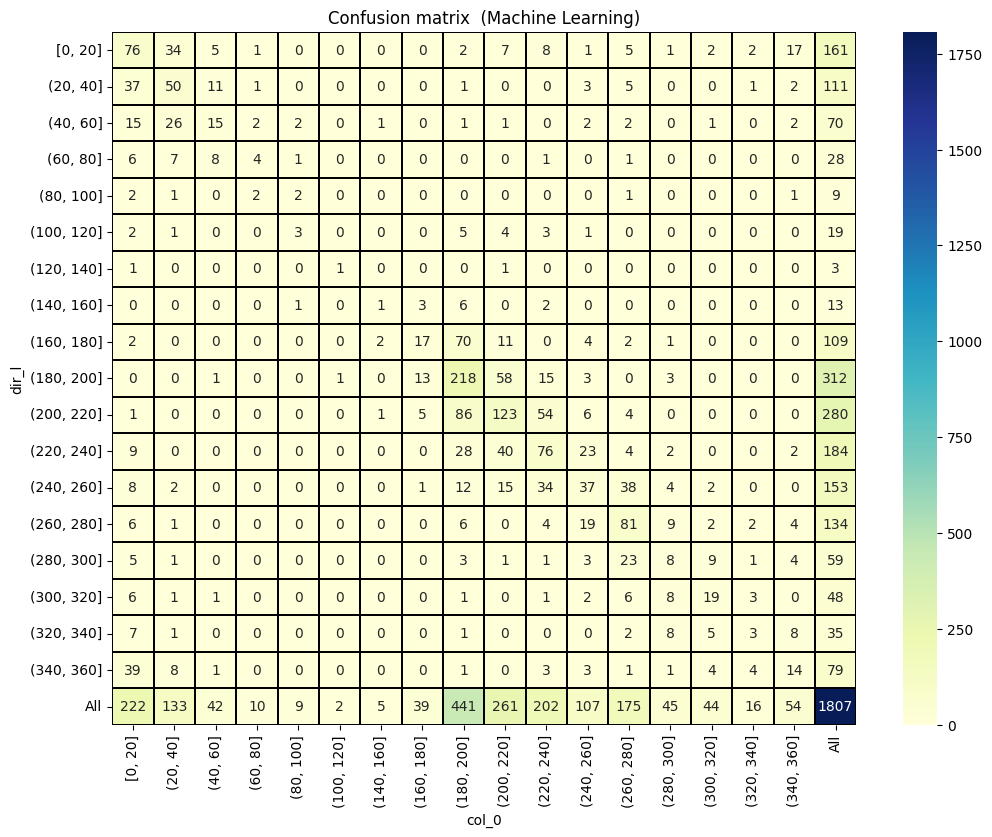

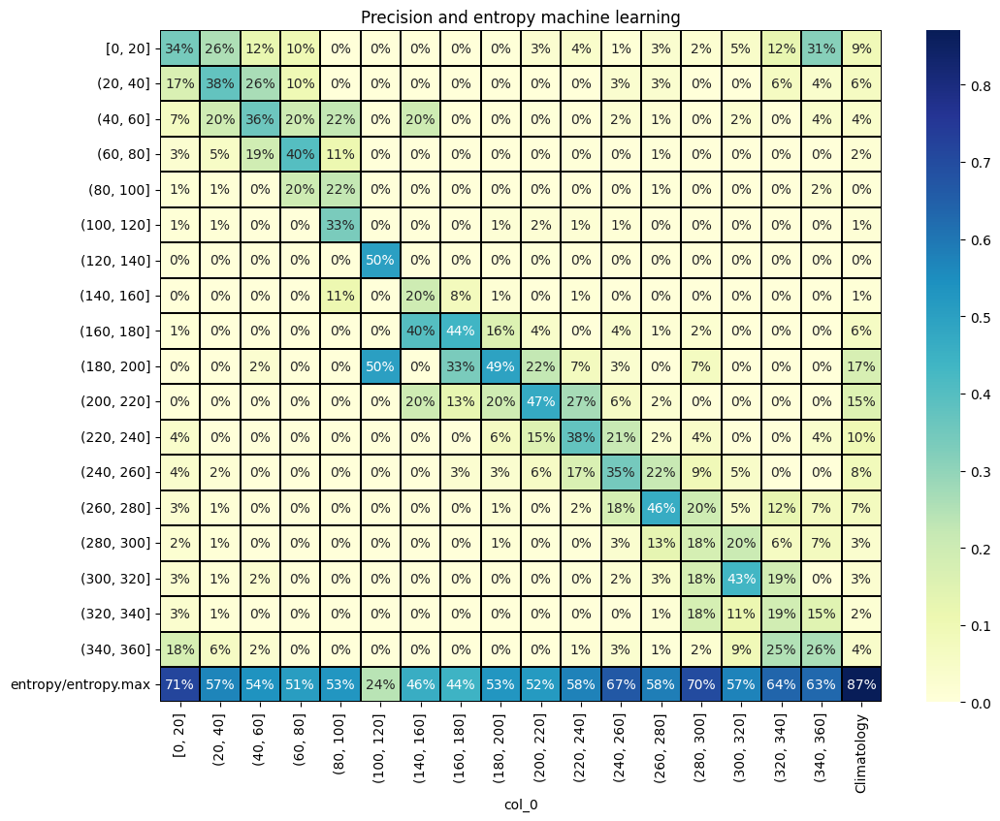

...

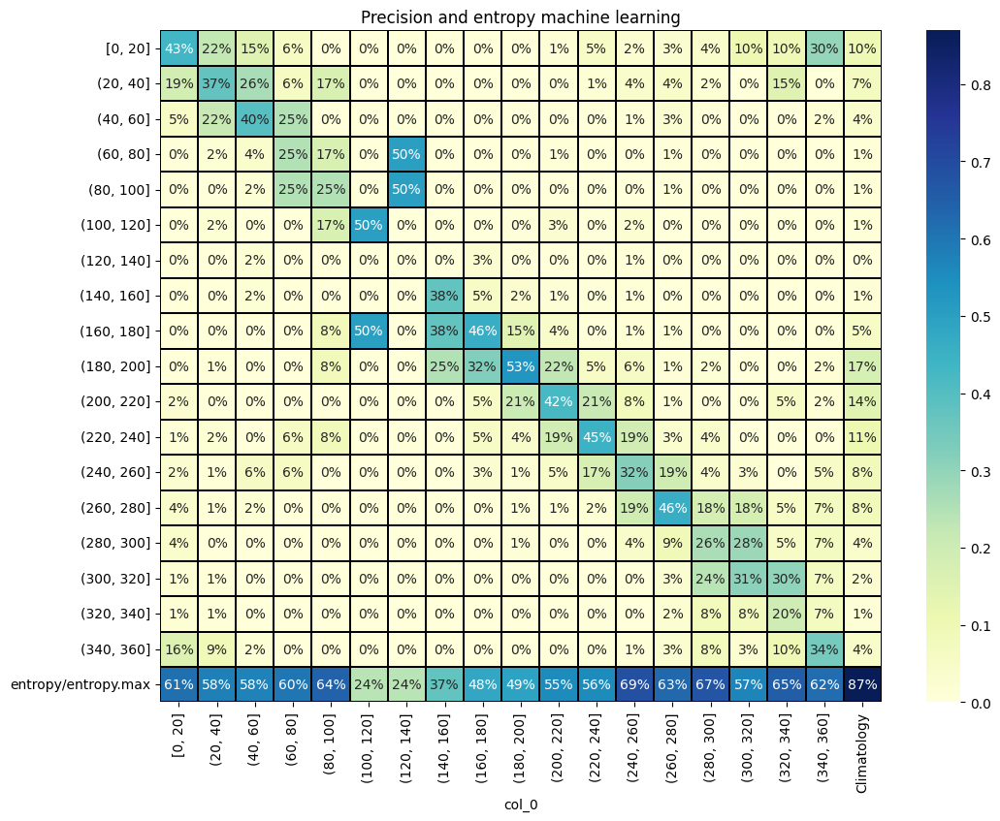

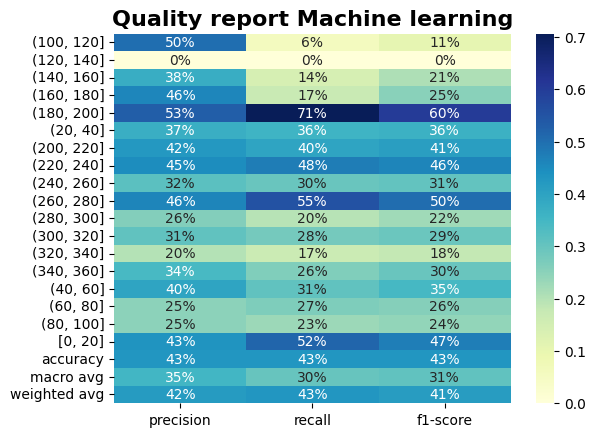

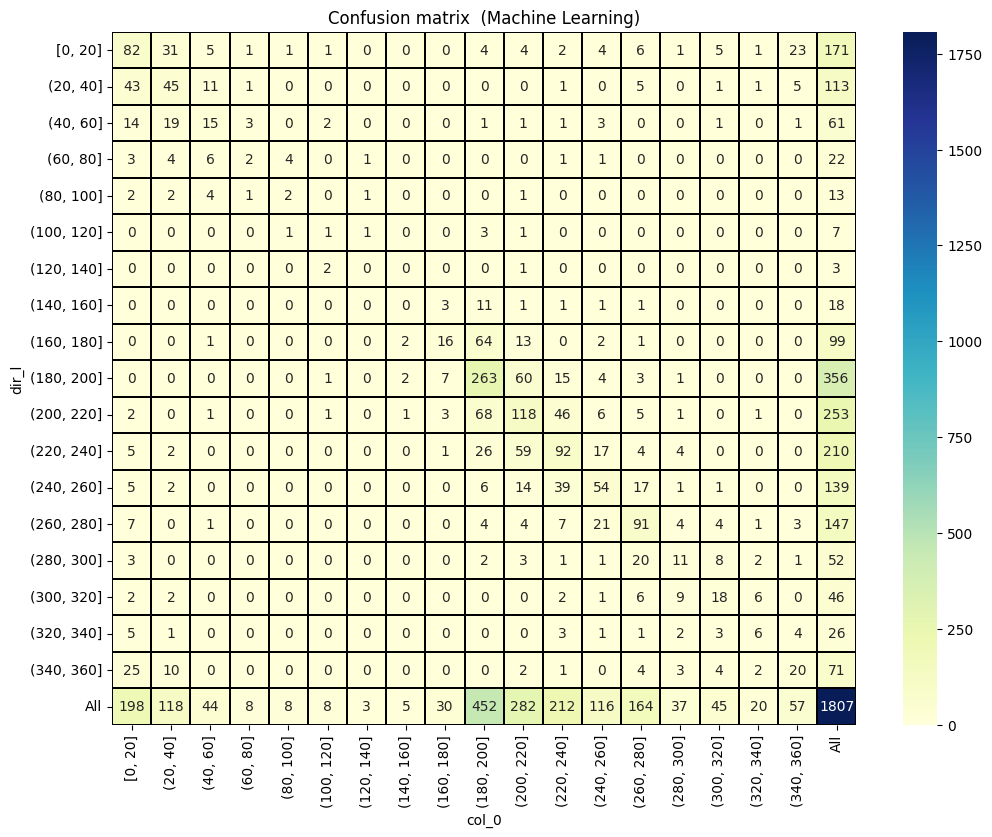

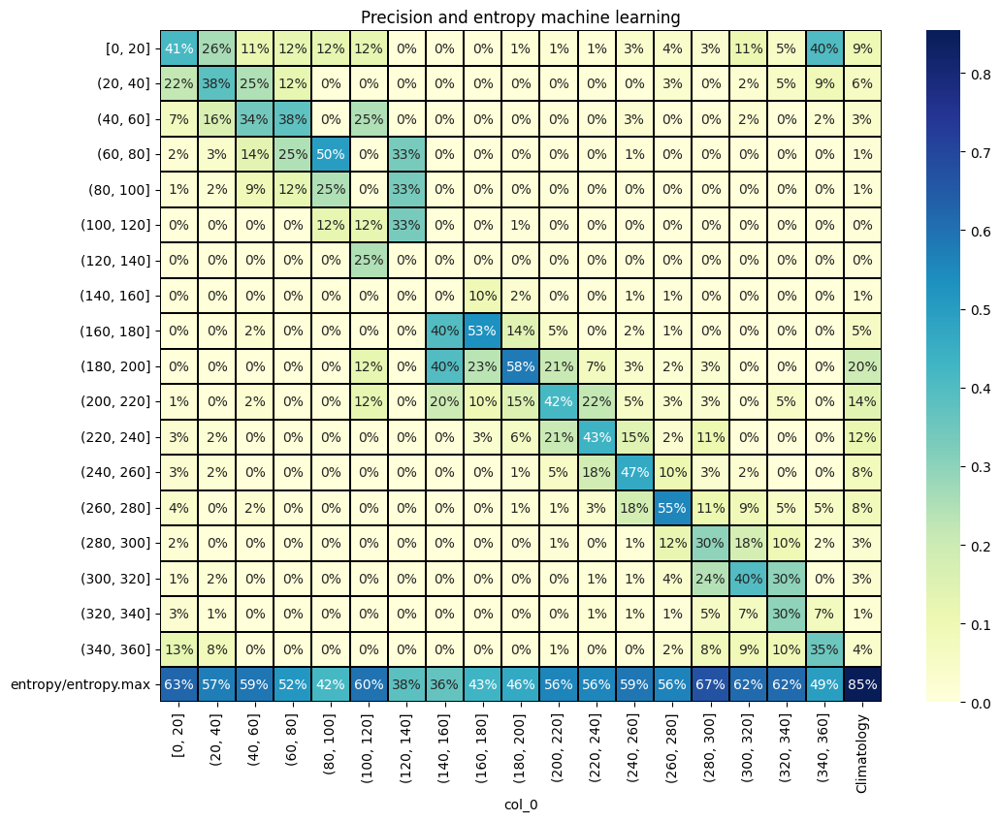

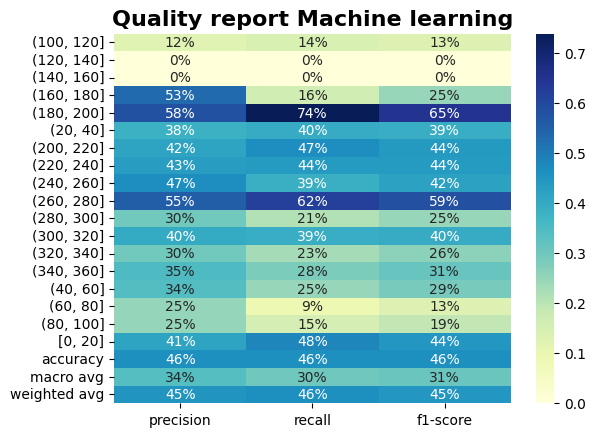


 accuracy mean of samples:  [0.46, 0.41, 0.44, 0.43, 0.46]


In [49]:
#@title  Machine learning (ExtraTreesClassifier) accuracy without variable wind. Five rounds
from lightgbm.sklearn import LGBMClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score


# X and Y
#Y = df_vrb.dir_l
#X = df_vrb.iloc[:,2:]
Y = df_all_h.dir_l
X = df_all_h[['dir0_h', 'snow_prec0_h', 'isocero0_h', 'mod0_h',
       'racha_u0_h', 'racha_v0_h', 'mslp0_h', 'temp0_h', 'rh0_h',
       'visibility0_h', 'lhevapac0_h', 'lhsublac0_h', 'lwflx0_h', 'prec0_h',
       'swflx0_h', 'shflxac0_h', 'cape0_h', 'cin0_h', 'cfh0_h', 'cfl0_h',
       'cfm0_h', 'cft0_h', 'HGT5000_h', 'HGT8500_h', 'T5000_h', 'T8500_h',
       'dir1_h', 'snow_prec1_h', 'isocero1_h', 'mod1_h', 'racha_u1_h',
       'racha_v1_h', 'mslp1_h', 'temp1_h', 'rh1_h', 'visibility1_h',
       'lhevapac1_h', 'lhsublac1_h', 'lwflx1_h', 'prec1_h', 'swflx1_h',
       'shflxac1_h', 'cape1_h', 'cin1_h', 'cfh1_h', 'cfl1_h', 'cfm1_h',
       'cft1_h', 'HGT5001_h', 'HGT8501_h', 'T5001_h', 'T8501_h']]

# mean accuracy machine learning sample array
acc_ml = []

#seed random function to create TWO RELATED samples of scores
np.random.seed(1)

for t in range (0,5):
  #split variables
  X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size=0.20, )

  #ml_model = RandomForestClassifier().fit(X_train,y_train)
  ml_model = ExtraTreesClassifier().fit(X_train,y_train)

  y_pred = ml_model.predict(X_test)
  acc_ml.append(round(accuracy_score(y_test, y_pred),2))

  #Confusion matrix
  plt.figure(figsize=(12, 9))
  plt.title("Confusion matrix  (Machine Learning)")
  cm = pd.crosstab(y_test, ml_model.predict(X_test),margins=True,)
  comuns = [element for element in labels+["All"] if element in cm.columns]
  seab = sns.heatmap(cm[comuns],annot=True,cmap="YlGnBu",fmt='.0f',linewidths=.2,linecolor='black');
  plt.show()

  plt.figure(figsize=(12, 9))
  plt.title("Precision and entropy machine learning")
  column_sc = pd.crosstab(y_test, ml_model.predict(X_test), margins=True,normalize="columns")
  column_sc = column_sc.append(pd.DataFrame(entropy(column_sc,base=2)/(math.log2(column_sc.shape[0])),columns=["entropy/entropy.max"],
                    index=column_sc.columns).T).rename(columns={"All":"Climatology"})
  comuns = [element for element in labels+["Climatology"] if element in column_sc.columns]                  
  seab = sns.heatmap(column_sc[comuns],annot=True,cmap="YlGnBu",fmt='.0%',linewidths=.2,linecolor='black');
  plt.show()
  #quality report
  #print("\nQuality report (Machine Learning)\n")

  df_d = pd.DataFrame(classification_report(y_test, ml_model.predict(X_test),output_dict=True)).T.iloc[:, :3]
  seab = sns.heatmap(df_d,annot=True,cmap="YlGnBu",fmt='.0%',)
  seab.set_title("Quality report Machine learning", fontsize=16, fontweight='bold')
  plt.show()
  #print(pd.DataFrame(classification_report(y_test, ml_model.predict(X_test),output_dict=True)).T)


print("\n accuracy mean of samples: ",acc_ml)



**T test (1sample) compare machine learning mean accuracy in a sample (n=5) versus meteorological model mean accuracy at point 0 (14%) and at point 1 (14%).
the alternative hypothesis is: the mean of the underlying distribution 
of the sample is greater than the given population mean (popmean). Significance level (alpha) = 0.01**

In [50]:
#@title T test (1sample) compare machine learning mean accuracy in a sample (n=5) versus meteorological model mean accuracy at point 0 (16%). Alternative hypothesis is: the mean of the underlying distribution of the sample is greater than the given population mean (popmean). Significance level (alpha) = 0.01
from scipy import stats

alpha = 0.01
sta0, p_value0 = stats.ttest_1samp(acc_ml, popmean=0.16, alternative="greater")


print("\nalpha: ",alpha)

print("\naccuracy list from machine learning test:",acc_ml)
print("\n**** Point 0 ****")
print("\np_value point 0:",p_value0)
if p_value0 < alpha:    
    print("\nwe are rejecting null hypothesis  H0: accuracy mean machine learning= accuracy mean meteorological model point 0")
    print("\nwe are accepting alternative hypothesis: accuracy mean machine learning is greater than accuracy mean meteorological point 0")
else:
    print("\nwe are accepting null hypothesis:  H0 accuracy mean point0= accuracy mean point ")

    


alpha:  0.01

accuracy list from machine learning test: [0.46, 0.41, 0.44, 0.43, 0.46]

**** Point 0 ****

p_value point 0: 3.9233563597197664e-06

we are rejecting null hypothesis  H0: accuracy mean machine learning= accuracy mean meteorological model point 0

we are accepting alternative hypothesis: accuracy mean machine learning is greater than accuracy mean meteorological point 0


In [51]:
#@title Feature importance
def format_as_percentage(value):
    return '{:.1%}'.format(value)
fea_imp =pd.DataFrame({"feature":X.columns,
                      "importance":[(importance/(sum(ml_model.feature_importances_))) for importance in ml_model.feature_importances_]})
fea_imp["feature_per"] =  fea_imp['importance'].map(format_as_percentage) 
fea_sort = fea_imp.sort_values(by="importance",ascending=False)
fea_sort[["feature","feature_per"]][:10]

,feature,feature_per
26,dir1_h,4.6%
0,dir0_h,4.5%
31,racha_v1_h,4.4%
5,racha_v0_h,3.7%
4,racha_u0_h,3.1%
30,racha_u1_h,3.0%
3,mod0_h,2.4%
29,mod1_h,2.3%
41,shflxac1_h,2.3%
36,lhevapac1_h,2.2%


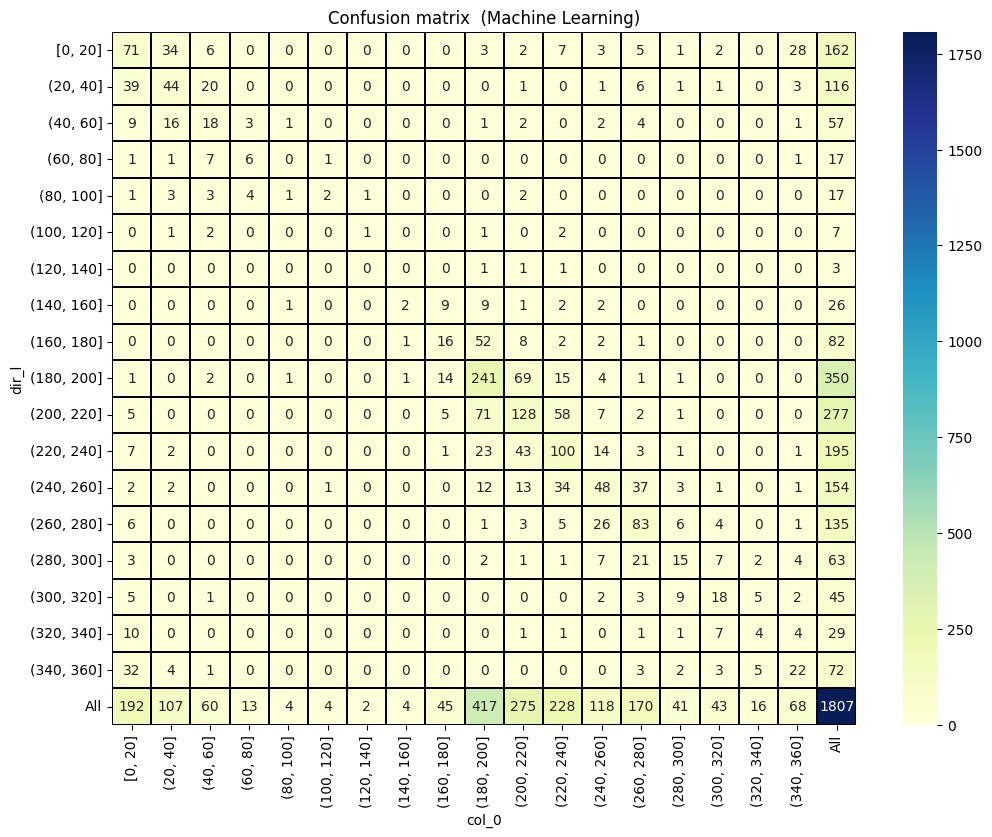

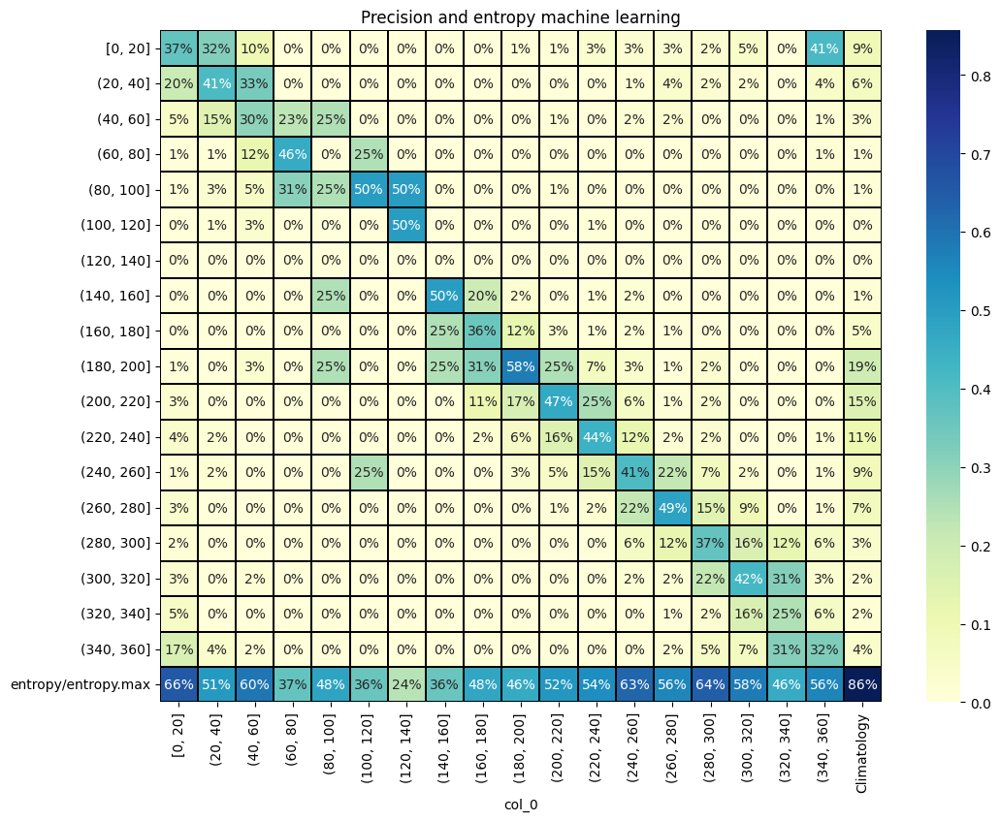

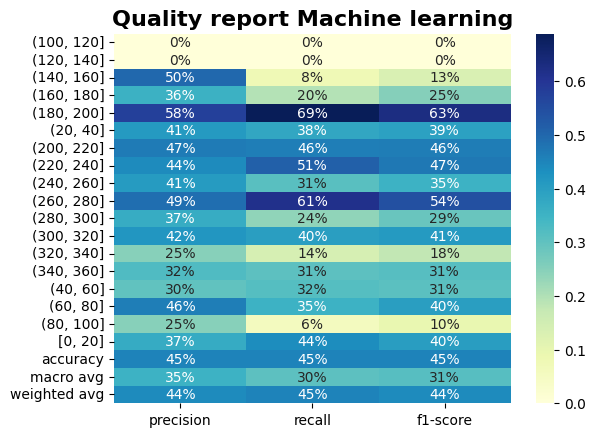

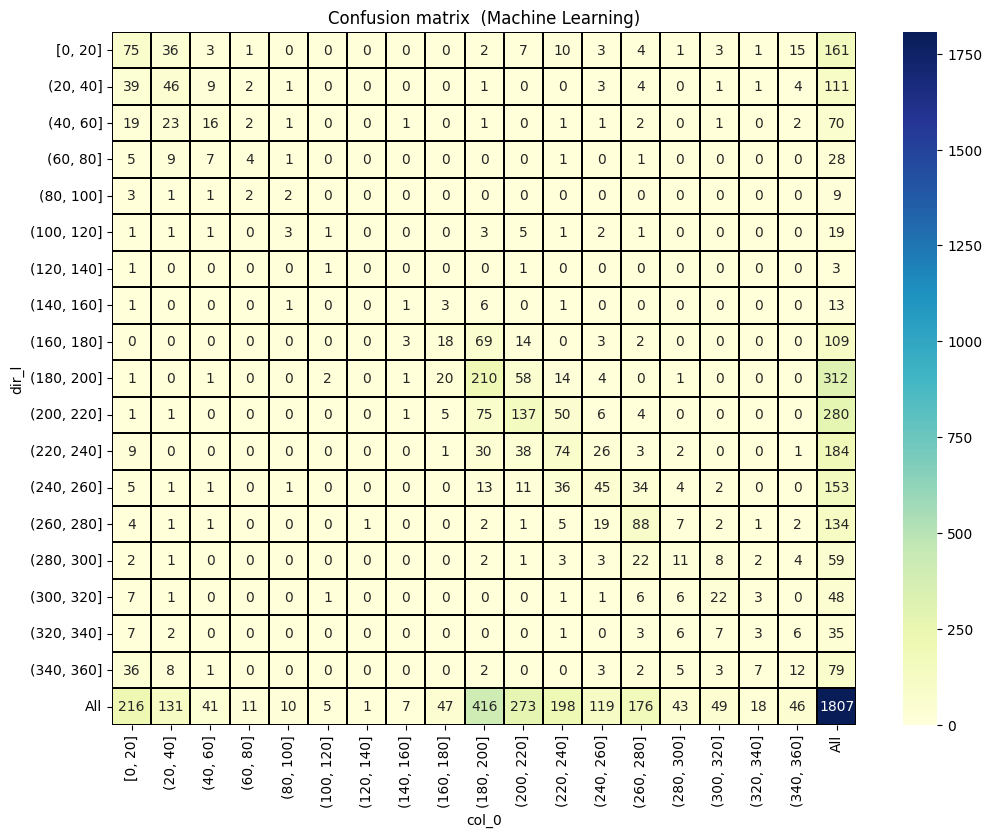

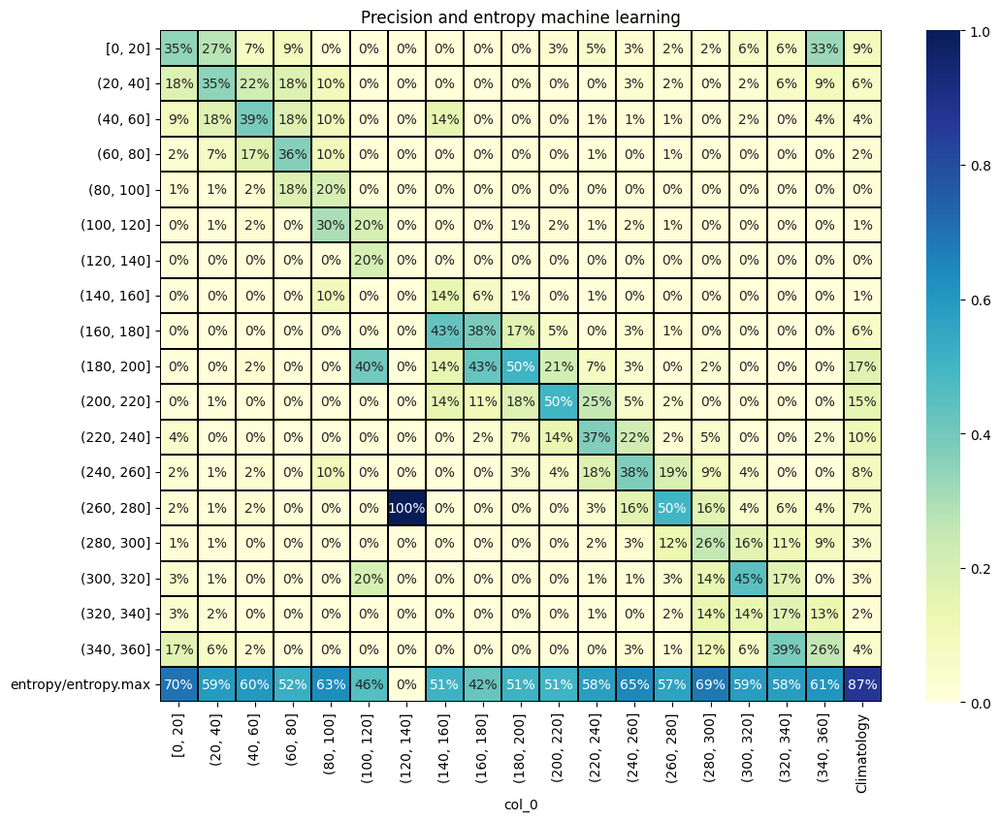

...

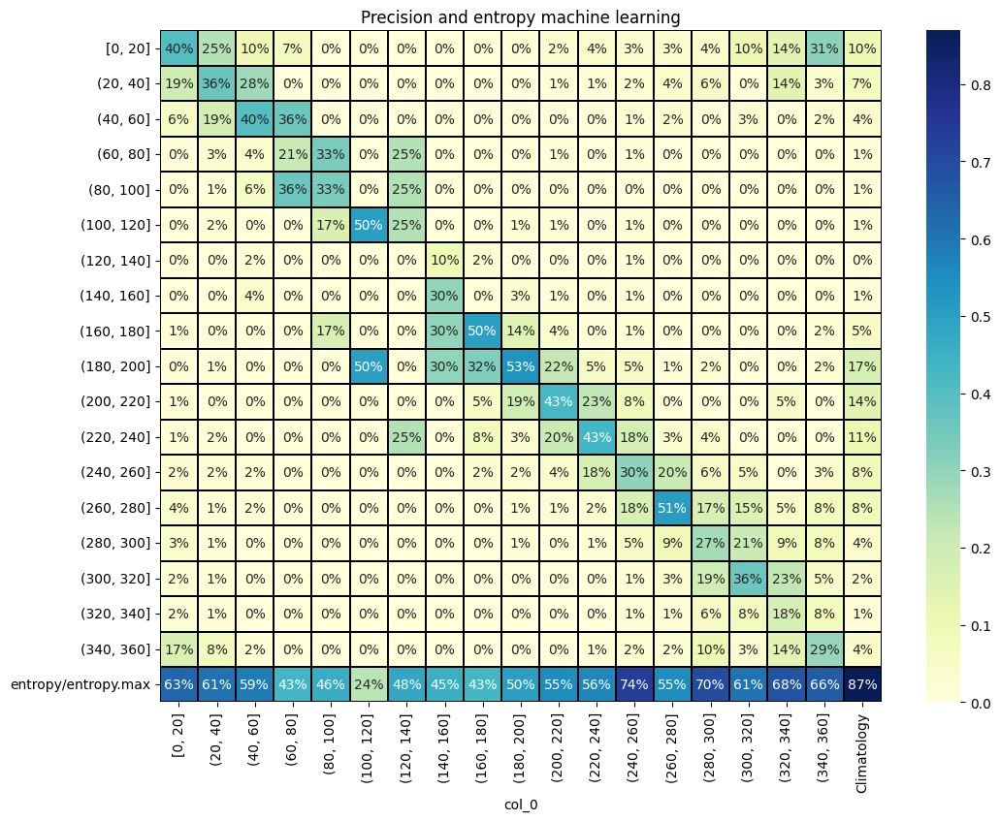

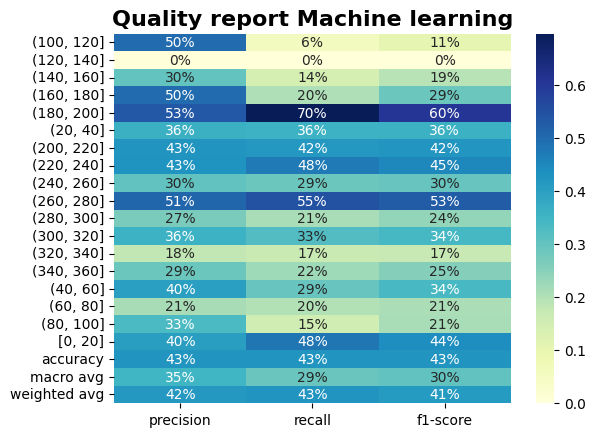

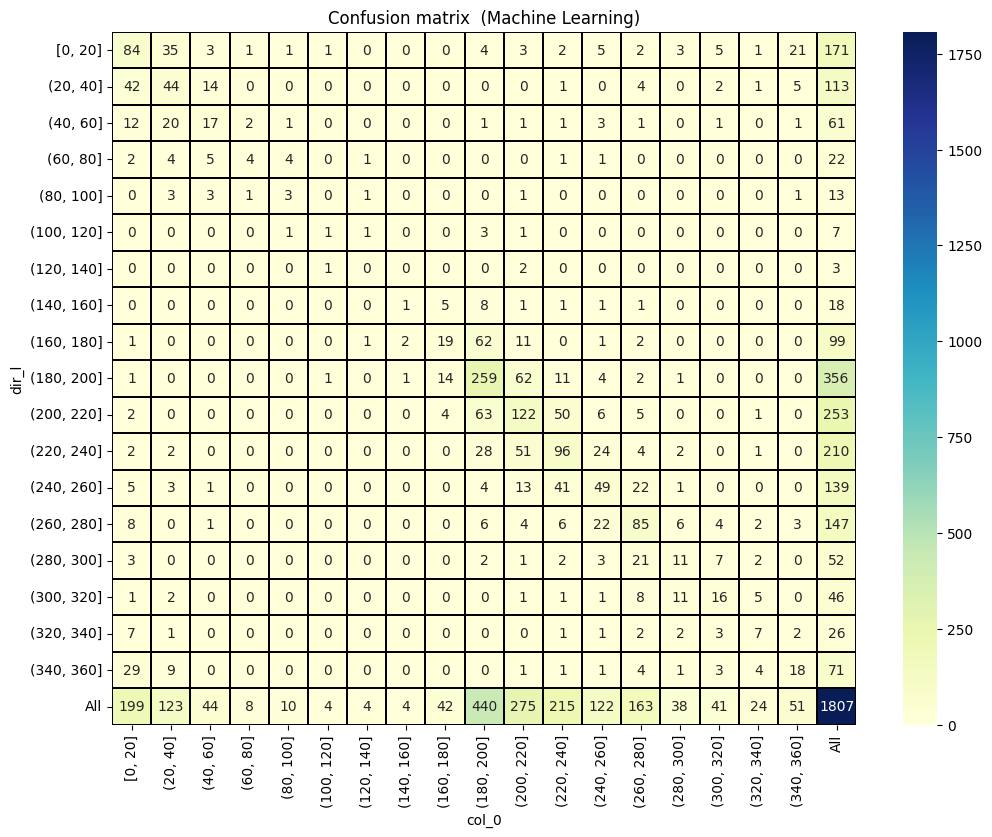

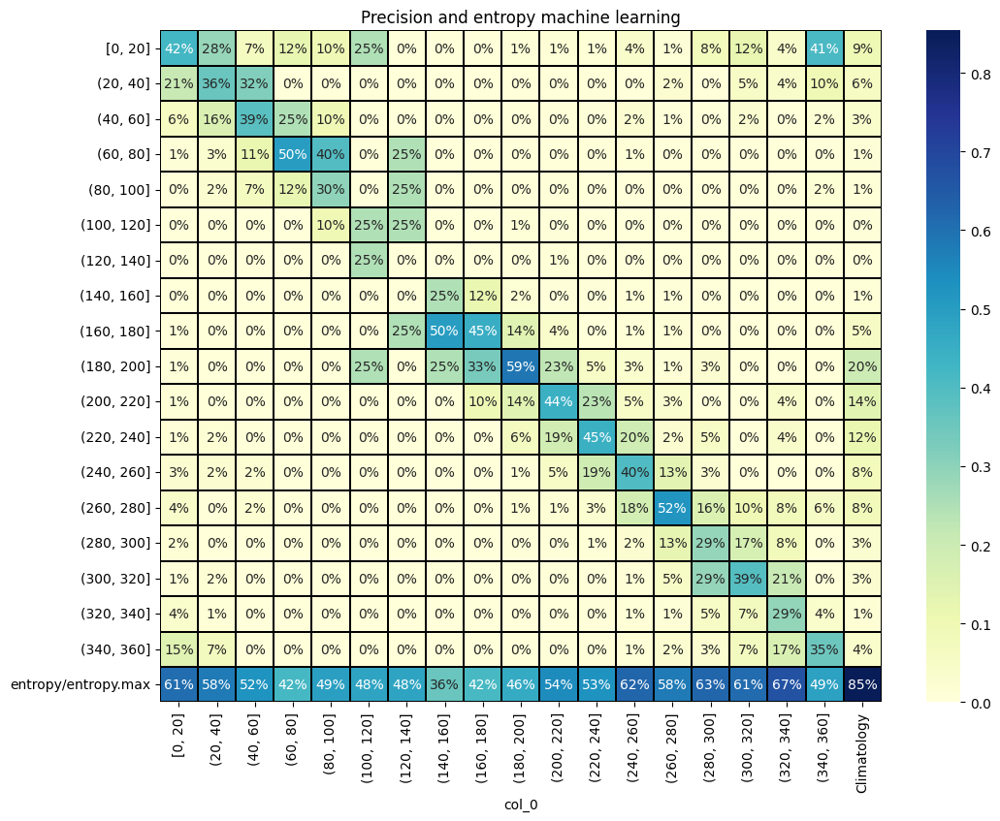

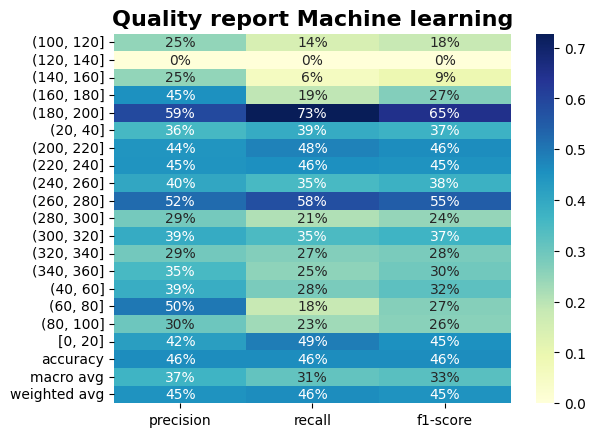


 accuracy mean of samples:  [0.45, 0.42, 0.43, 0.43, 0.46]


In [54]:
#@title Machine learning with time variables

df_all_h["hour"] = df_all_h.index.hour
df_all_h["month"] = df_all_h.index.month
df_all_h["dayofyear"] = df_all_h.index.dayofyear
df_all_h["weekofyear"] = df_all_h.index.isocalendar().week.astype(int)

Y = df_all_h.dir_l
X = df_all_h[['dir0_h', 'snow_prec0_h', 'isocero0_h', 'mod0_h', 'racha_u0_h',
       'racha_v0_h', 'mslp0_h', 'temp0_h', 'rh0_h', 'visibility0_h',
       'lhevapac0_h', 'lhsublac0_h', 'lwflx0_h', 'prec0_h', 'swflx0_h',
       'shflxac0_h', 'cape0_h', 'cin0_h', 'cfh0_h', 'cfl0_h', 'cfm0_h',
       'cft0_h', 'HGT5000_h', 'HGT8500_h', 'T5000_h', 'T8500_h', 'dir1_h',
       'snow_prec1_h', 'isocero1_h', 'mod1_h', 'racha_u1_h', 'racha_v1_h',
       'mslp1_h', 'temp1_h', 'rh1_h', 'visibility1_h', 'lhevapac1_h',
       'lhsublac1_h', 'lwflx1_h', 'prec1_h', 'swflx1_h', 'shflxac1_h',
       'cape1_h', 'cin1_h', 'cfh1_h', 'cfl1_h', 'cfm1_h', 'cft1_h',
       'HGT5001_h', 'HGT8501_h', 'T5001_h', 'T8501_h', 'hour',
       'month', 'dayofyear', 'weekofyear']]

# mean accuracy machine learning sample array
acc_ml_a = []

#seed random function to create TWO RELATED samples of scores
np.random.seed(1)

for t in range (0,5):
  #split variables
  X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size=0.20, )

  #ml_model = RandomForestClassifier().fit(X_train,y_train)
  ml_model = ExtraTreesClassifier().fit(X_train,y_train)

  y_pred = ml_model.predict(X_test)
  acc_ml_a.append(round(accuracy_score(y_test, y_pred),2))

  #Confusion matrix
  plt.figure(figsize=(12, 9))
  plt.title("Confusion matrix  (Machine Learning)")
  cm = pd.crosstab(y_test, ml_model.predict(X_test),margins=True,)
  comuns = [element for element in labels+["All"] if element in cm.columns]
  seab = sns.heatmap(cm[comuns],annot=True,cmap="YlGnBu",fmt='.0f',linewidths=.2,linecolor='black');
  plt.show()

  plt.figure(figsize=(12, 9))
  plt.title("Precision and entropy machine learning")
  column_sc = pd.crosstab(y_test, ml_model.predict(X_test), margins=True,normalize="columns")
  column_sc = column_sc.append(pd.DataFrame(entropy(column_sc,base=2)/(math.log2(column_sc.shape[0])),columns=["entropy/entropy.max"],
                    index=column_sc.columns).T).rename(columns={"All":"Climatology"})
  comuns = [element for element in labels+["Climatology"] if element in column_sc.columns]                  
  seab = sns.heatmap(column_sc[comuns],annot=True,cmap="YlGnBu",fmt='.0%',linewidths=.2,linecolor='black');
  plt.show()
  #quality report
  #print("\nQuality report (Machine Learning)\n")

  df_d = pd.DataFrame(classification_report(y_test, ml_model.predict(X_test),output_dict=True)).T.iloc[:, :3]
  seab = sns.heatmap(df_d,annot=True,cmap="YlGnBu",fmt='.0%',)
  seab.set_title("Quality report Machine learning", fontsize=16, fontweight='bold')
  plt.show()
  #print(pd.DataFrame(classification_report(y_test, ml_model.predict(X_test),output_dict=True)).T)


print("\n accuracy mean of samples: ",acc_ml_a)


In [55]:
#@title Feature importance
def format_as_percentage(value):
    return '{:.1%}'.format(value)
fea_imp =pd.DataFrame({"feature":X.columns,
                      "importance":[(importance/(sum(ml_model.feature_importances_))) for importance in ml_model.feature_importances_]})
fea_imp["feature_per"] =  fea_imp['importance'].map(format_as_percentage) 
fea_sort = fea_imp.sort_values(by="importance",ascending=False)
fea_sort[["feature","feature_per"]][:10]

,feature,feature_per
26,dir1_h,4.2%
31,racha_v1_h,4.1%
0,dir0_h,4.0%
5,racha_v0_h,3.9%
4,racha_u0_h,3.0%
30,racha_u1_h,2.8%
3,mod0_h,2.2%
29,mod1_h,2.2%
52,hour,2.1%
15,shflxac0_h,2.1%


In [57]:
#@title T test two related samples. This is a test for the null hypothesis that two related samples have identical accuracy means. Alternative hypothesis the mean of the distribution underlying the sample without time variables is less than the mean of the distribution underlying the sample with time variables. Significance level (alpha) = 0.01
from scipy import stats

alpha = 0.01
sta, p_value = stats.ttest_rel(acc_ml, acc_ml_a, alternative="less")

print("\nmeans without time variables:", acc_ml)
print("\nmeans with time variables:", acc_ml_a)

print("\nalpha: ",alpha)

print("\np_value point: ",p_value)
if p_value < alpha:    
    print("\nwe are rejecting null hypothesis  H0: accuracy mean machine learning without time variables = accuracy mean machine learning with time variables")
    print("\nwe are accepting alternative hypothesis: the mean of the sample without time variables inputs is less than the mean of the sample with time variables inputs")
else:
    print("\nwe are accepting null hypothesis:  H0: accuracy mean machine learning without time variables = accuracy mean machine learning with time variables ")




means without time variables: [0.46, 0.41, 0.44, 0.43, 0.46]

means with time variables: [0.45, 0.42, 0.43, 0.43, 0.46]

alpha:  0.01

p_value point:  0.6893458524812515

we are accepting null hypothesis:  H0: accuracy mean machine learning without time variables = accuracy mean machine learning with time variables 


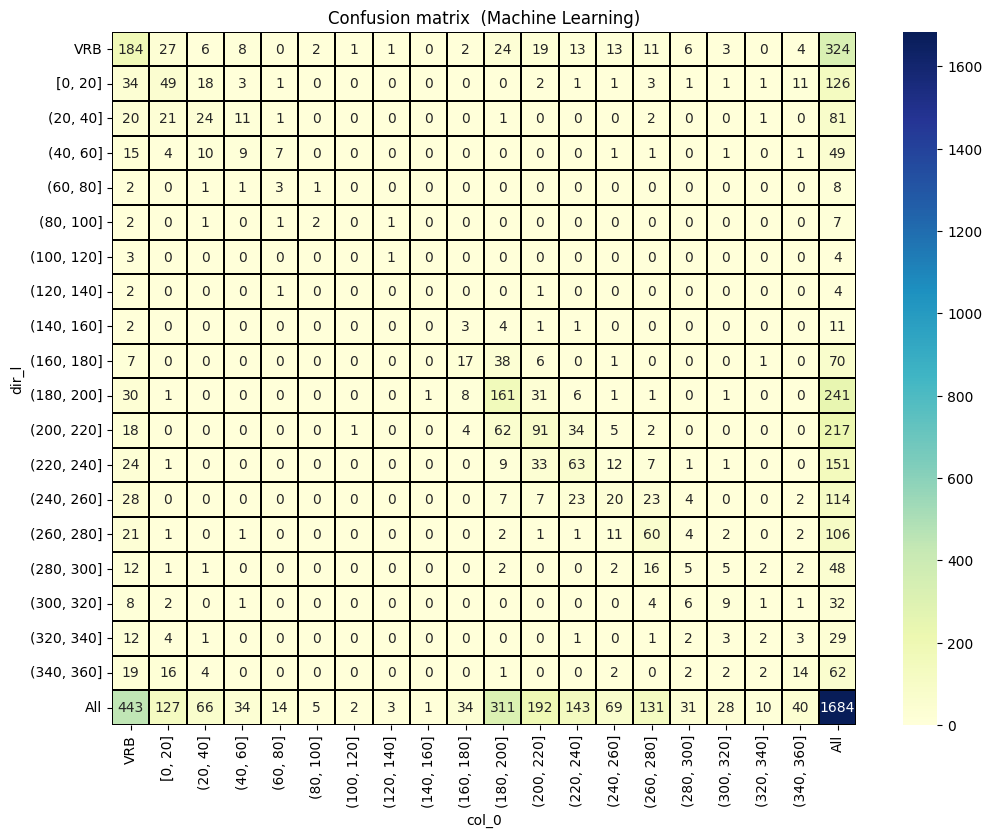

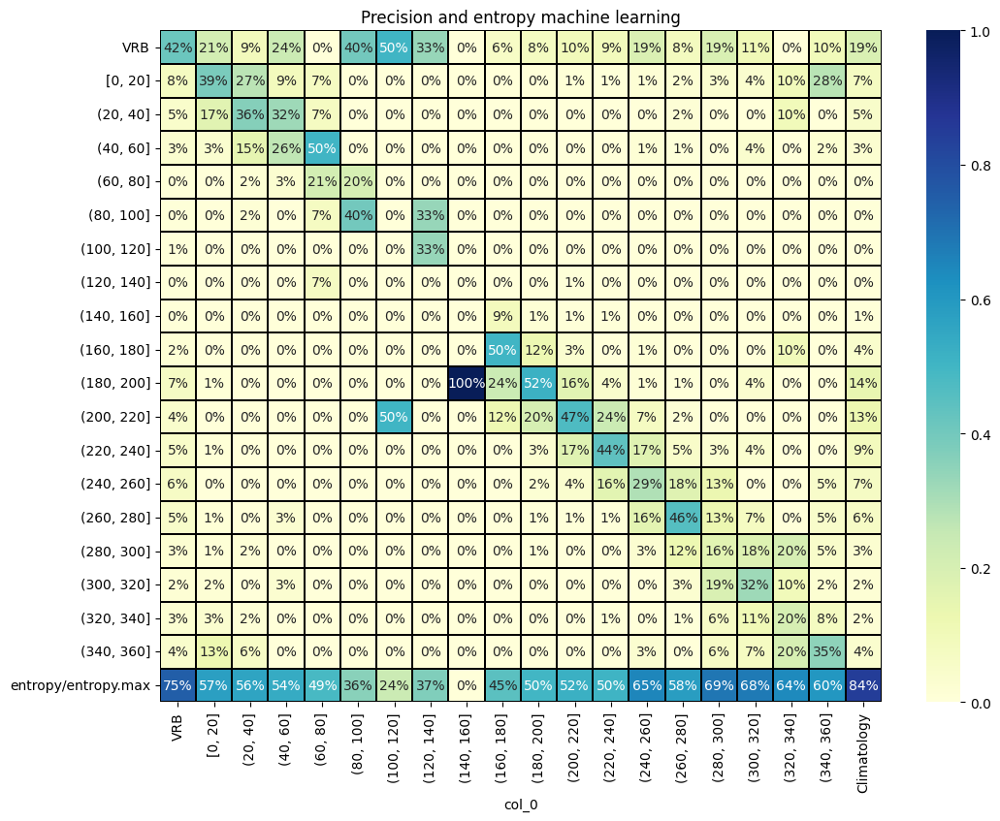

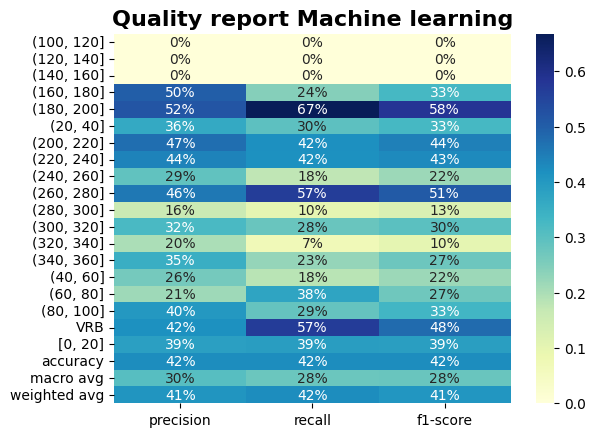

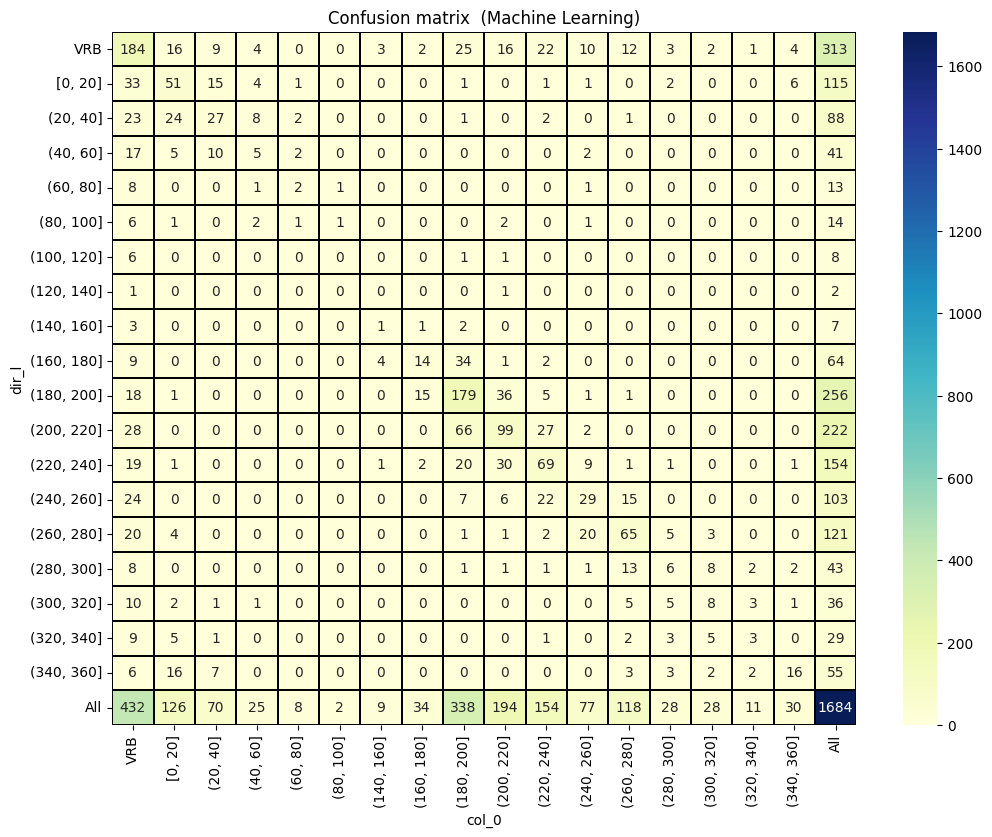

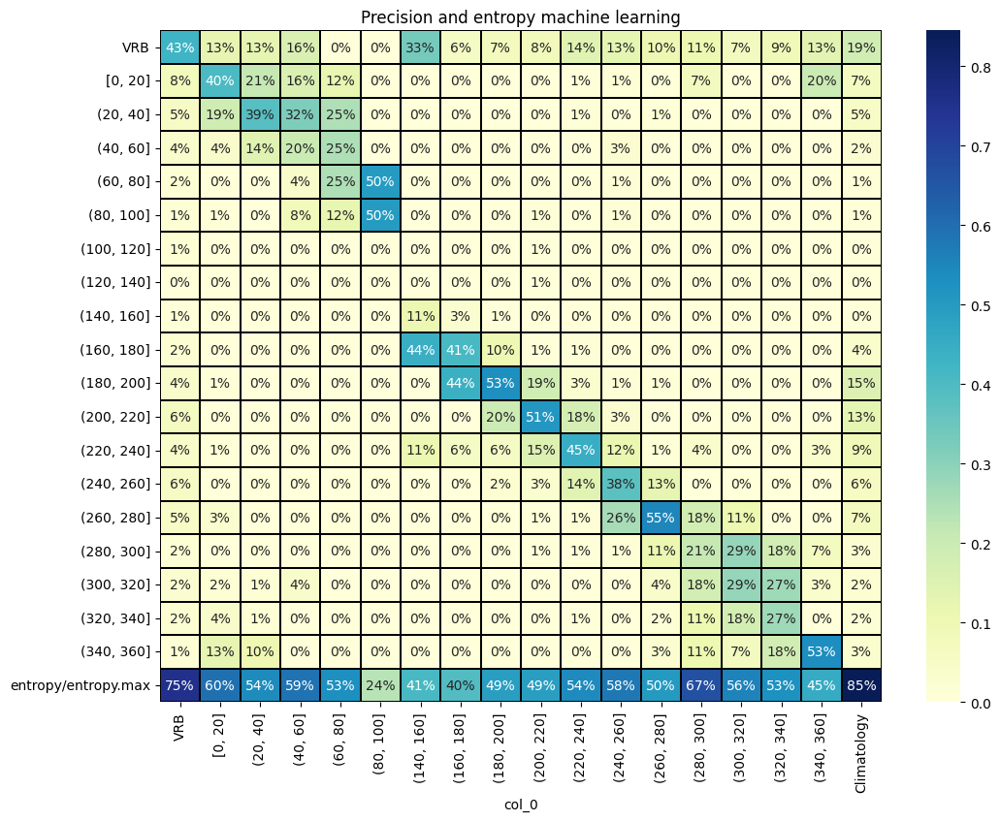

...

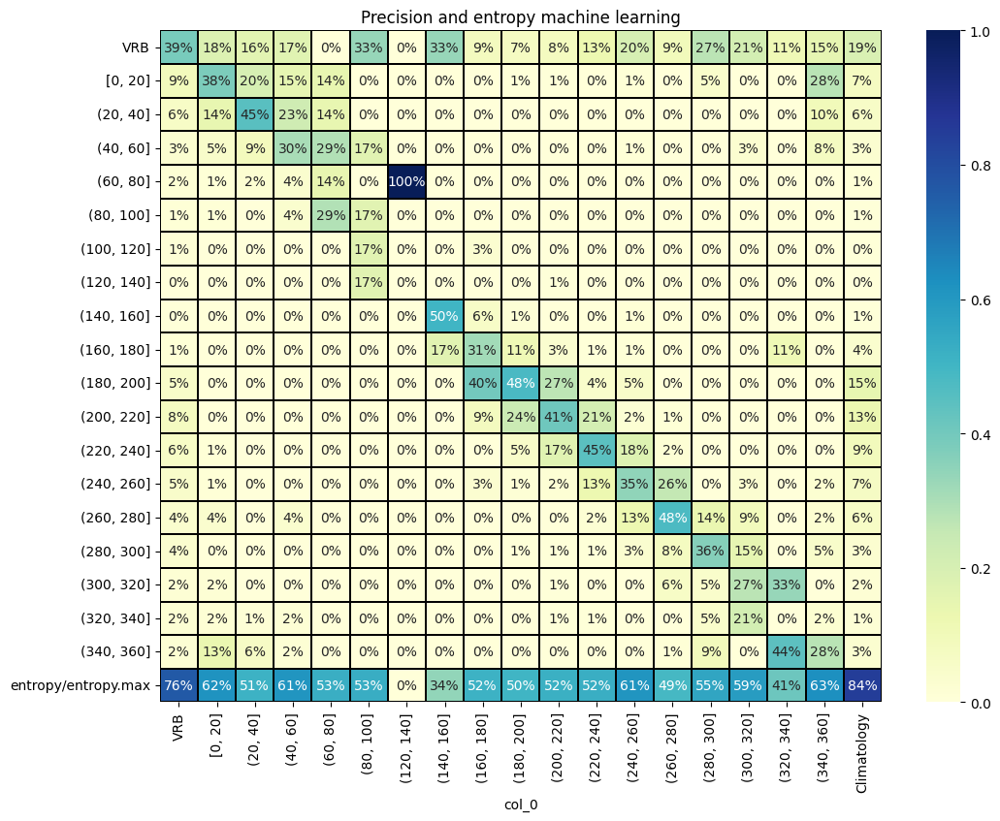

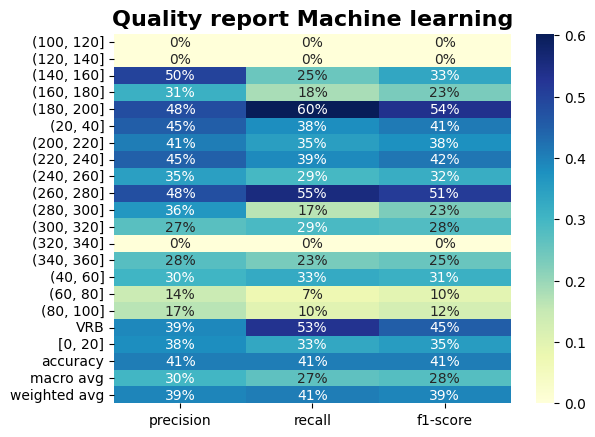

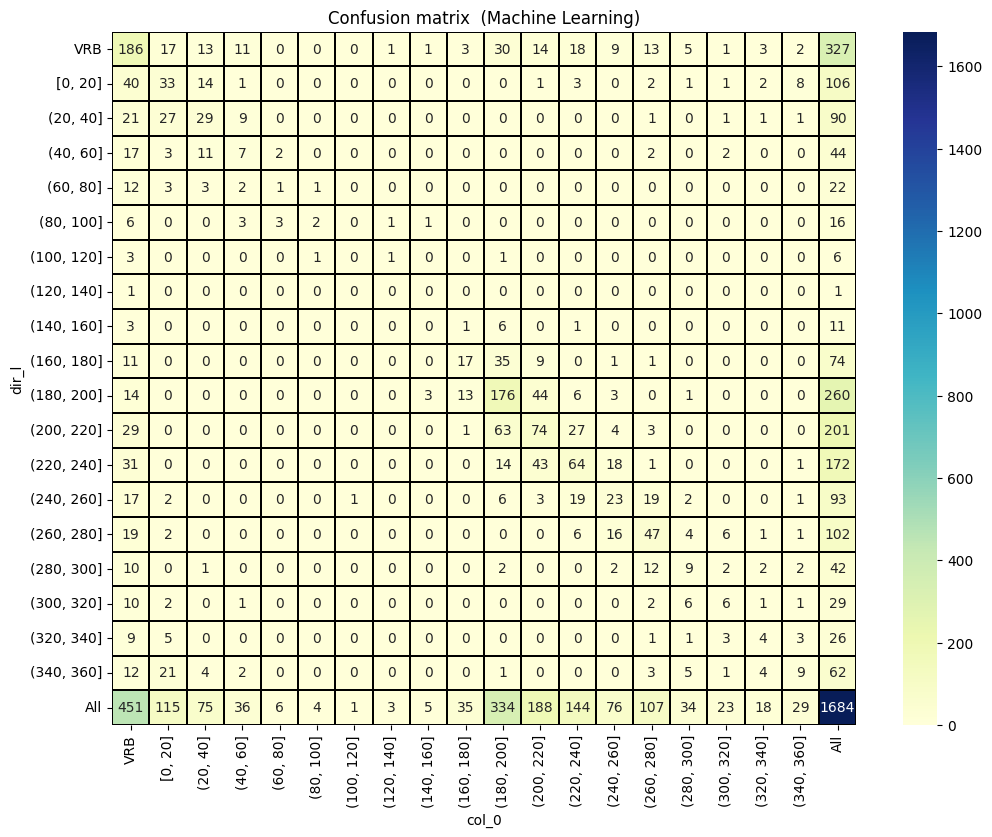

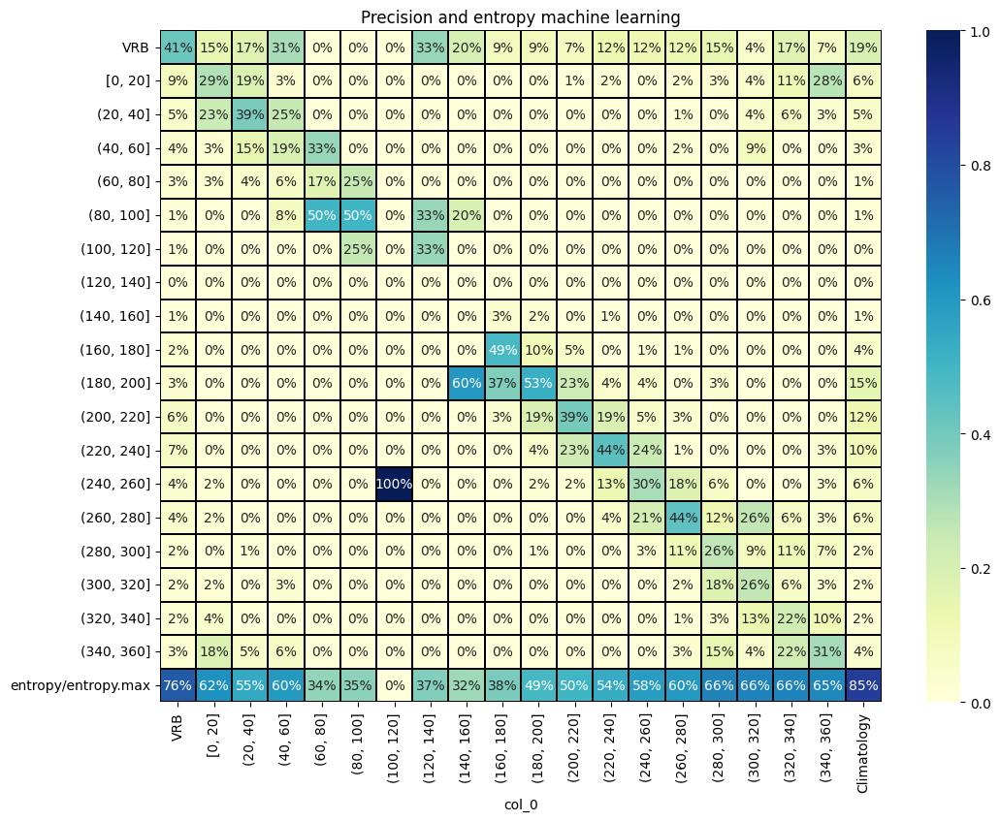

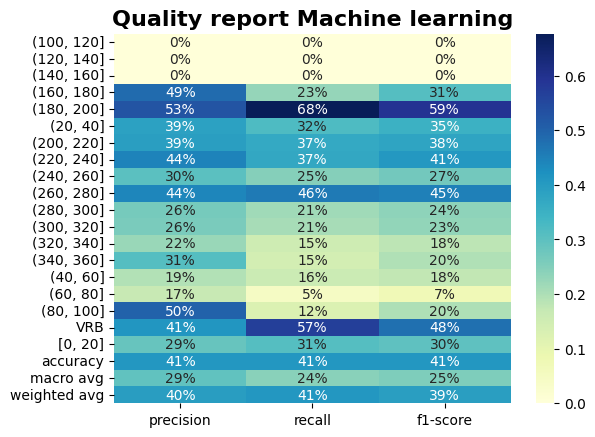


 accuracy mean of samples:  [0.42, 0.45, 0.4, 0.41, 0.41]


In [58]:
#@title Machine learning with output vrb and time variables
# X and Y
df_vrb_h["hour"] = df_vrb_h.index.hour
df_vrb_h["month"] = df_vrb_h.index.month
df_vrb_h["dayofyear"] = df_vrb_h.index.dayofyear
df_vrb_h["weekofyear"] = df_vrb_h.index.isocalendar().week.astype(int)
Y = df_vrb_h.dir_l
X = df_vrb_h[['dir0_h', 'snow_prec0_h', 'isocero0_h', 'mod0_h', 'racha_u0_h',
       'racha_v0_h', 'mslp0_h', 'temp0_h', 'rh0_h', 'visibility0_h',
       'lhevapac0_h', 'lhsublac0_h', 'lwflx0_h', 'prec0_h', 'swflx0_h',
       'shflxac0_h', 'cape0_h', 'cin0_h', 'cfh0_h', 'cfl0_h', 'cfm0_h',
       'cft0_h', 'HGT5000_h', 'HGT8500_h', 'T5000_h', 'T8500_h', 'dir1_h',
       'snow_prec1_h', 'isocero1_h', 'mod1_h', 'racha_u1_h', 'racha_v1_h',
       'mslp1_h', 'temp1_h', 'rh1_h', 'visibility1_h', 'lhevapac1_h',
       'lhsublac1_h', 'lwflx1_h', 'prec1_h', 'swflx1_h', 'shflxac1_h',
       'cape1_h', 'cin1_h', 'cfh1_h', 'cfl1_h', 'cfm1_h', 'cft1_h',
       'HGT5001_h', 'HGT8501_h', 'T5001_h', 'T8501_h', 'hour',
       'month', 'dayofyear', 'weekofyear']]

# mean accuracy machine learning sample array
acc_ml_a = []

#seed random function to create TWO RELATED samples of scores
np.random.seed(1)

for t in range (0,5):
  #split variables
  X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size=0.15, )

  #ml_model = RandomForestClassifier().fit(X_train,y_train)
  ml_model = ExtraTreesClassifier().fit(X_train,y_train)

  y_pred = ml_model.predict(X_test)
  acc_ml_a.append(round(accuracy_score(y_test, y_pred),2))

  #Confusion matrix
  plt.figure(figsize=(12, 9))
  plt.title("Confusion matrix  (Machine Learning)")
  cm = pd.crosstab(y_test, ml_model.predict(X_test),margins=True,)
  comuns = [element for element in labels+["All"] if element in cm.columns]
  seab = sns.heatmap(cm[comuns],annot=True,cmap="YlGnBu",fmt='.0f',linewidths=.2,linecolor='black');
  plt.show()

  plt.figure(figsize=(12, 9))
  plt.title("Precision and entropy machine learning")
  column_sc = pd.crosstab(y_test, ml_model.predict(X_test), margins=True,normalize="columns")
  column_sc = column_sc.append(pd.DataFrame(entropy(column_sc,base=2)/(math.log2(column_sc.shape[0])),columns=["entropy/entropy.max"],
                    index=column_sc.columns).T).rename(columns={"All":"Climatology"})
  comuns = [element for element in labels+["Climatology"] if element in column_sc.columns]                  
  seab = sns.heatmap(column_sc[comuns],annot=True,cmap="YlGnBu",fmt='.0%',linewidths=.2,linecolor='black');
  plt.show()
  #quality report
  #print("\nQuality report (Machine Learning)\n")

  df_d = pd.DataFrame(classification_report(y_test, ml_model.predict(X_test),output_dict=True)).T.iloc[:, :3]
  seab = sns.heatmap(df_d,annot=True,cmap="YlGnBu",fmt='.0%',)
  seab.set_title("Quality report Machine learning", fontsize=16, fontweight='bold')
  plt.show()
  #print(pd.DataFrame(classification_report(y_test, ml_model.predict(X_test),output_dict=True)).T)


print("\n accuracy mean of samples: ",acc_ml_a)


In [4]:
#@title Nearest points WRF
import plotly.express as px
import pandas as pd
import numpy as np

coor = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/LEVX_1km/input_files/distan_lat42.22lon-8.63p2R1Km.csv")
px.set_mapbox_access_token("pk.eyJ1IjoiZ3JhbmFudHVpbiIsImEiOiJja3B4dGU4OTkwMTFmMm9ycnNhMjJvaGJqIn0.VWzx_PkD9A5cSUVsn_ijCA")
px.scatter_mapbox(coor, hover_data=['distance'],lat='lat', lon='lon',color='distance', title="Nearest points",
                           color_continuous_scale=px.colors.cyclical.IceFire,)

In [5]:
#@title Load forecast day 0 WRF
#forecast d0
model_w = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/LEVX_1km/Harmonie_wrf_ml/lat42.22lon-8.63p2R1KmD0.csv",
                      parse_dates=["time"]).drop(columns="Unnamed: 0").set_index("time").add_suffix("_w")
model_w

,dir0_w,snow_prec0_w,snowlevel0_w,mod0_w,wind_gust0_w,mslp0_w,temp0_w,rh0_w,visibility0_w,lhflx0_w,...,cape1_w,cin1_w,cfh1_w,cfl1_w,cfm1_w,cft1_w,HGT5001_w,HGT8501_w,T5001_w,T8501_w
time,,,,,,,,,,,,,,,,,,,,,
2021-12-01 01:00:00,166.911270,0.0,1625.594238,0.361933,0.679581,102632.210938,282.382812,0.929759,24061.806641,4.030115,...,0.0,-0.000328,0.3,0.601562,0.000000,0.601562,5646.108887,1533.587524,255.103317,276.895569
2021-12-01 02:00:00,157.827881,0.0,1645.491699,1.773587,2.104271,102598.085938,282.279694,0.880547,24050.435547,15.518686,...,0.0,0.000473,0.2,0.734375,0.000000,0.734375,5642.350586,1530.741821,254.826126,277.271698
2021-12-01 03:00:00,140.719955,0.0,1639.967285,1.348037,1.556662,102591.640625,282.212067,0.889738,24038.398438,11.090862,...,0.0,0.000410,0.0,0.600000,0.000000,0.600000,5639.416016,1529.590820,254.576065,277.138367
2021-12-01 04:00:00,140.801147,0.0,1622.247803,0.883917,1.118278,102608.726562,282.409760,0.905160,24231.185547,6.518489,...,0.0,-0.000141,0.5,0.429233,0.000000,0.500000,5639.175781,1530.439697,254.532379,277.054871
2021-12-01 05:00:00,144.839371,0.0,1638.611938,1.165346,1.494052,102507.921875,282.528992,0.929299,24233.095703,5.641890,...,0.0,-0.000164,0.2,0.517772,0.000000,0.517772,5635.609375,1526.107178,254.994125,277.071564
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-03-15 19:00:00,129.695374,0.0,2334.270752,2.231283,3.630835,101367.210938,284.927490,0.793242,24135.000000,4.315404,...,0.0,-0.000009,0.0,95.000000,70.000000,95.000000,5622.276855,1471.773315,258.207428,282.687744
2023-03-15 20:00:00,129.415817,0.0,2344.966064,1.868026,5.556952,101334.289062,283.514313,0.873175,24135.000000,1.560750,...,0.0,0.000007,0.0,99.000000,55.438789,99.000000,5619.732910,1469.582153,258.180573,282.860260
2023-03-15 21:00:00,172.619675,0.0,2267.495361,3.296074,5.206084,101344.601562,283.654907,0.820962,24135.000000,3.992739,...,0.0,0.000050,0.0,100.000000,81.622391,100.000000,5617.945801,1469.441528,257.984253,282.244385


In [21]:
#@title Concatenate WRF and station data. Delete rows with wind direction variable obseved

df_vrb_w = pd.concat([station,model_w],axis=1).drop(columns=["spd_o","spd_o_kt"]).dropna()
print("Dataframe with wind variable")
print("Time from:",df_vrb_w.index[0],"to:",df_vrb_w.index[-1], "number of measures:",len(df_vrb_w.index))
df_all_w = df_vrb_w[df_vrb_w.dir_o!=-1]
print("dataframe without wind variable")
print("Time from:",df_all_w.index[0],"to:",df_all_w.index[-1], "number of measures:",len(df_all_w.index))
df_all_w

Dataframe with wind variable
Time from: 2021-12-01 01:00:00 to: 2023-03-14 23:00:00 number of measures: 10618
dataframe without wind variable
Time from: 2021-12-01 01:00:00 to: 2023-03-14 23:00:00 number of measures: 8579


,dir_o,dir_l,dir0_w,snow_prec0_w,snowlevel0_w,mod0_w,wind_gust0_w,mslp0_w,temp0_w,rh0_w,...,cape1_w,cin1_w,cfh1_w,cfl1_w,cfm1_w,cft1_w,HGT5001_w,HGT8501_w,T5001_w,T8501_w
time,,,,,,,,,,,,,,,,,,,,,
2021-12-01 01:00:00,220.0,"(200, 220]",166.911270,0.0,1625.594238,0.361933,0.679581,102632.210938,282.382812,0.929759,...,0.000,-0.000328,0.300000,0.601562,0.000000,0.601562,5646.108887,1533.587524,255.103317,276.895569
2021-12-01 02:00:00,220.0,"(200, 220]",157.827881,0.0,1645.491699,1.773587,2.104271,102598.085938,282.279694,0.880547,...,0.000,0.000473,0.200000,0.734375,0.000000,0.734375,5642.350586,1530.741821,254.826126,277.271698
2021-12-01 03:00:00,220.0,"(200, 220]",140.719955,0.0,1639.967285,1.348037,1.556662,102591.640625,282.212067,0.889738,...,0.000,0.000410,0.000000,0.600000,0.000000,0.600000,5639.416016,1529.590820,254.576065,277.138367
2021-12-01 04:00:00,210.0,"(200, 220]",140.801147,0.0,1622.247803,0.883917,1.118278,102608.726562,282.409760,0.905160,...,0.000,-0.000141,0.500000,0.429233,0.000000,0.500000,5639.175781,1530.439697,254.532379,277.054871
2021-12-01 05:00:00,200.0,"(180, 200]",144.839371,0.0,1638.611938,1.165346,1.494052,102507.921875,282.528992,0.929299,...,0.000,-0.000164,0.200000,0.517772,0.000000,0.517772,5635.609375,1526.107178,254.994125,277.071564
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-03-14 19:00:00,270.0,"(260, 280]",244.918228,0.0,1737.364868,0.520581,3.198420,102387.101562,283.928497,0.951989,...,13.426,-1.077727,17.919308,96.000000,90.400002,96.000000,5641.943848,1512.545410,256.380249,277.710815
2023-03-14 20:00:00,210.0,"(200, 220]",195.800827,0.0,1775.522705,0.776822,3.269660,102352.007812,283.386292,0.974015,...,14.160,-0.000203,28.482769,75.900002,75.900002,75.900002,5646.099121,1512.716431,256.771942,278.039886
2023-03-14 21:00:00,210.0,"(200, 220]",232.370193,0.0,1795.778442,1.177359,3.146667,102417.320312,283.298553,0.969332,...,12.804,-0.074594,23.748730,4.800000,3.700000,23.748730,5651.707031,1515.995728,257.180115,277.977325


In [22]:
#@title Label meteorological points variable dir0 as dir0_h_l and observed wind direction label as dir_l

#df_all_w["dir0_w_l"] = pd.cut(df_all_w["dir0_w"], bins=interval,retbins=False,labels=labels).map({a:b for a,b in zip(interval,labels)}).astype('category')
df_all_w.loc[:, "dir0_w_l"] = pd.cut(df_all_w["dir0_w"], bins=interval, retbins=False, labels=labels).map({a:b for a,b in zip(interval,labels)}).astype('category')

df_all_w[["dir_l","dir0_w_l"]].sample(20)

<ipython-input-22-49b922afa4e3>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,dir_l,dir0_w_l
time,,
2022-10-09 19:00:00,"(180, 200]","(160, 180]"
2021-12-15 03:00:00,"(220, 240]","(140, 160]"
2022-03-23 11:00:00,"(80, 100]","(100, 120]"
2022-11-27 12:00:00,"(180, 200]","(140, 160]"
2022-01-18 07:00:00,"(220, 240]","(140, 160]"
2022-11-17 05:00:00,"(160, 180]","(260, 280]"
2022-12-21 02:00:00,"(200, 220]","(160, 180]"
2022-05-22 10:00:00,"(260, 280]","(200, 220]"
2022-02-05 03:00:00,"[0, 20]","[0, 20]"


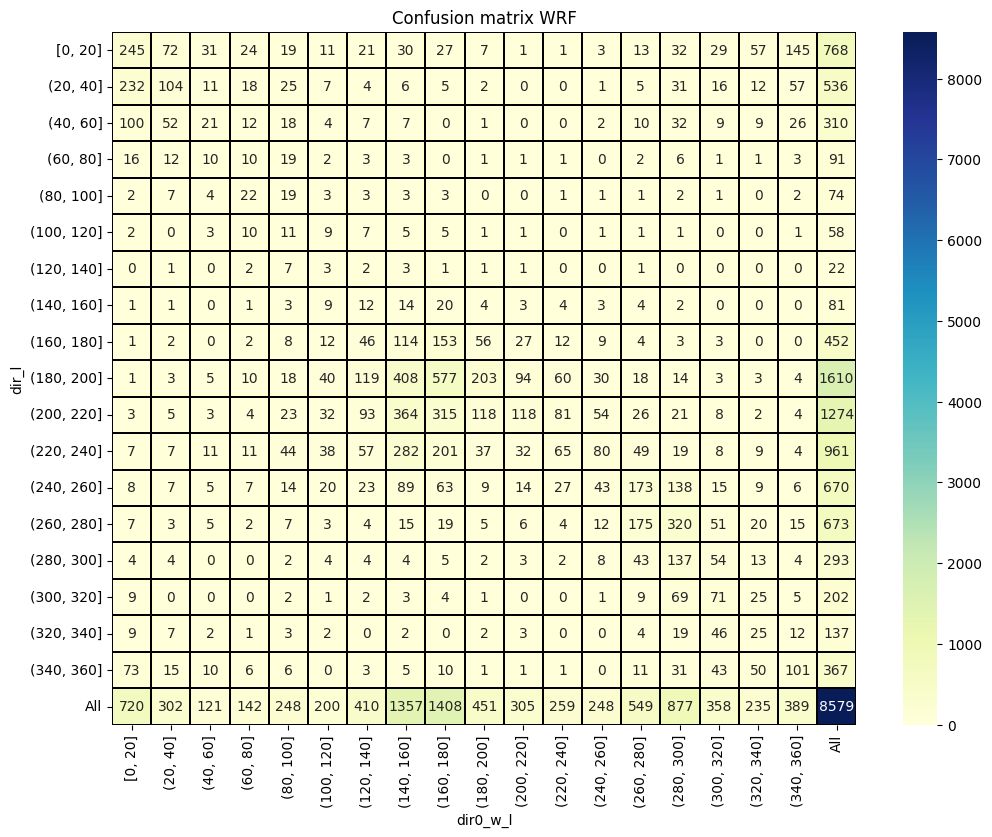

In [24]:
#@title Confusion matrix WRF

from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 9))
plt.title("Confusion matrix WRF")

global_sc = pd.crosstab(df_all_w.dir_l, df_all_w.dir0_w_l,margins=True,)
sns.heatmap(global_sc,annot=True,cmap="YlGnBu",fmt='.0f',linewidths=.2,linecolor='black');

<ipython-input-25-b761cb96f78b>:9: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



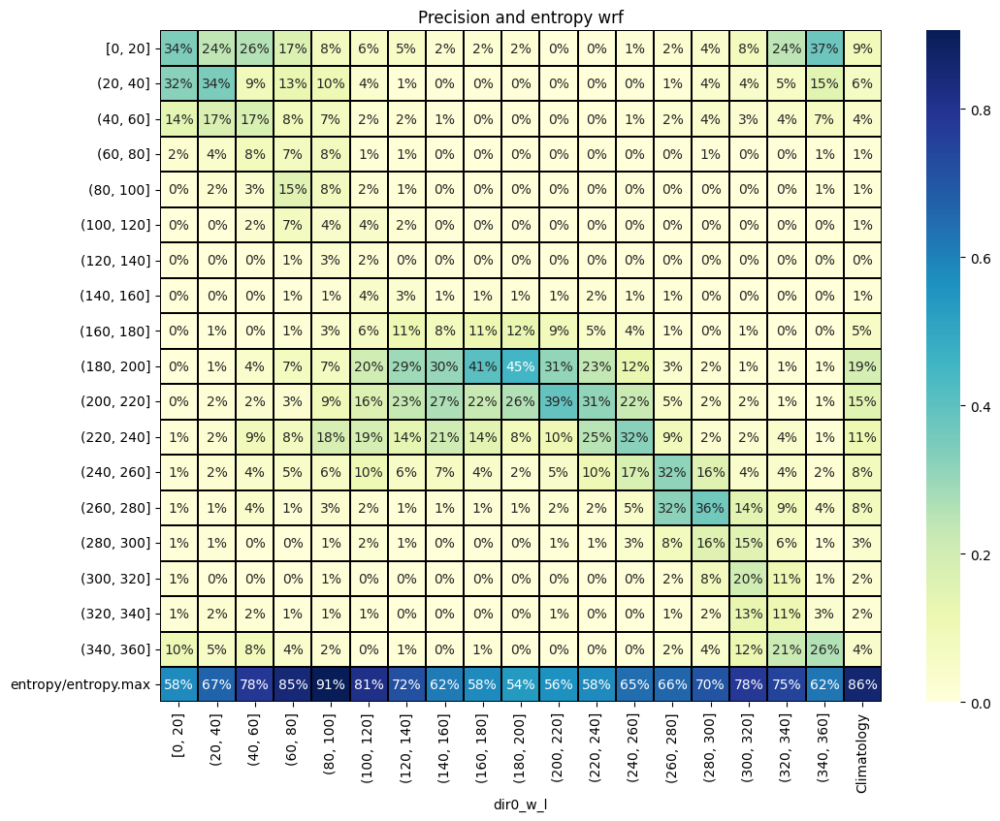

In [25]:
#@title Precision and entropy

import math
from scipy.stats import entropy

plt.figure(figsize=(12, 9))
plt.title("Precision and entropy wrf")
column_sc = pd.crosstab(df_all_w.dir_l, df_all_w.dir0_w_l, margins=True,normalize="columns")
column_sc = column_sc.append(pd.DataFrame(entropy(column_sc,base=2)/(math.log2(column_sc.shape[0])),columns=["entropy/entropy.max"],
                    index=column_sc.columns).T).rename(columns={"All":"Climatology"})
sns.heatmap(column_sc,annot=True,cmap="YlGnBu",fmt='.0%',linewidths=.2,linecolor='black');

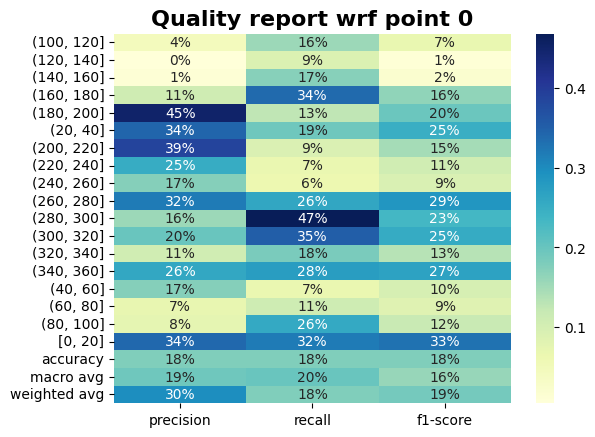

In [26]:

#@title Meteorological model score point 0

cr = pd.DataFrame(classification_report(df_all_w.dir_l, df_all_w.dir0_w_l,output_dict=True)).T.sort_index()
seab = sns.heatmap(cr.drop(columns=["support"]),annot=True,cmap="YlGnBu",fmt='.0%',)
seab.set_title("Quality report wrf point 0", fontsize=16, fontweight='bold')
plt.show()

In [29]:
#@title Test association between observed variable and meteorological model (point 0) (Pearson’s chi square test). Significance level (alpha) = 0.01
#two way table
from scipy.stats import chi2_contingency

alpha = 0.01

#stadistic(sta), pvalue (p), degrees of freedom (dof) and expected values (exp)
sta, p, dof, exp = chi2_contingency(pd.crosstab(df_all_w.dir_l,df_all_w.dir0_w_l))

#degrees of freedoom (rows-1)*(columns-1) to test associationbetween two variables

print('p-value:',p)
print('Significance level:',alpha)
print('Degres of of freedom: ',dof)
print("Stadistic",sta)

if p<=alpha:
    print("Reject H0,There is an association between meteorological model variables and observed values")
else:
    print("Retain H0,There is no association between meteorological model variables and observed values")


if pd.crosstab(df_all_w.dir_l,df_all_w.dir0_w_l).min().min()<5:
  print("All cells must be more than five!!!. No Chi square test posible")

p-value: 0.0
Significance level: 0.01
Degres of of freedom:  289
Stadistic 12747.506016175303
Reject H0,There is an association between meteorological model variables and observed values
All cells must be more than five!!!. No Chi square test posible


In [32]:
#@title Machine learning forecast with lazypredict. Forecast without variable winds
from sklearn.model_selection import train_test_split
import lazypredict
from lazypredict.Supervised import LazyClassifier


# X and Y
Y = df_all_w.dir_l
X = df_all_w[['dir0_w', 'snow_prec0_w', 'snowlevel0_w', 'mod0_w',
       'wind_gust0_w', 'mslp0_w', 'temp0_w', 'rh0_w', 'visibility0_w',
       'lhflx0_w', 'lwflx0_w', 'conv_prec0_w', 'prec0_w', 'swflx0_w',
       'shflx0_w', 'cape0_w', 'cin0_w', 'cfh0_w', 'cfl0_w', 'cfm0_w', 'cft0_w',
       'HGT5000_w', 'HGT8500_w', 'T5000_w', 'T8500_w', 'dir1_w',
       'snow_prec1_w', 'snowlevel1_w', 'mod1_w', 'wind_gust1_w', 'mslp1_w',
       'temp1_w', 'rh1_w', 'visibility1_w', 'lhflx1_w', 'lwflx1_w',
       'conv_prec1_w', 'prec1_w', 'swflx1_w', 'shflx1_w', 'cape1_w', 'cin1_w',
       'cfh1_w', 'cfl1_w', 'cfm1_w', 'cft1_w', 'HGT5001_w', 'HGT8501_w',
       'T5001_w', 'T8501_w']]

np.random.seed(1)
X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size=0.2, )


multiple_model = LazyClassifier(verbose =0, ignore_warnings = True,predictions=True)
models,predictions = multiple_model.fit(X_train,X_test,y_train,y_test)
display(models)
title = "Display y_pred for every machine learning model"
display(Markdown(f"**{title}**"))
display(predictions)

100%|██████████| 29/29 [03:22<00:00,  7.00s/it]


,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
ExtraTreesClassifier,0.42,0.28,None,0.41,1.94
RandomForestClassifier,0.42,0.28,None,0.41,5.14
LabelSpreading,0.36,0.26,None,0.36,8.75
LabelPropagation,0.36,0.26,None,0.36,6.07
LGBMClassifier,0.41,0.25,None,0.39,43.88
BaggingClassifier,0.38,0.24,None,0.36,6.37
KNeighborsClassifier,0.35,0.23,None,0.33,0.17
LinearDiscriminantAnalysis,0.33,0.22,None,0.30,0.48
DecisionTreeClassifier,0.31,0.22,None,0.31,0.53


**Display y_pred for every machine learning model**

,AdaBoostClassifier,BaggingClassifier,BernoulliNB,CalibratedClassifierCV,DecisionTreeClassifier,DummyClassifier,ExtraTreeClassifier,ExtraTreesClassifier,GaussianNB,KNeighborsClassifier,...,NearestCentroid,PassiveAggressiveClassifier,Perceptron,QuadraticDiscriminantAnalysis,RandomForestClassifier,RidgeClassifier,RidgeClassifierCV,SGDClassifier,SVC,LGBMClassifier
0,"(180, 200]","(180, 200]","(180, 200]","(180, 200]","(180, 200]","(180, 200]","(180, 200]","(180, 200]","(120, 140]","(180, 200]",...,"(160, 180]","(180, 200]","(180, 200]","(300, 320]","(180, 200]","(180, 200]","(180, 200]","(180, 200]","(180, 200]","(180, 200]"
1,"(180, 200]","(180, 200]","(180, 200]","(180, 200]","(180, 200]","(180, 200]","(180, 200]","(180, 200]","(60, 80]","(180, 200]",...,"(140, 160]","[0, 20]","(220, 240]","(260, 280]","(180, 200]","(180, 200]","(180, 200]","(180, 200]","(180, 200]","(180, 200]"
2,"(200, 220]","(180, 200]","(260, 280]","(180, 200]","(260, 280]","(180, 200]","[0, 20]","(180, 200]","(100, 120]","(180, 200]",...,"(260, 280]","(40, 60]","(60, 80]","(40, 60]","(180, 200]","(180, 200]","(180, 200]","(180, 200]","(180, 200]","(180, 200]"
3,"(20, 40]","(40, 60]","(80, 100]","[0, 20]","[0, 20]","(180, 200]","(80, 100]","(40, 60]","(100, 120]","(80, 100]",...,"(20, 40]","(20, 40]","(220, 240]","(80, 100]","(20, 40]","[0, 20]","[0, 20]","[0, 20]","(20, 40]","(20, 40]"
4,"[0, 20]","(340, 360]","(220, 240]","[0, 20]","[0, 20]","(180, 200]","(340, 360]","(340, 360]","(60, 80]","(20, 40]",...,"[0, 20]","(320, 340]","(20, 40]","(40, 60]","(340, 360]","[0, 20]","[0, 20]","[0, 20]","[0, 20]","(340, 360]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1711,"(280, 300]","[0, 20]","(300, 320]","(280, 300]","[0, 20]","(180, 200]","(340, 360]","[0, 20]","(100, 120]","[0, 20]",...,"(300, 320]","[0, 20]","[0, 20]","(40, 60]","[0, 20]","(260, 280]","(260, 280]","[0, 20]","(300, 320]","[0, 20]"
1712,"(280, 300]","(300, 320]","(320, 340]","(200, 220]","(320, 340]","(180, 200]","(320, 340]","(340, 360]","(120, 140]","(340, 360]",...,"(320, 340]","[0, 20]","[0, 20]","(40, 60]","(340, 360]","(180, 200]","(200, 220]","(340, 360]","(340, 360]","(340, 360]"
1713,"(180, 200]","(180, 200]","(40, 60]","(180, 200]","(180, 200]","(180, 200]","(180, 200]","(180, 200]","(100, 120]","(180, 200]",...,"(100, 120]","(40, 60]","(60, 80]","(40, 60]","(180, 200]","(180, 200]","(180, 200]","(180, 200]","(180, 200]","(180, 200]"
1714,"(20, 40]","[0, 20]","(220, 240]","(220, 240]","(220, 240]","(180, 200]","(240, 260]","(20, 40]","(60, 80]","(20, 40]",...,"[0, 20]","(200, 220]","(180, 200]","(40, 60]","(20, 40]","(220, 240]","(220, 240]","[0, 20]","[0, 20]","(20, 40]"


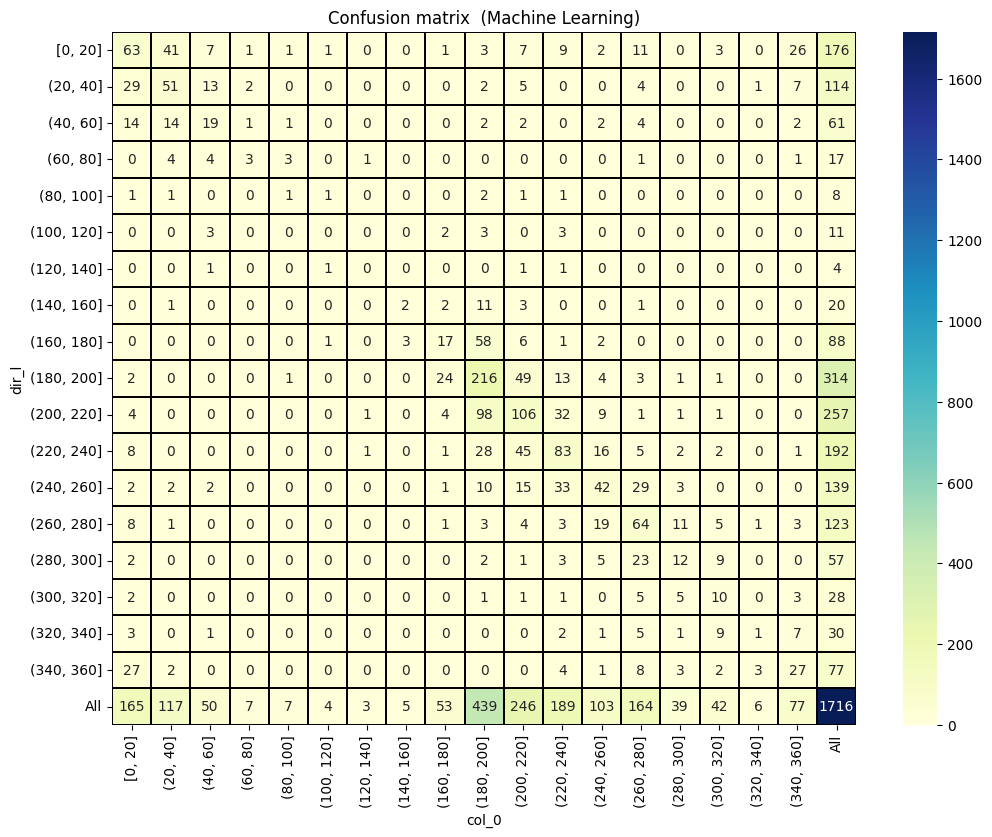

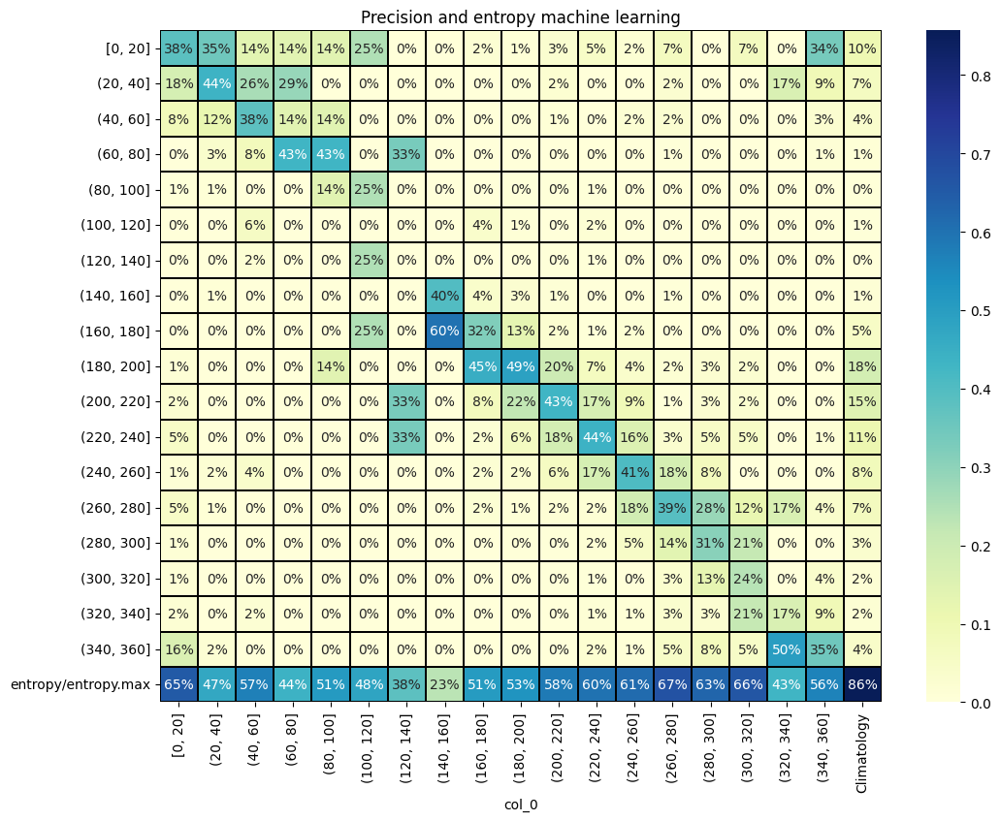

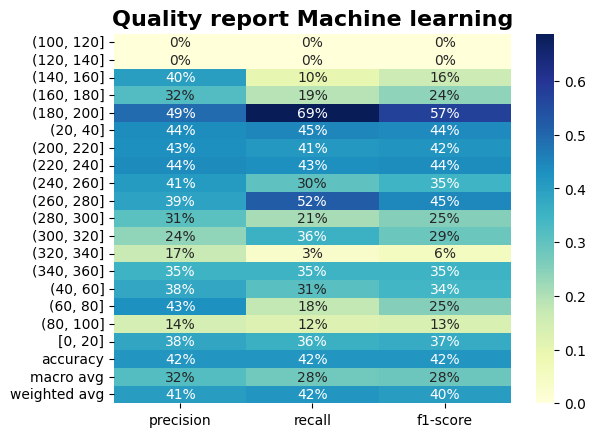

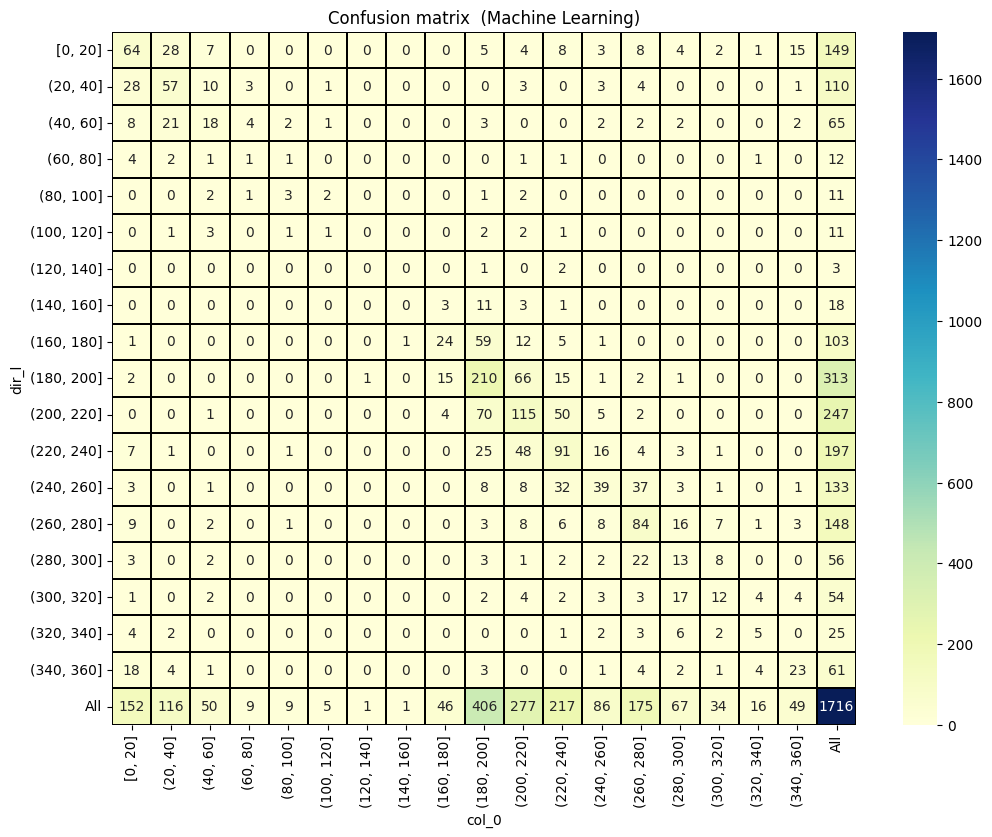

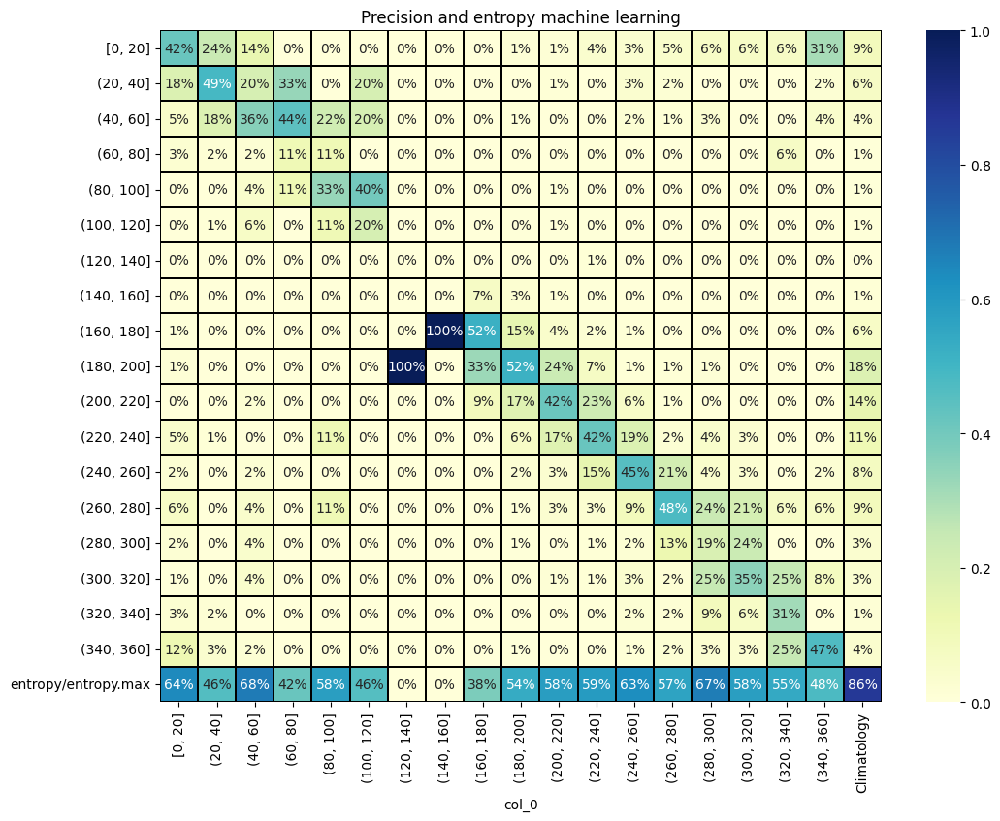

...

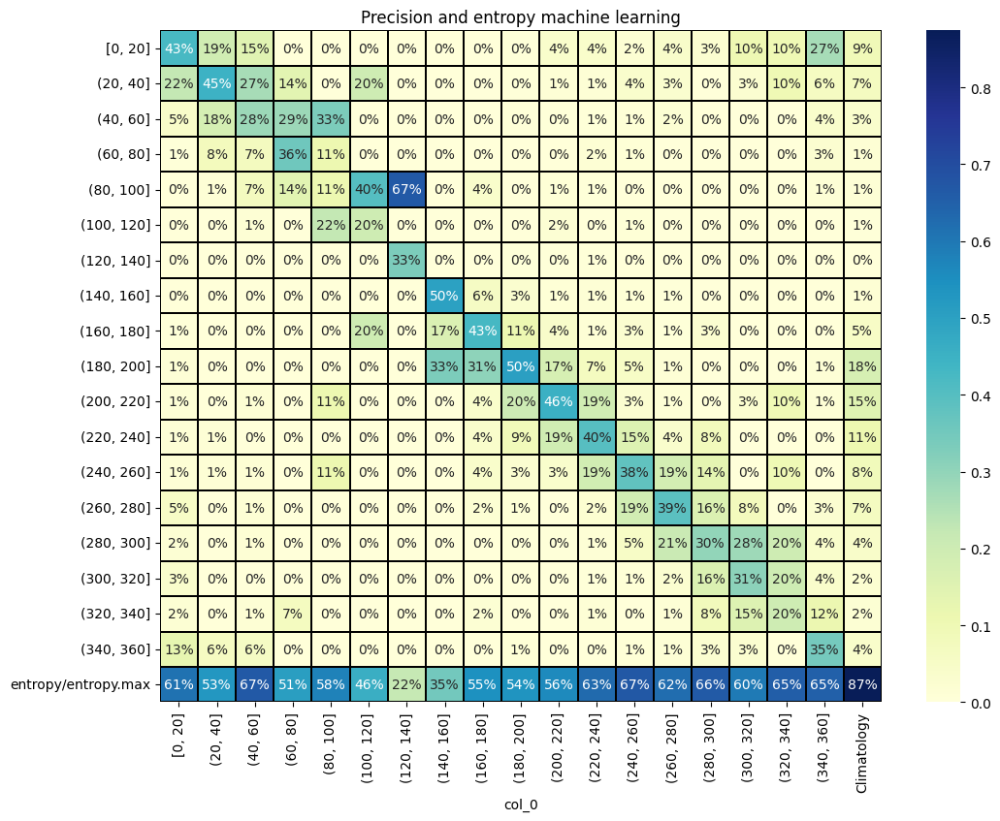

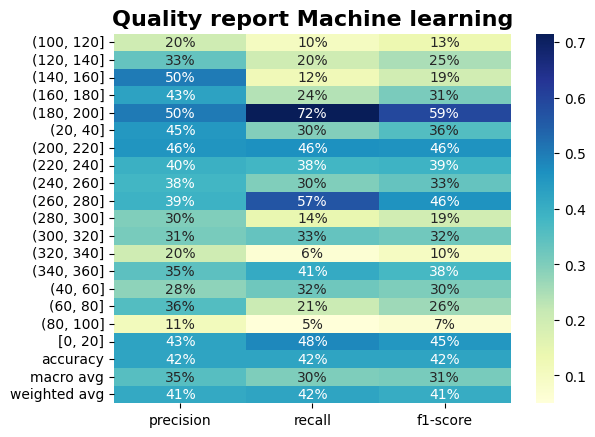

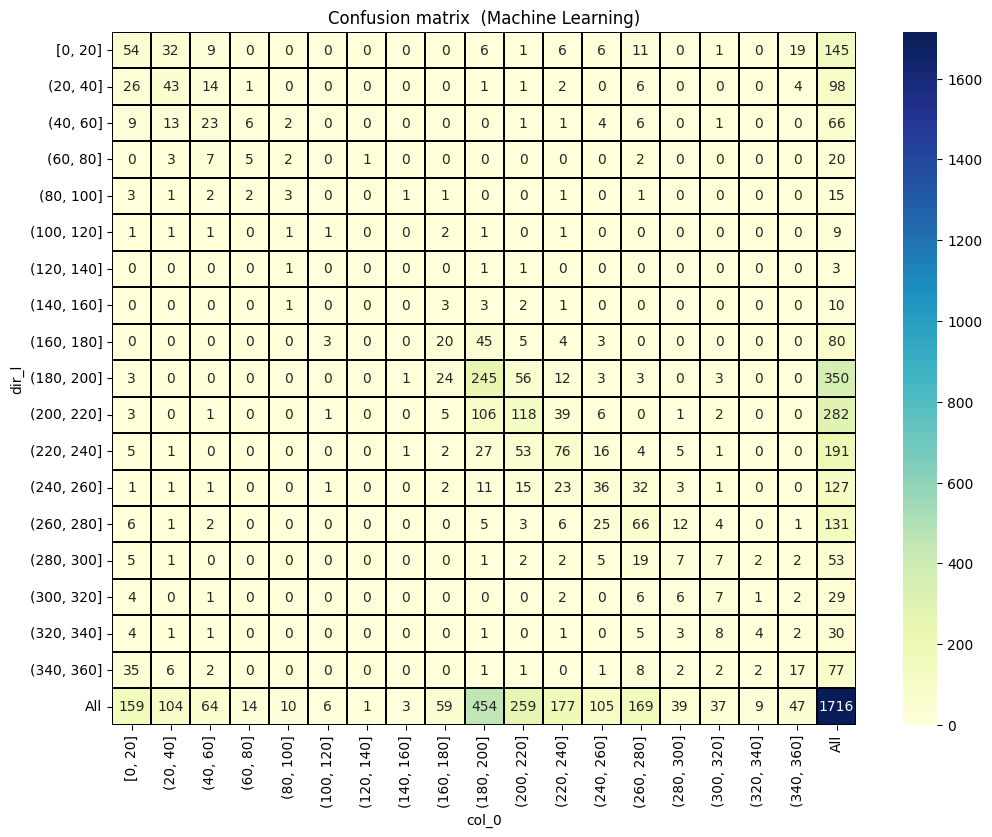

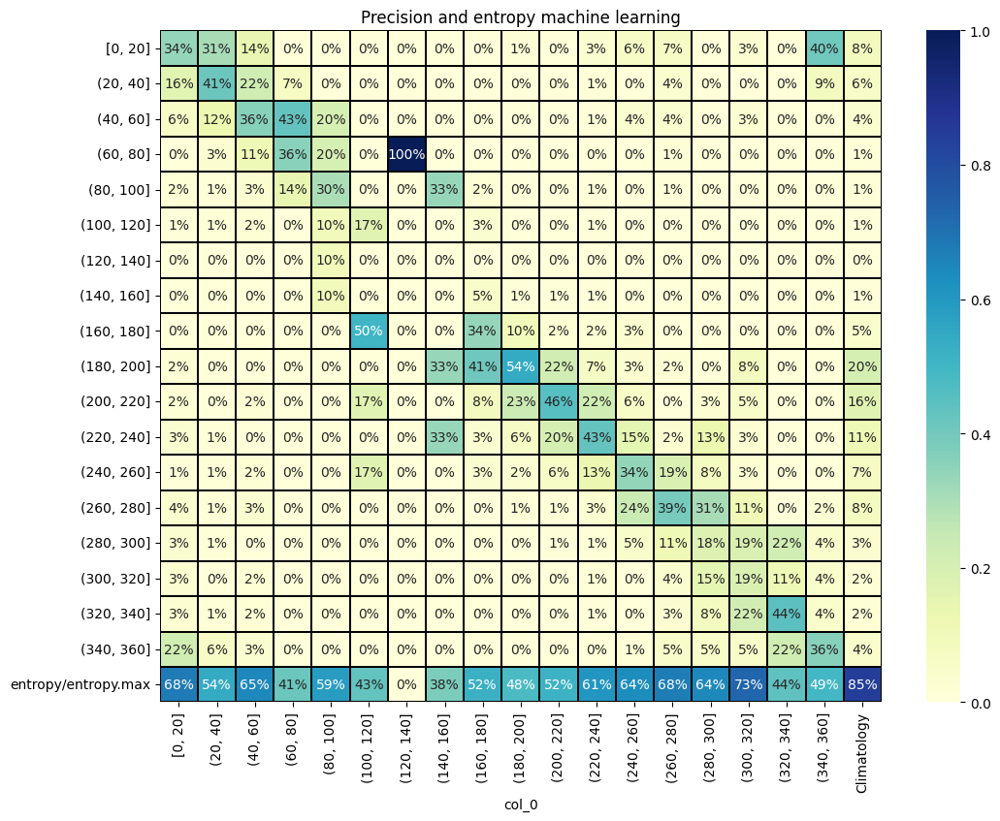

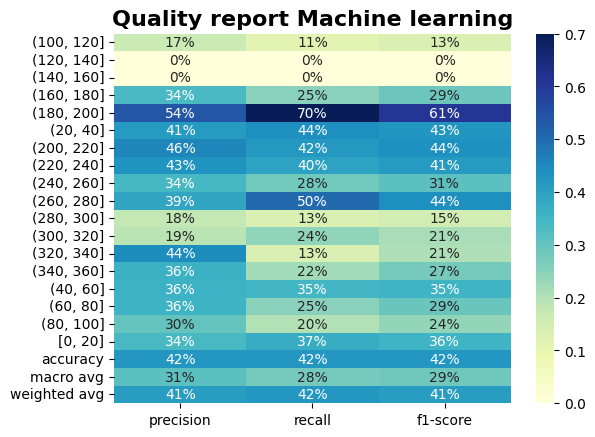


 accuracy mean of samples:  [0.42, 0.44, 0.44, 0.42, 0.42]


In [33]:
#@title  Machine learning (ExtraTreesClassifier) accuracy without variable wind. Five rounds
from lightgbm.sklearn import LGBMClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score


# X and Y
#Y = df_vrb.dir_l
#X = df_vrb.iloc[:,2:]
Y = df_all_w.dir_l
X = df_all_w[['dir0_w', 'snow_prec0_w', 'snowlevel0_w', 'mod0_w',
       'wind_gust0_w', 'mslp0_w', 'temp0_w', 'rh0_w', 'visibility0_w',
       'lhflx0_w', 'lwflx0_w', 'conv_prec0_w', 'prec0_w', 'swflx0_w',
       'shflx0_w', 'cape0_w', 'cin0_w', 'cfh0_w', 'cfl0_w', 'cfm0_w', 'cft0_w',
       'HGT5000_w', 'HGT8500_w', 'T5000_w', 'T8500_w', 'dir1_w',
       'snow_prec1_w', 'snowlevel1_w', 'mod1_w', 'wind_gust1_w', 'mslp1_w',
       'temp1_w', 'rh1_w', 'visibility1_w', 'lhflx1_w', 'lwflx1_w',
       'conv_prec1_w', 'prec1_w', 'swflx1_w', 'shflx1_w', 'cape1_w', 'cin1_w',
       'cfh1_w', 'cfl1_w', 'cfm1_w', 'cft1_w', 'HGT5001_w', 'HGT8501_w',
       'T5001_w', 'T8501_w']]

# mean accuracy machine learning sample array
acc_ml = []

#seed random function to create TWO RELATED samples of scores
np.random.seed(1)

for t in range (0,5):
  #split variables
  X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size=0.20, )

  #ml_model = RandomForestClassifier().fit(X_train,y_train)
  ml_model = ExtraTreesClassifier().fit(X_train,y_train)

  y_pred = ml_model.predict(X_test)
  acc_ml.append(round(accuracy_score(y_test, y_pred),2))

  #Confusion matrix
  plt.figure(figsize=(12, 9))
  plt.title("Confusion matrix  (Machine Learning)")
  cm = pd.crosstab(y_test, ml_model.predict(X_test),margins=True,)
  comuns = [element for element in labels+["All"] if element in cm.columns]
  seab = sns.heatmap(cm[comuns],annot=True,cmap="YlGnBu",fmt='.0f',linewidths=.2,linecolor='black');
  plt.show()

  plt.figure(figsize=(12, 9))
  plt.title("Precision and entropy machine learning")
  column_sc = pd.crosstab(y_test, ml_model.predict(X_test), margins=True,normalize="columns")
  column_sc = column_sc.append(pd.DataFrame(entropy(column_sc,base=2)/(math.log2(column_sc.shape[0])),columns=["entropy/entropy.max"],
                    index=column_sc.columns).T).rename(columns={"All":"Climatology"})
  comuns = [element for element in labels+["Climatology"] if element in column_sc.columns]                  
  seab = sns.heatmap(column_sc[comuns],annot=True,cmap="YlGnBu",fmt='.0%',linewidths=.2,linecolor='black');
  plt.show()
  #quality report
  #print("\nQuality report (Machine Learning)\n")

  df_d = pd.DataFrame(classification_report(y_test, ml_model.predict(X_test),output_dict=True)).T.iloc[:, :3]
  seab = sns.heatmap(df_d,annot=True,cmap="YlGnBu",fmt='.0%',)
  seab.set_title("Quality report Machine learning", fontsize=16, fontweight='bold')
  plt.show()
  #print(pd.DataFrame(classification_report(y_test, ml_model.predict(X_test),output_dict=True)).T)


print("\n accuracy mean of samples: ",acc_ml)

In [34]:
#@title T test (1sample) compare machine learning mean accuracy in a sample (n=5) versus meteorological model mean accuracy at point 0 (18%). Alternative hypothesis is: the mean of the underlying distribution of the sample is greater than the given population mean (popmean). Significance level (alpha) = 0.01
from scipy import stats

alpha = 0.01
sta0, p_value0 = stats.ttest_1samp(acc_ml, popmean=0.18, alternative="greater")


print("\nalpha: ",alpha)

print("\naccuracy list from machine learning test:",acc_ml)
print("\n**** Point 0 ****")
print("\np_value point 0:",p_value0)
if p_value0 < alpha:    
    print("\nwe are rejecting null hypothesis  H0: accuracy mean machine learning= accuracy mean meteorological model point 0")
    print("\nwe are accepting alternative hypothesis: accuracy mean machine learning is greater than accuracy mean meteorological point 0")
else:
    print("\nwe are accepting null hypothesis:  H0 accuracy mean point0= accuracy mean point ")



alpha:  0.01

accuracy list from machine learning test: [0.42, 0.44, 0.44, 0.42, 0.42]

**** Point 0 ****

p_value point 0: 4.5562554026499953e-07

we are rejecting null hypothesis  H0: accuracy mean machine learning= accuracy mean meteorological model point 0

we are accepting alternative hypothesis: accuracy mean machine learning is greater than accuracy mean meteorological point 0


In [35]:
#@title Feature importance
def format_as_percentage(value):
    return '{:.1%}'.format(value)
fea_imp =pd.DataFrame({"feature":X.columns,
                      "importance":[(importance/(sum(ml_model.feature_importances_))) for importance in ml_model.feature_importances_]})
fea_imp["feature_per"] =  fea_imp['importance'].map(format_as_percentage) 
fea_sort = fea_imp.sort_values(by="importance",ascending=False)
fea_sort[["feature","feature_per"]][:10]

,feature,feature_per
25,dir1_w,6.8%
0,dir0_w,6.5%
29,wind_gust1_w,2.7%
28,mod1_w,2.6%
4,wind_gust0_w,2.6%
3,mod0_w,2.5%
35,lwflx1_w,2.5%
10,lwflx0_w,2.5%
6,temp0_w,2.5%
31,temp1_w,2.5%


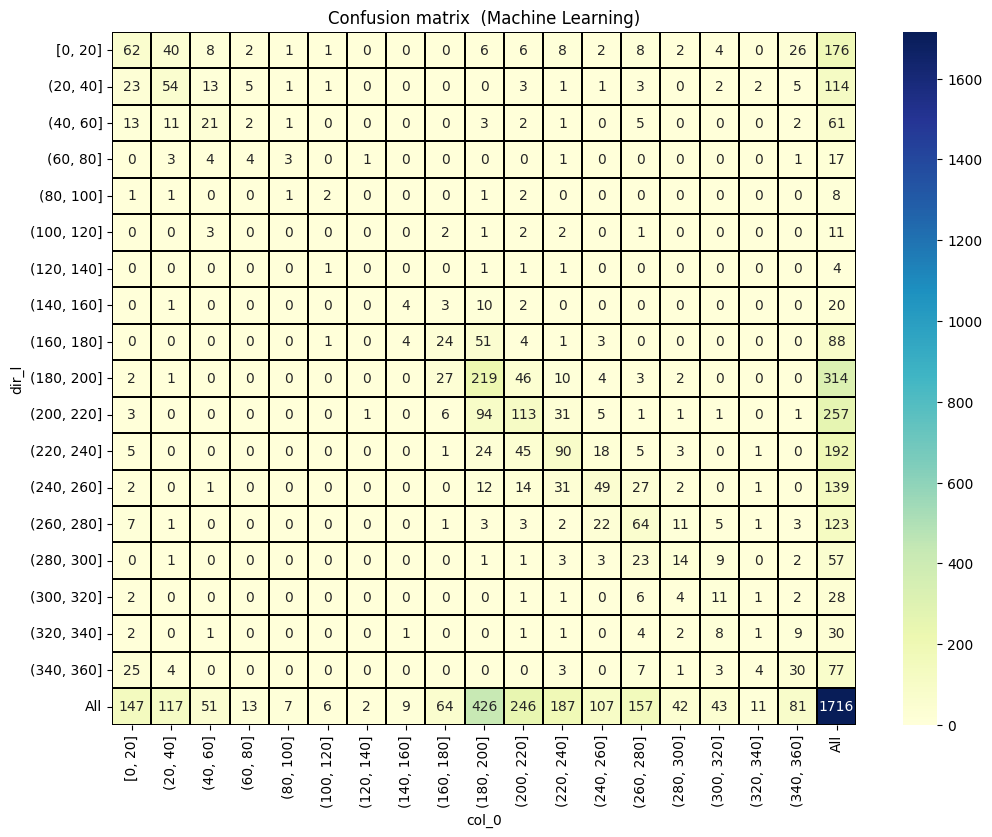

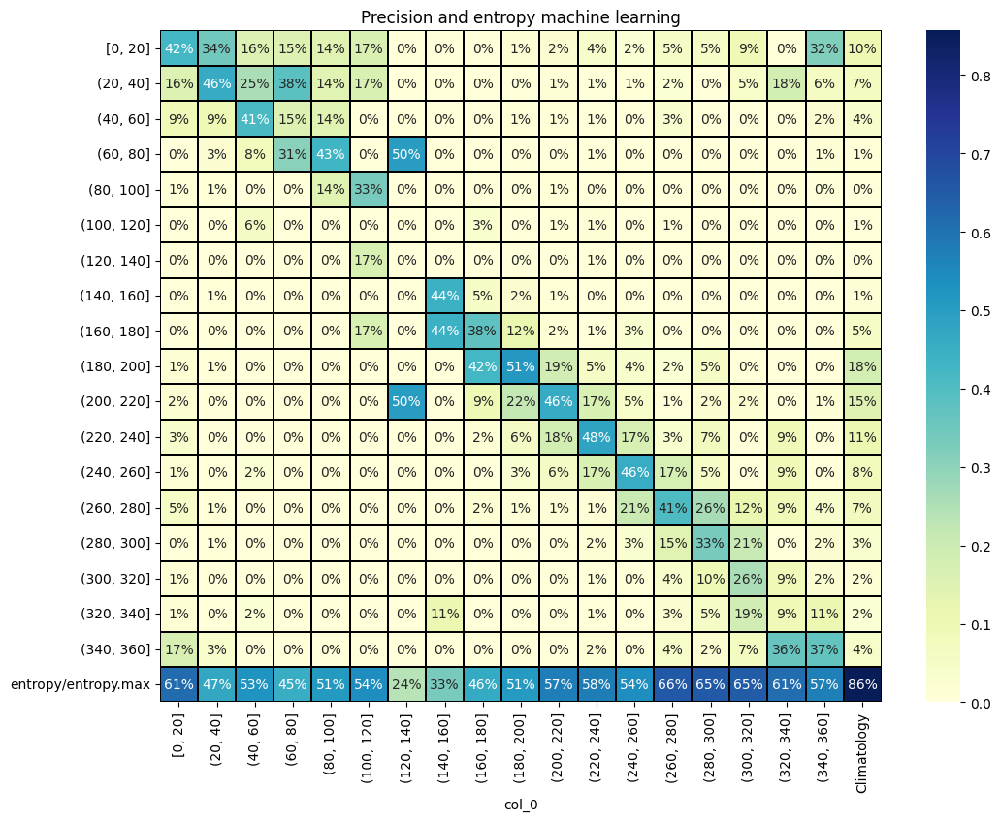

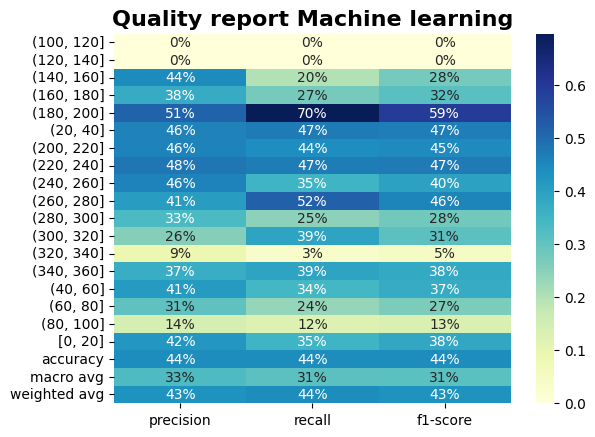

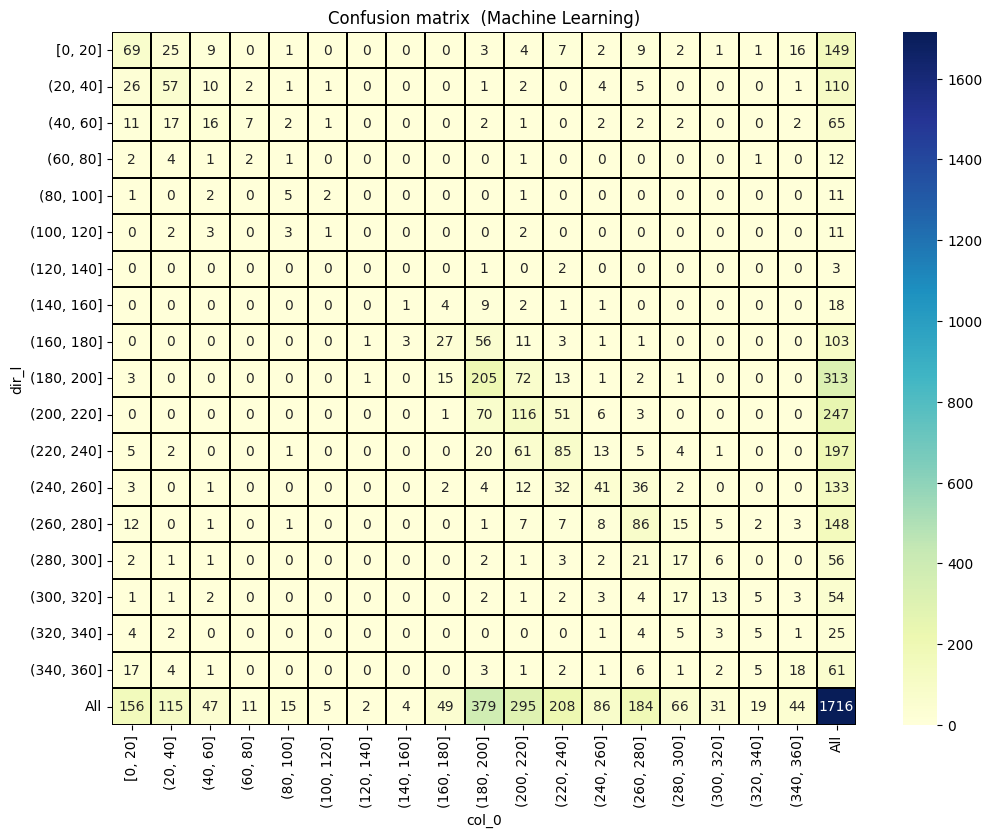

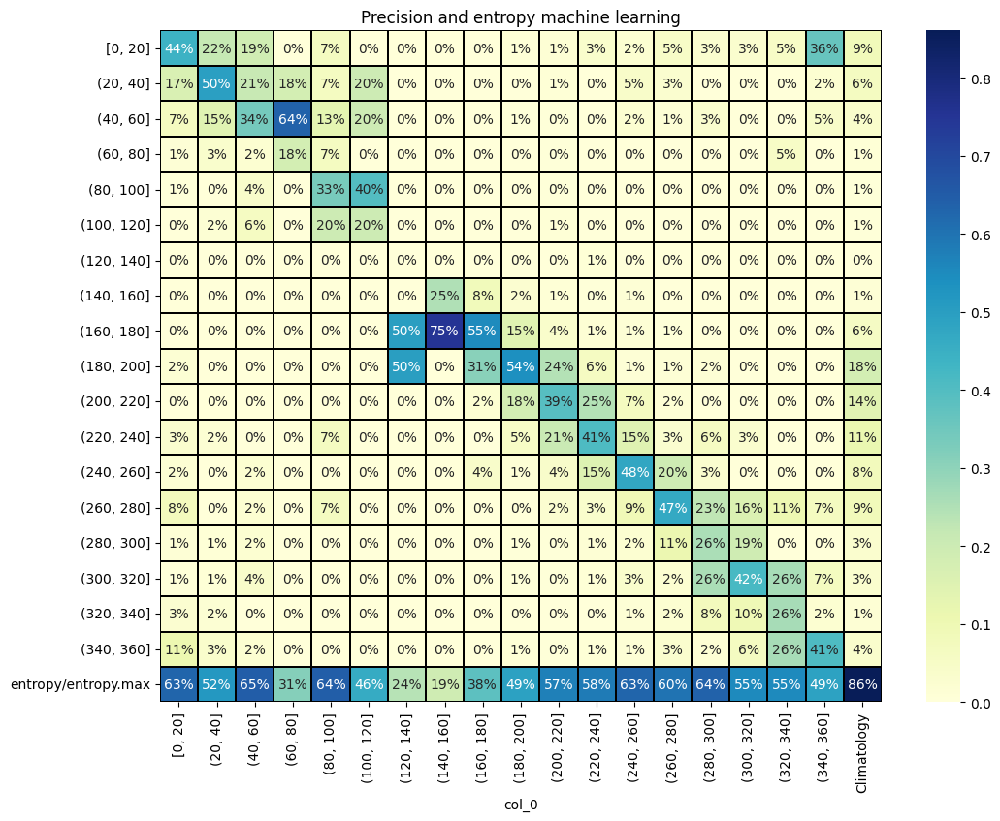

...

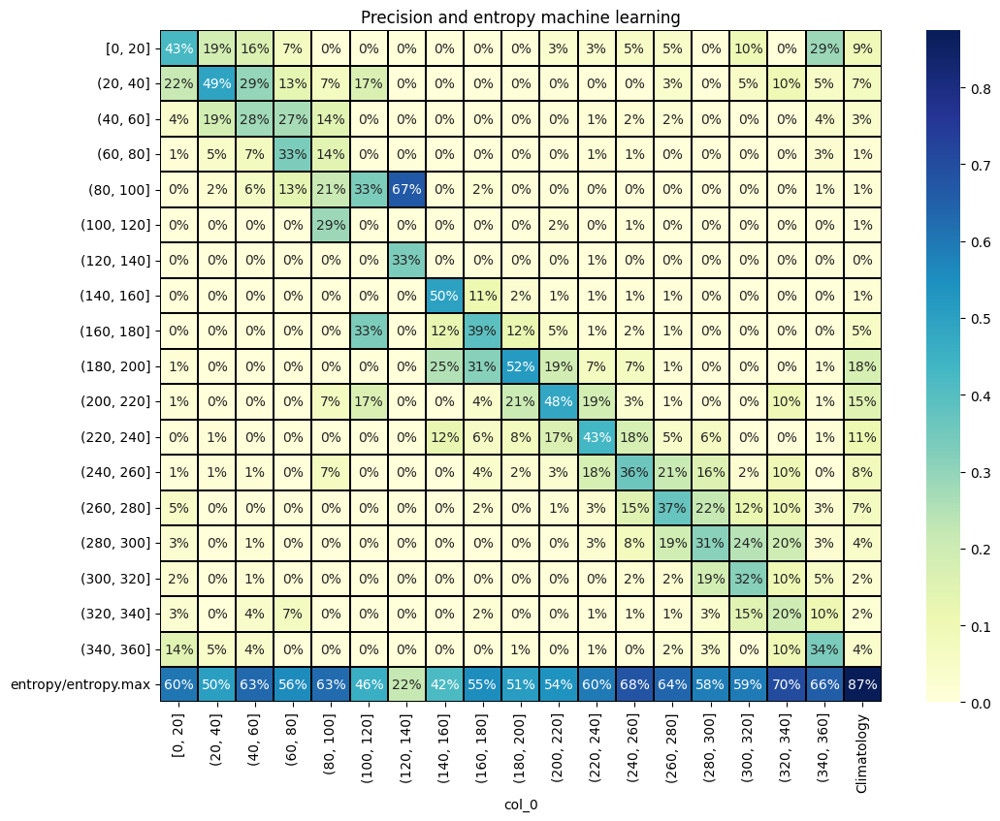

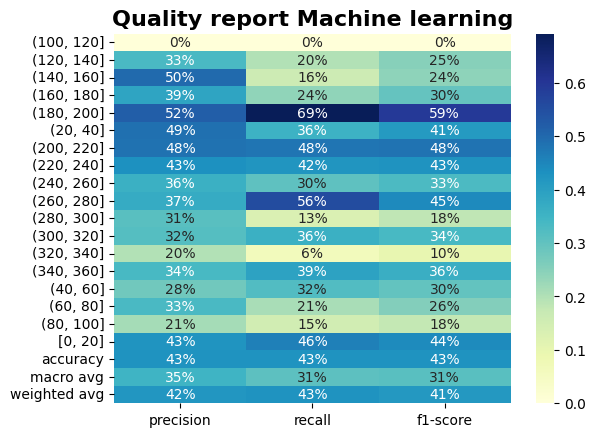

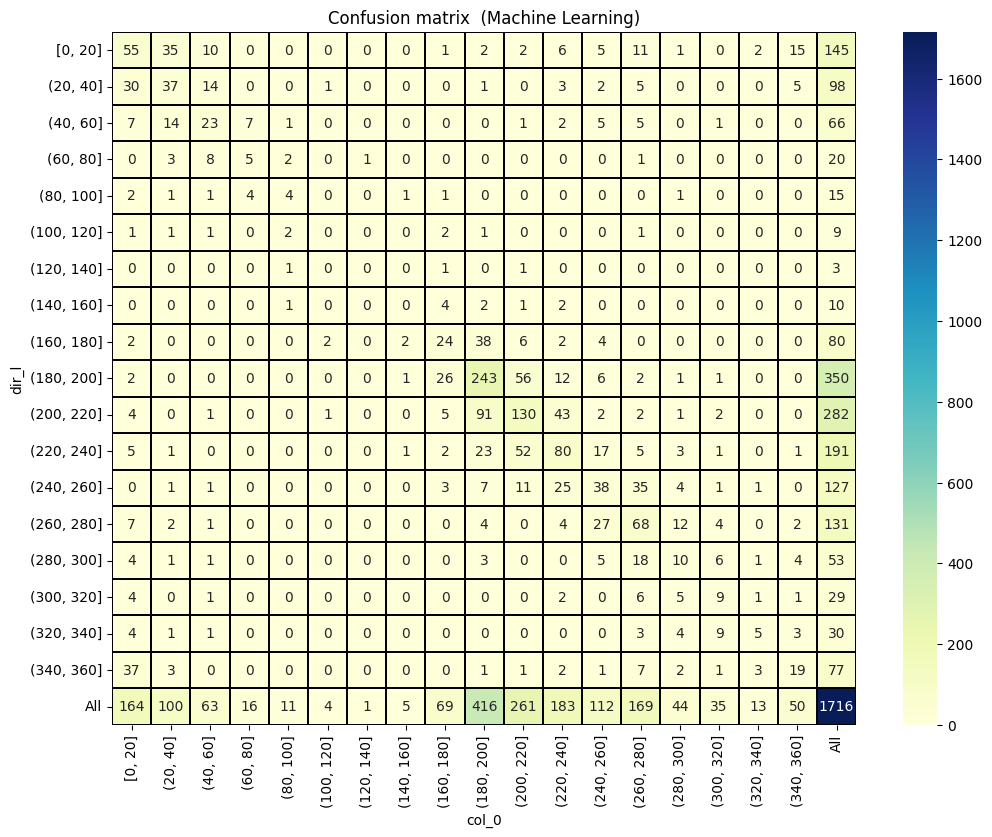

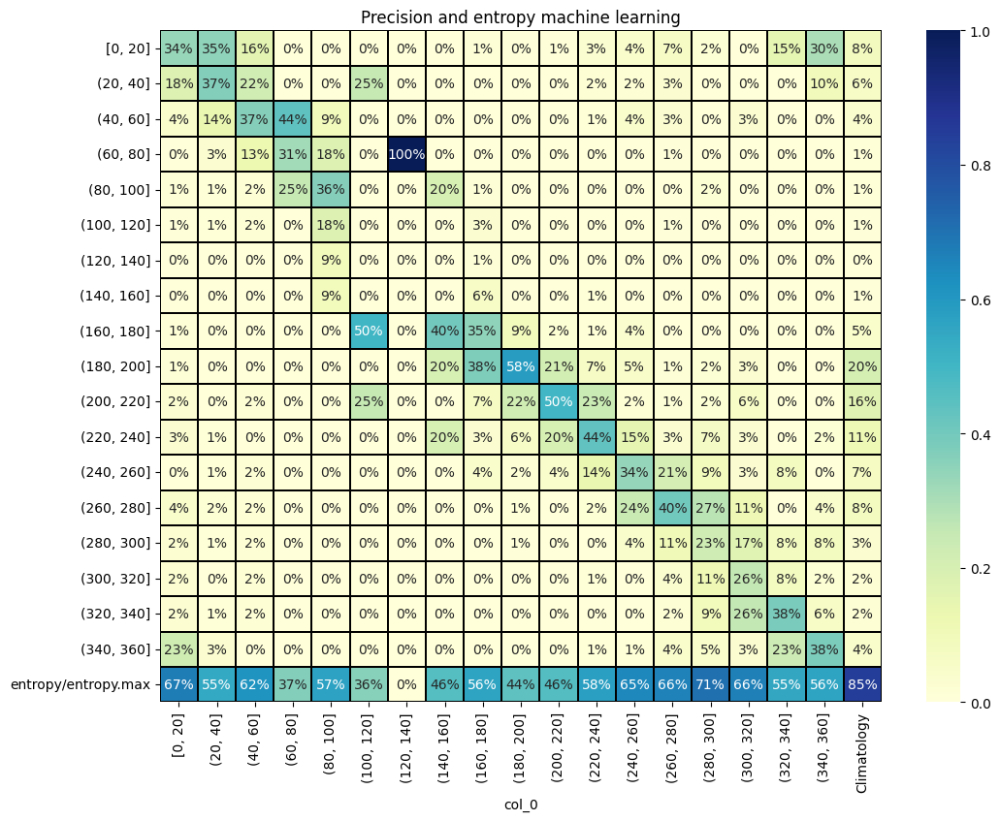

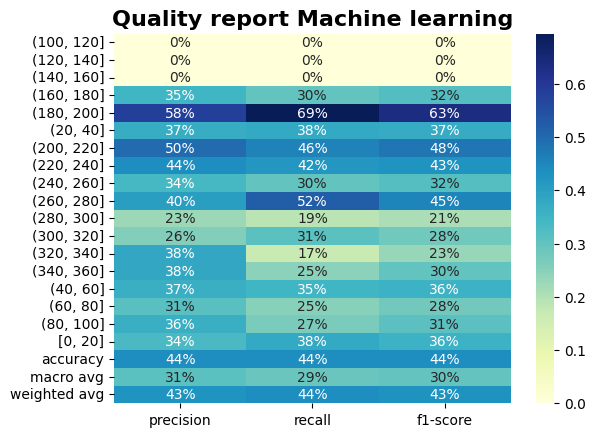


 accuracy mean of samples:  [0.44, 0.45, 0.44, 0.43, 0.44]


In [41]:
#@title Machine learning with time variables

df_all_w["hour"] = df_all_w.index.hour
df_all_w["month"] = df_all_w.index.month
df_all_w["dayofyear"] = df_all_w.index.dayofyear
df_all_w["weekofyear"] = df_all_w.index.isocalendar().week.astype(int)

Y = df_all_w.dir_l
X = df_all_w[['dir0_w', 'snow_prec0_w', 'snowlevel0_w', 'mod0_w',
       'wind_gust0_w', 'mslp0_w', 'temp0_w', 'rh0_w', 'visibility0_w',
       'lhflx0_w', 'lwflx0_w', 'conv_prec0_w', 'prec0_w', 'swflx0_w',
       'shflx0_w', 'cape0_w', 'cin0_w', 'cfh0_w', 'cfl0_w', 'cfm0_w', 'cft0_w',
       'HGT5000_w', 'HGT8500_w', 'T5000_w', 'T8500_w', 'dir1_w',
       'snow_prec1_w', 'snowlevel1_w', 'mod1_w', 'wind_gust1_w', 'mslp1_w',
       'temp1_w', 'rh1_w', 'visibility1_w', 'lhflx1_w', 'lwflx1_w',
       'conv_prec1_w', 'prec1_w', 'swflx1_w', 'shflx1_w', 'cape1_w', 'cin1_w',
       'cfh1_w', 'cfl1_w', 'cfm1_w', 'cft1_w', 'HGT5001_w', 'HGT8501_w',
       'T5001_w', 'T8501_w', 'hour', 'month', 'dayofyear',
       'weekofyear']]

# mean accuracy machine learning sample array
acc_ml_a = []

#seed random function to create TWO RELATED samples of scores
np.random.seed(1)

for t in range (0,5):
  #split variables
  X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size=0.20, )

  #ml_model = RandomForestClassifier().fit(X_train,y_train)
  ml_model = ExtraTreesClassifier().fit(X_train,y_train)

  y_pred = ml_model.predict(X_test)
  acc_ml_a.append(round(accuracy_score(y_test, y_pred),2))

  #Confusion matrix
  plt.figure(figsize=(12, 9))
  plt.title("Confusion matrix  (Machine Learning)")
  cm = pd.crosstab(y_test, ml_model.predict(X_test),margins=True,)
  comuns = [element for element in labels+["All"] if element in cm.columns]
  seab = sns.heatmap(cm[comuns],annot=True,cmap="YlGnBu",fmt='.0f',linewidths=.2,linecolor='black');
  plt.show()

  plt.figure(figsize=(12, 9))
  plt.title("Precision and entropy machine learning")
  column_sc = pd.crosstab(y_test, ml_model.predict(X_test), margins=True,normalize="columns")
  column_sc = column_sc.append(pd.DataFrame(entropy(column_sc,base=2)/(math.log2(column_sc.shape[0])),columns=["entropy/entropy.max"],
                    index=column_sc.columns).T).rename(columns={"All":"Climatology"})
  comuns = [element for element in labels+["Climatology"] if element in column_sc.columns]                  
  seab = sns.heatmap(column_sc[comuns],annot=True,cmap="YlGnBu",fmt='.0%',linewidths=.2,linecolor='black');
  plt.show()
  #quality report
  #print("\nQuality report (Machine Learning)\n")

  df_d = pd.DataFrame(classification_report(y_test, ml_model.predict(X_test),output_dict=True)).T.iloc[:, :3]
  seab = sns.heatmap(df_d,annot=True,cmap="YlGnBu",fmt='.0%',)
  seab.set_title("Quality report Machine learning", fontsize=16, fontweight='bold')
  plt.show()
  #print(pd.DataFrame(classification_report(y_test, ml_model.predict(X_test),output_dict=True)).T)


print("\n accuracy mean of samples: ",acc_ml_a)


In [42]:
#@title Feature importance
def format_as_percentage(value):
    return '{:.1%}'.format(value)
fea_imp =pd.DataFrame({"feature":X.columns,
                      "importance":[(importance/(sum(ml_model.feature_importances_))) for importance in ml_model.feature_importances_]})
fea_imp["feature_per"] =  fea_imp['importance'].map(format_as_percentage) 
fea_sort = fea_imp.sort_values(by="importance",ascending=False)
fea_sort[["feature","feature_per"]][:10]

,feature,feature_per
25,dir1_w,6.1%
0,dir0_w,5.7%
50,hour,2.7%
29,wind_gust1_w,2.4%
4,wind_gust0_w,2.4%
28,mod1_w,2.4%
10,lwflx0_w,2.3%
3,mod0_w,2.3%
6,temp0_w,2.3%
7,rh0_w,2.3%


In [44]:
#@title T test two related samples. This is a test for the null hypothesis that two related samples have identical accuracy means. Alternative hypothesis the mean of the distribution underlying the sample without time variables is less than the mean of the distribution underlying the sample with time variables. Significance level (alpha) = 0.01
from scipy import stats

alpha = 0.01
sta, p_value = stats.ttest_rel(acc_ml, acc_ml_a, alternative="less")

print("\naccuracy without time variables:", acc_ml)
print("\naccuracy with time variables:", acc_ml_a)

print("\nalpha: ",alpha)

print("\np_value point: ",p_value)
if p_value < alpha:    
    print("\nwe are rejecting null hypothesis  H0: accuracy mean machine learning without time variables = accuracy mean machine learning with time variables")
    print("\nwe are accepting alternative hypothesis: the mean of the sample without time variables inputs is less than the mean of the sample with time variables inputs")
else:
    print("\nwe are accepting null hypothesis:  H0: accuracy mean machine learning without time variables = accuracy mean machine learning with time variables ")


accuracy without time variables: [0.42, 0.44, 0.44, 0.42, 0.42]

accuracy with time variables: [0.44, 0.45, 0.44, 0.43, 0.44]

alpha:  0.01

p_value point:  0.016338961668401486

we are accepting null hypothesis:  H0: accuracy mean machine learning without time variables = accuracy mean machine learning with time variables 


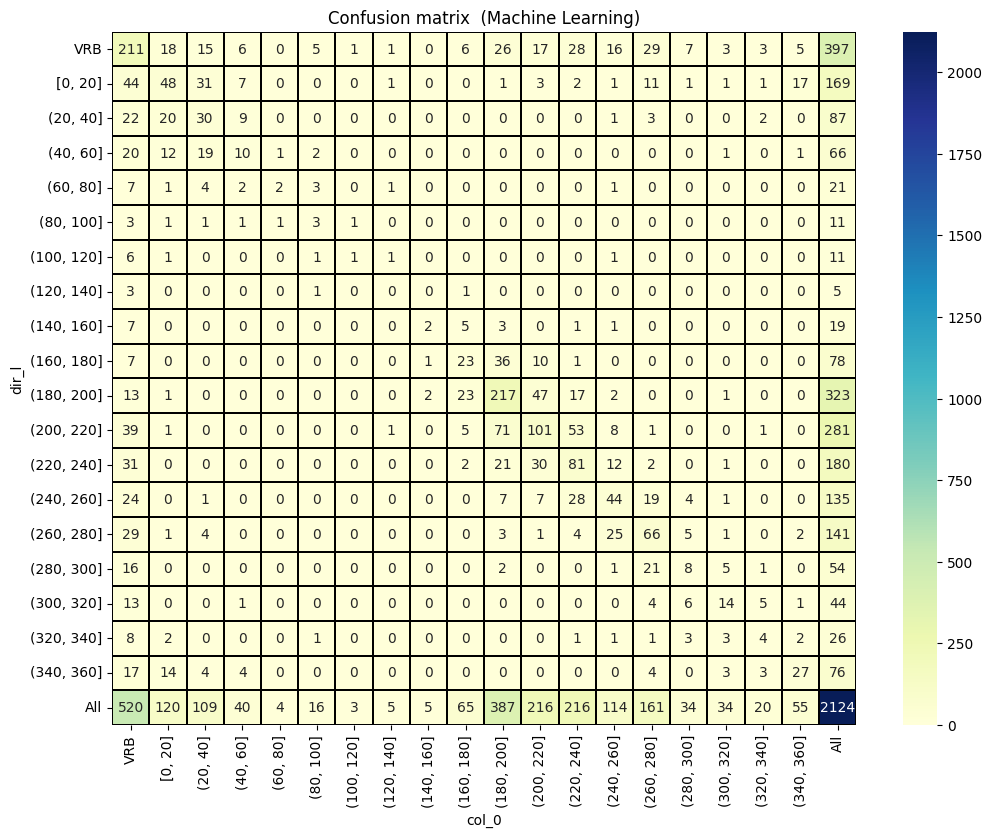

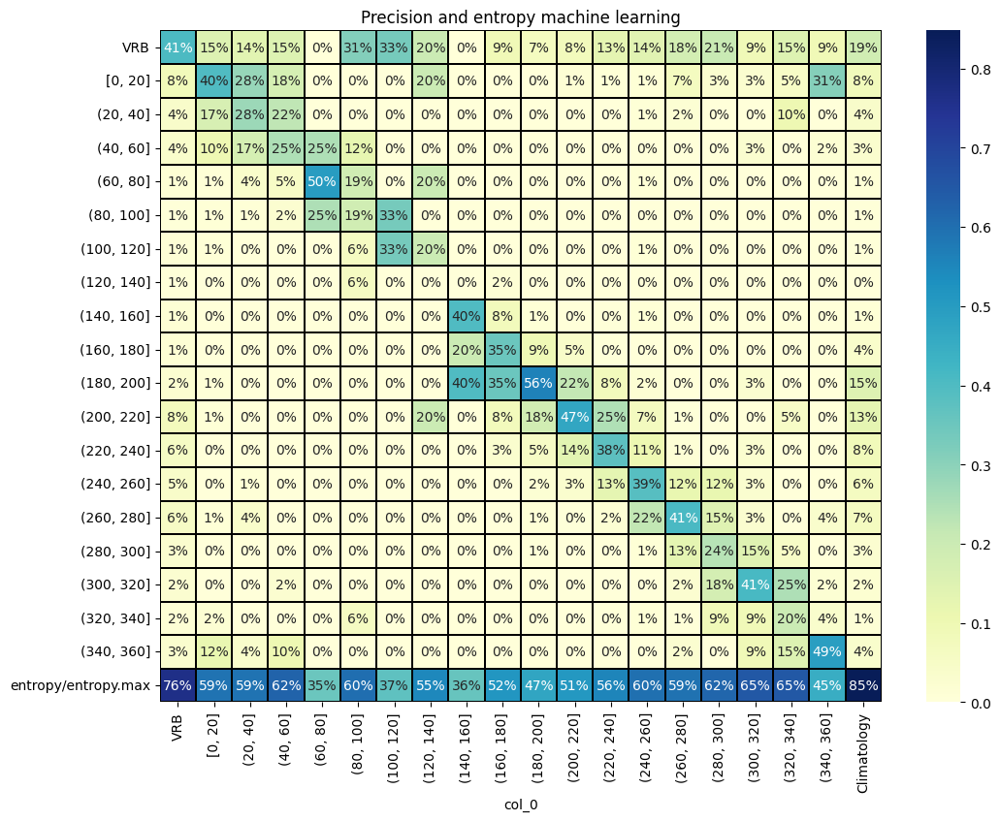

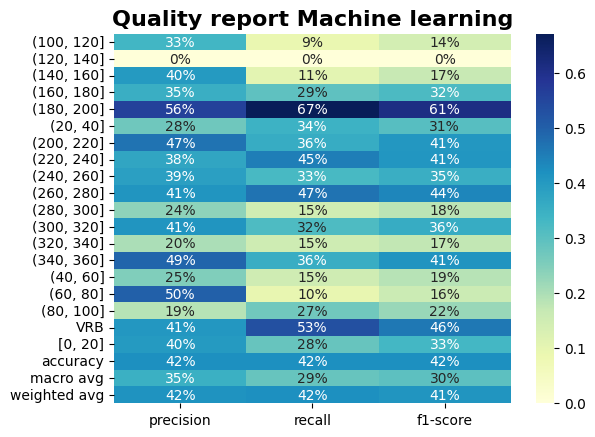

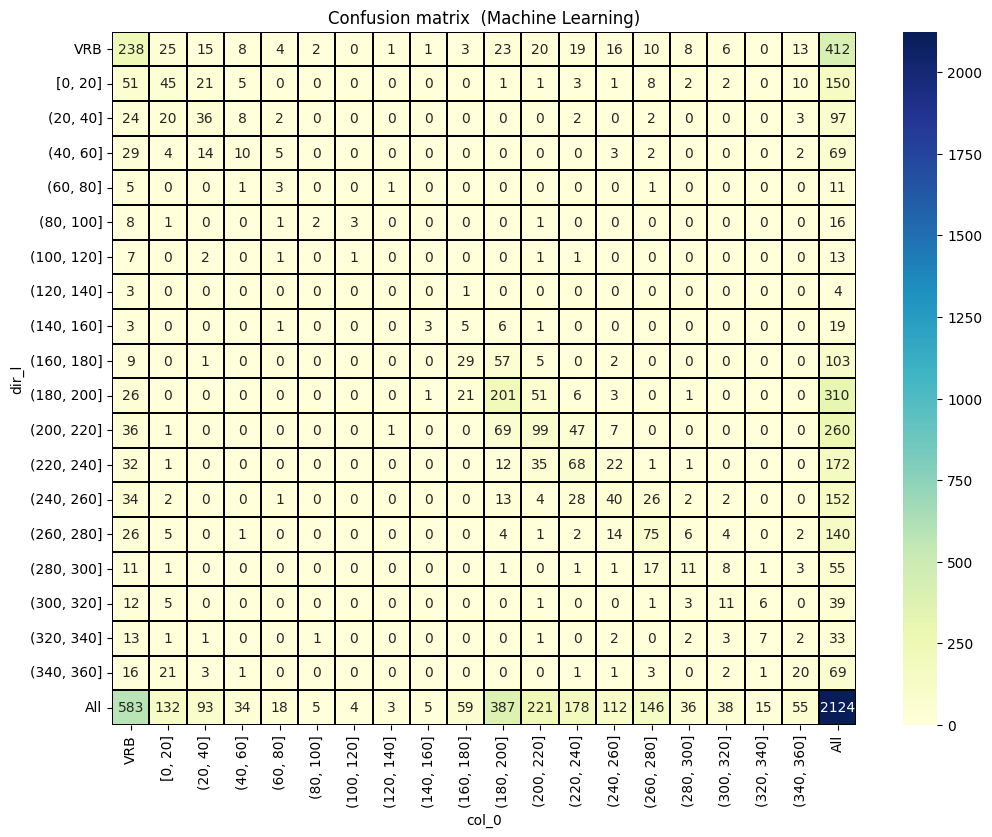

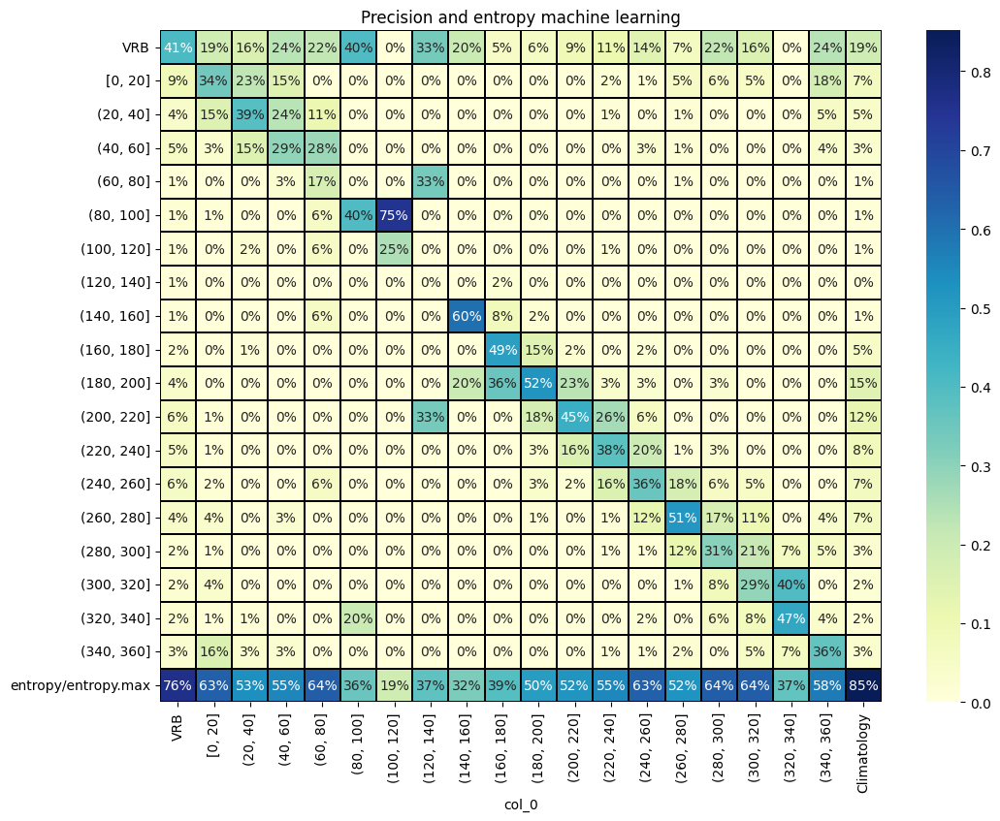

...

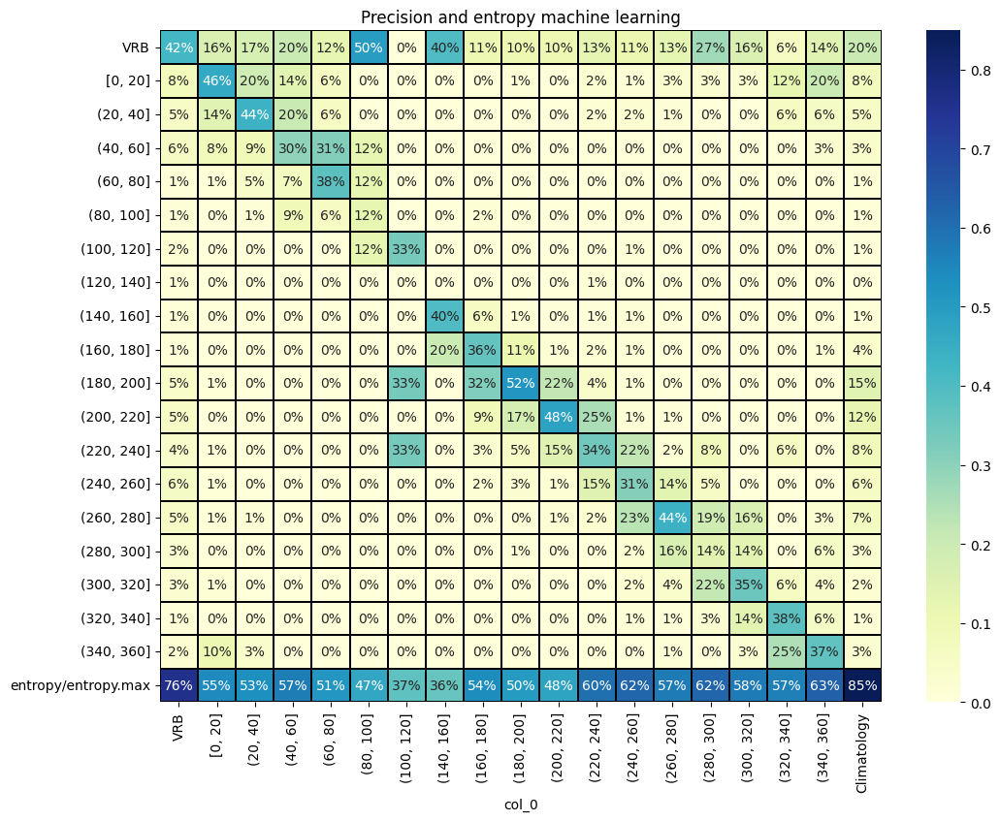

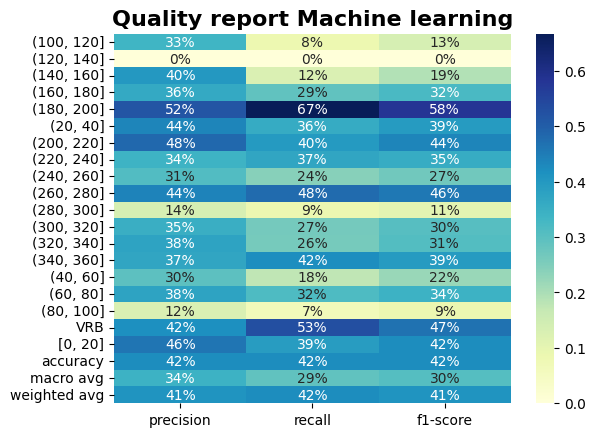

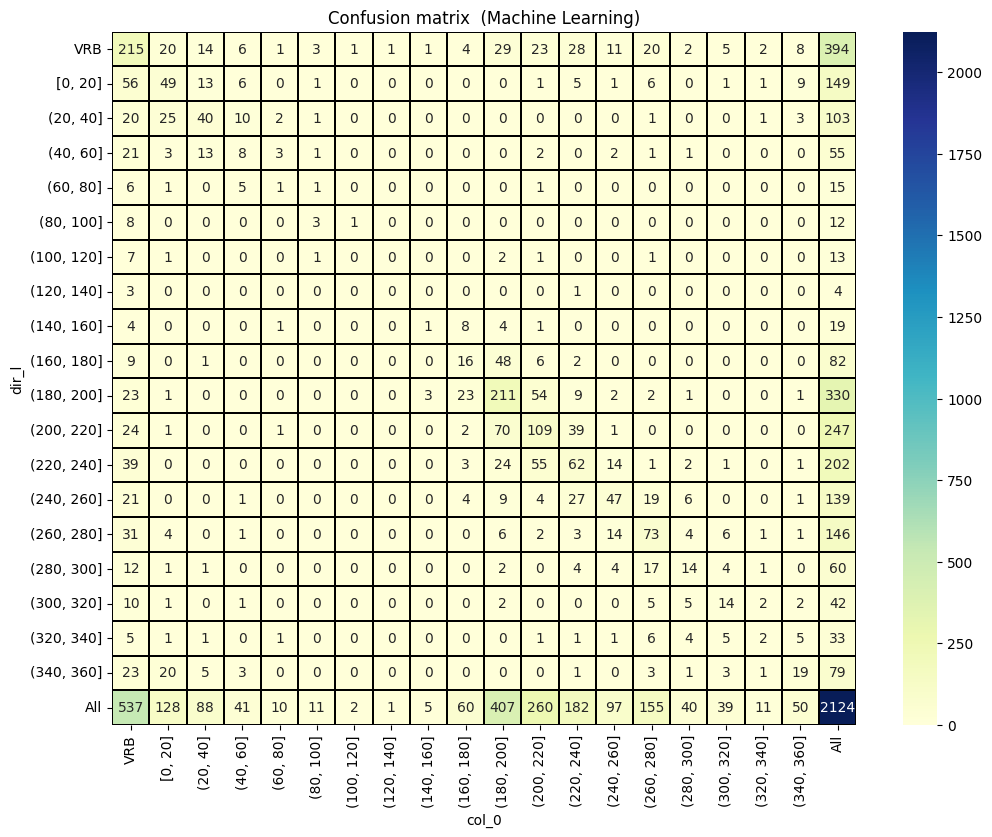

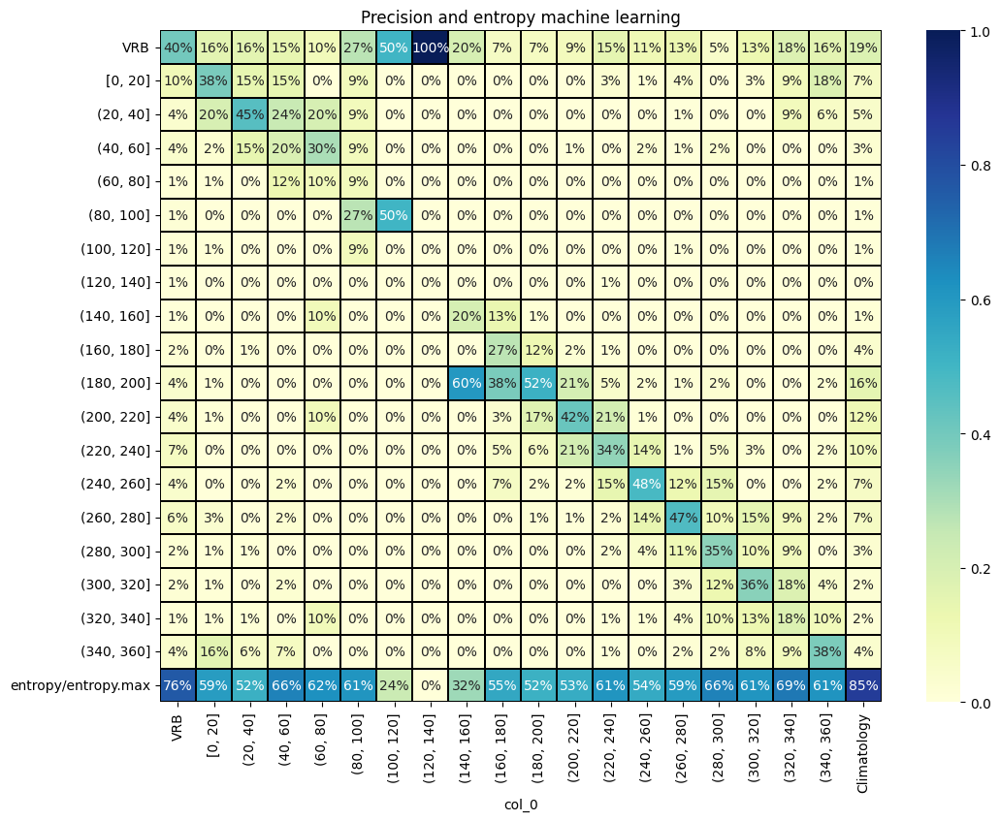

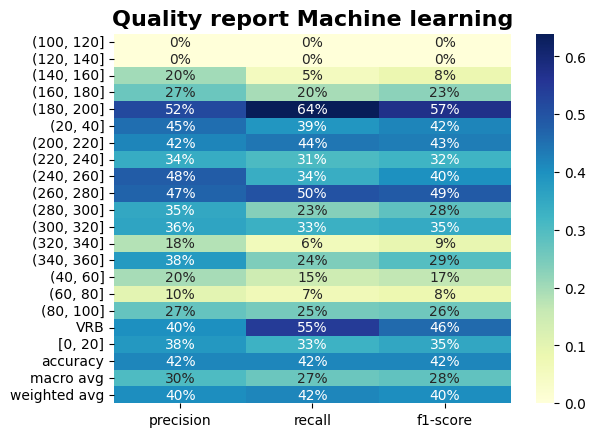


 accuracy mean of samples:  [0.42, 0.42, 0.41, 0.42, 0.42]


In [45]:
#@title Machine learning with output VRB and time variables

df_vrb_w["hour"] = df_vrb_w.index.hour
df_vrb_w["month"] = df_vrb_w.index.month
df_vrb_w["dayofyear"] = df_vrb_w.index.dayofyear
df_vrb_w["weekofyear"] = df_vrb_w.index.isocalendar().week.astype(int)

Y = df_vrb_w.dir_l
X = df_vrb_w[['dir0_w', 'snow_prec0_w', 'snowlevel0_w', 'mod0_w',
       'wind_gust0_w', 'mslp0_w', 'temp0_w', 'rh0_w', 'visibility0_w',
       'lhflx0_w', 'lwflx0_w', 'conv_prec0_w', 'prec0_w', 'swflx0_w',
       'shflx0_w', 'cape0_w', 'cin0_w', 'cfh0_w', 'cfl0_w', 'cfm0_w', 'cft0_w',
       'HGT5000_w', 'HGT8500_w', 'T5000_w', 'T8500_w', 'dir1_w',
       'snow_prec1_w', 'snowlevel1_w', 'mod1_w', 'wind_gust1_w', 'mslp1_w',
       'temp1_w', 'rh1_w', 'visibility1_w', 'lhflx1_w', 'lwflx1_w',
       'conv_prec1_w', 'prec1_w', 'swflx1_w', 'shflx1_w', 'cape1_w', 'cin1_w',
       'cfh1_w', 'cfl1_w', 'cfm1_w', 'cft1_w', 'HGT5001_w', 'HGT8501_w',
       'T5001_w', 'T8501_w', 'hour', 'month', 'dayofyear',
       'weekofyear']]

# mean accuracy machine learning sample array
acc_ml_a = []

#seed random function to create TWO RELATED samples of scores
np.random.seed(1)

for t in range (0,5):
  #split variables
  X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size=0.20, )

  #ml_model = RandomForestClassifier().fit(X_train,y_train)
  ml_model = ExtraTreesClassifier().fit(X_train,y_train)

  y_pred = ml_model.predict(X_test)
  acc_ml_a.append(round(accuracy_score(y_test, y_pred),2))

  #Confusion matrix
  plt.figure(figsize=(12, 9))
  plt.title("Confusion matrix  (Machine Learning)")
  cm = pd.crosstab(y_test, ml_model.predict(X_test),margins=True,)
  comuns = [element for element in labels+["All"] if element in cm.columns]
  seab = sns.heatmap(cm[comuns],annot=True,cmap="YlGnBu",fmt='.0f',linewidths=.2,linecolor='black');
  plt.show()

  plt.figure(figsize=(12, 9))
  plt.title("Precision and entropy machine learning")
  column_sc = pd.crosstab(y_test, ml_model.predict(X_test), margins=True,normalize="columns")
  column_sc = column_sc.append(pd.DataFrame(entropy(column_sc,base=2)/(math.log2(column_sc.shape[0])),columns=["entropy/entropy.max"],
                    index=column_sc.columns).T).rename(columns={"All":"Climatology"})
  comuns = [element for element in labels+["Climatology"] if element in column_sc.columns]                  
  seab = sns.heatmap(column_sc[comuns],annot=True,cmap="YlGnBu",fmt='.0%',linewidths=.2,linecolor='black');
  plt.show()
  #quality report
  #print("\nQuality report (Machine Learning)\n")

  df_d = pd.DataFrame(classification_report(y_test, ml_model.predict(X_test),output_dict=True)).T.iloc[:, :3]
  seab = sns.heatmap(df_d,annot=True,cmap="YlGnBu",fmt='.0%',)
  seab.set_title("Quality report Machine learning", fontsize=16, fontweight='bold')
  plt.show()
  #print(pd.DataFrame(classification_report(y_test, ml_model.predict(X_test),output_dict=True)).T)


print("\n accuracy mean of samples: ",acc_ml_a)


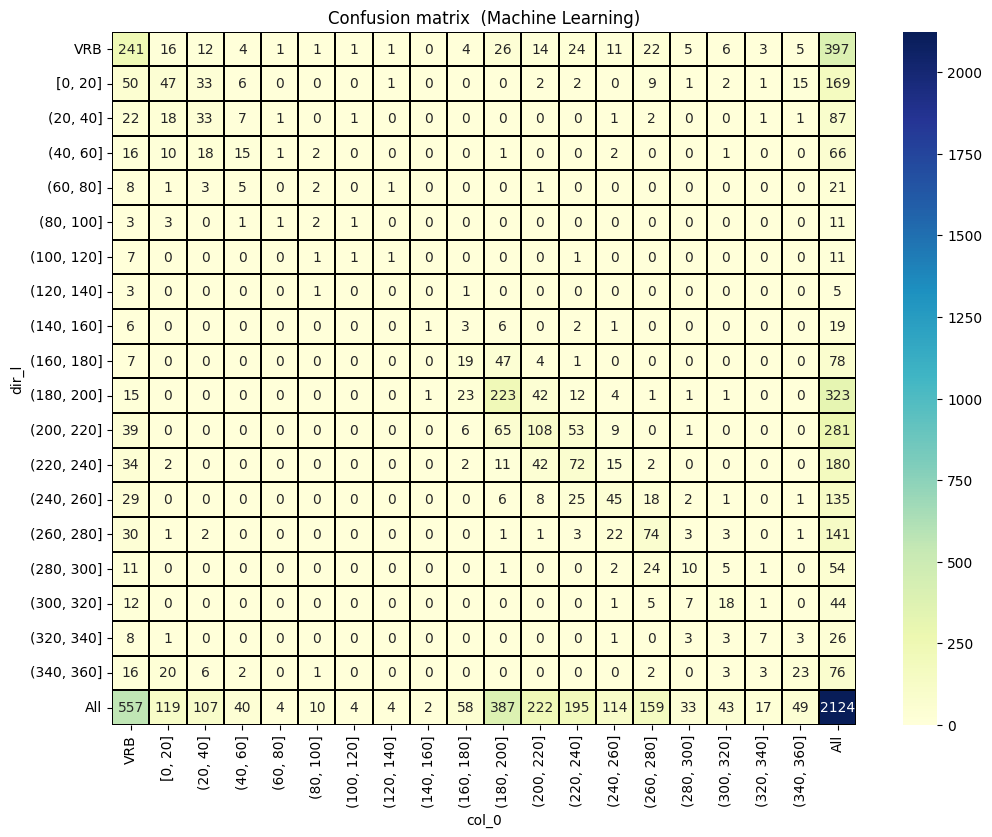

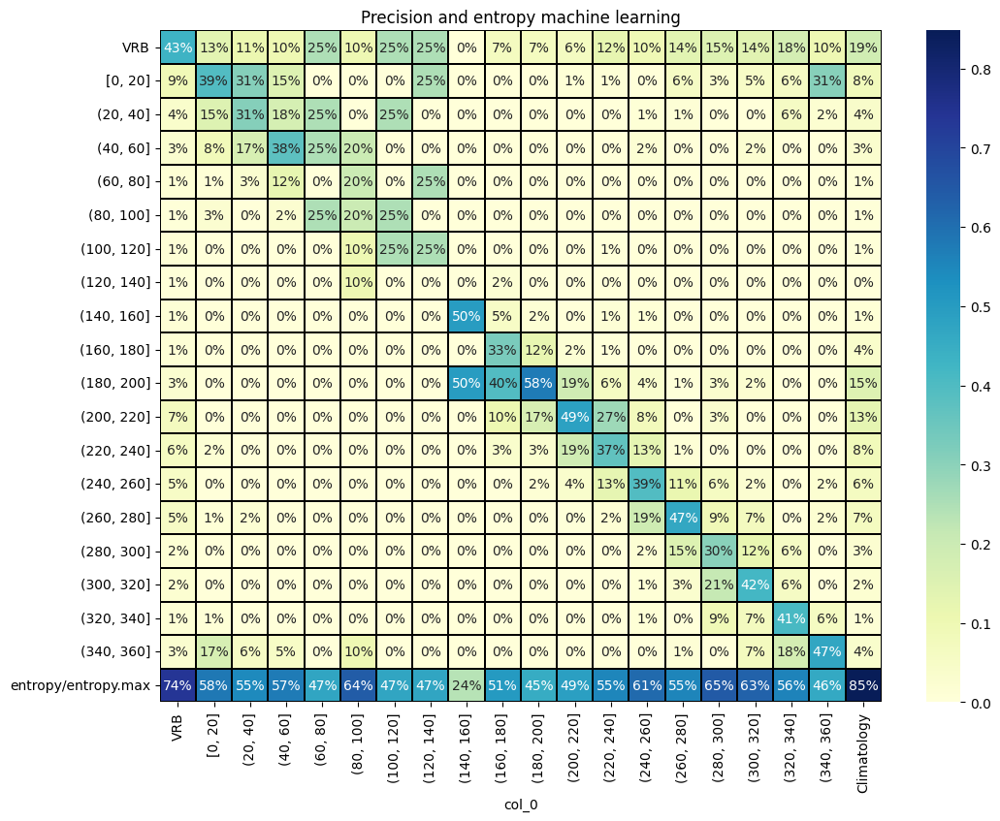

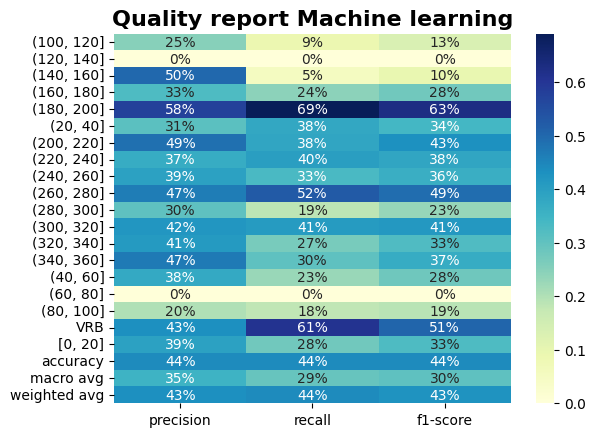

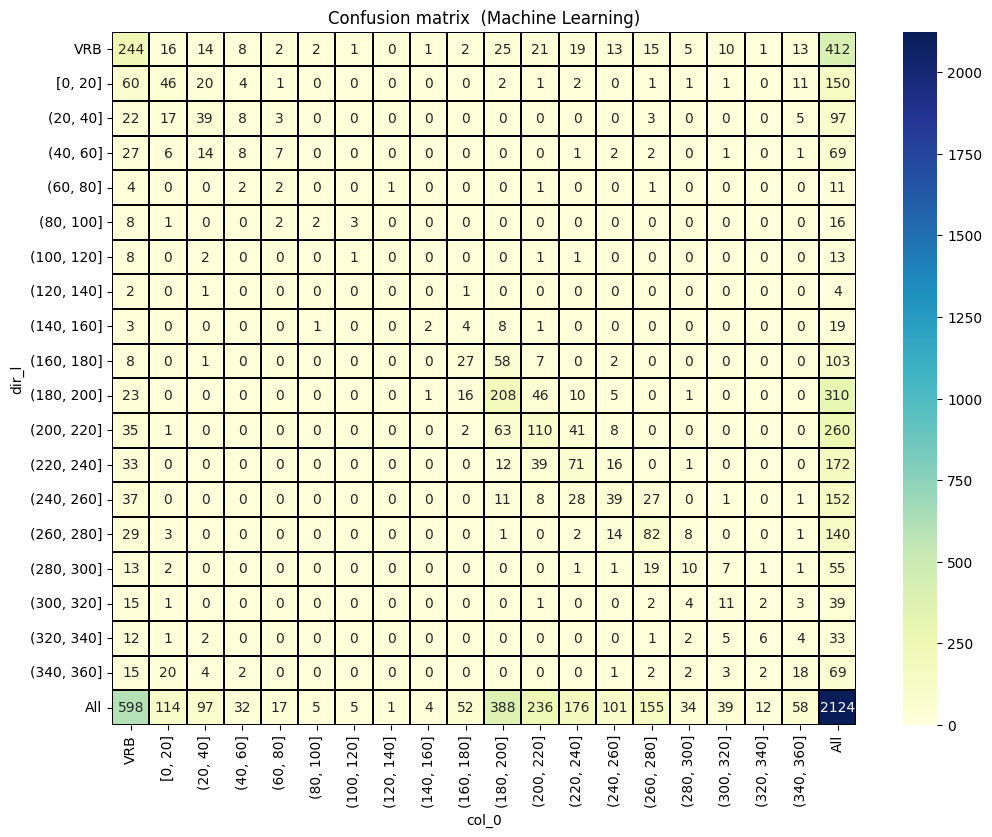

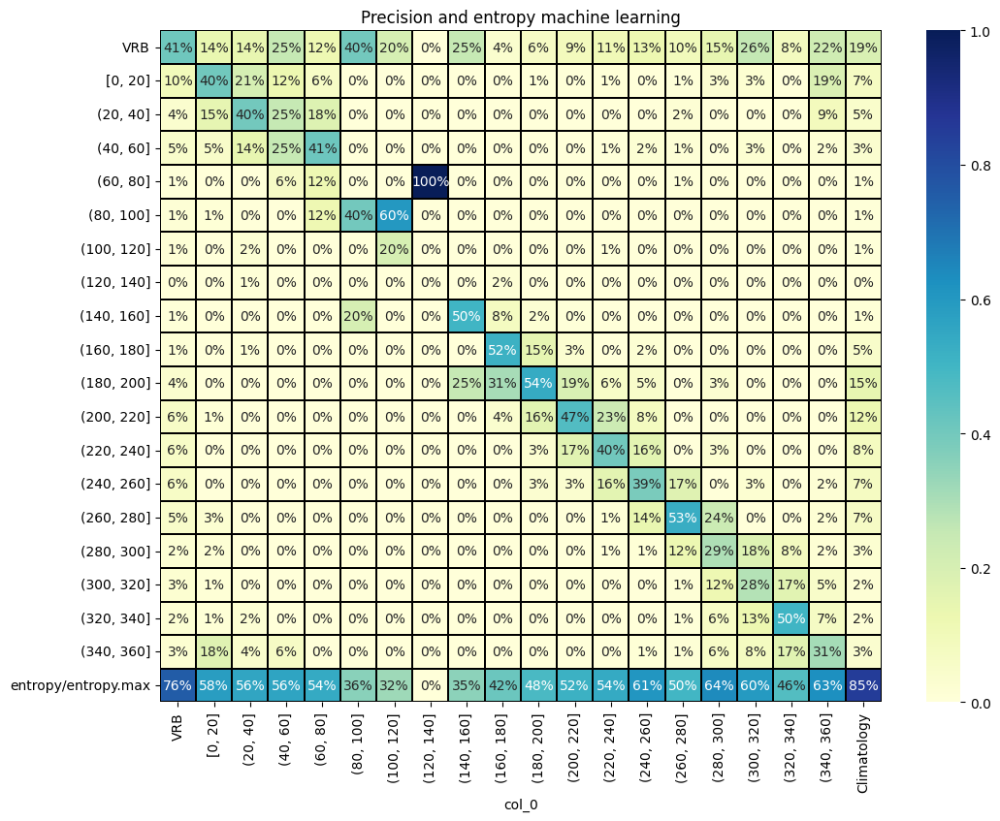

...

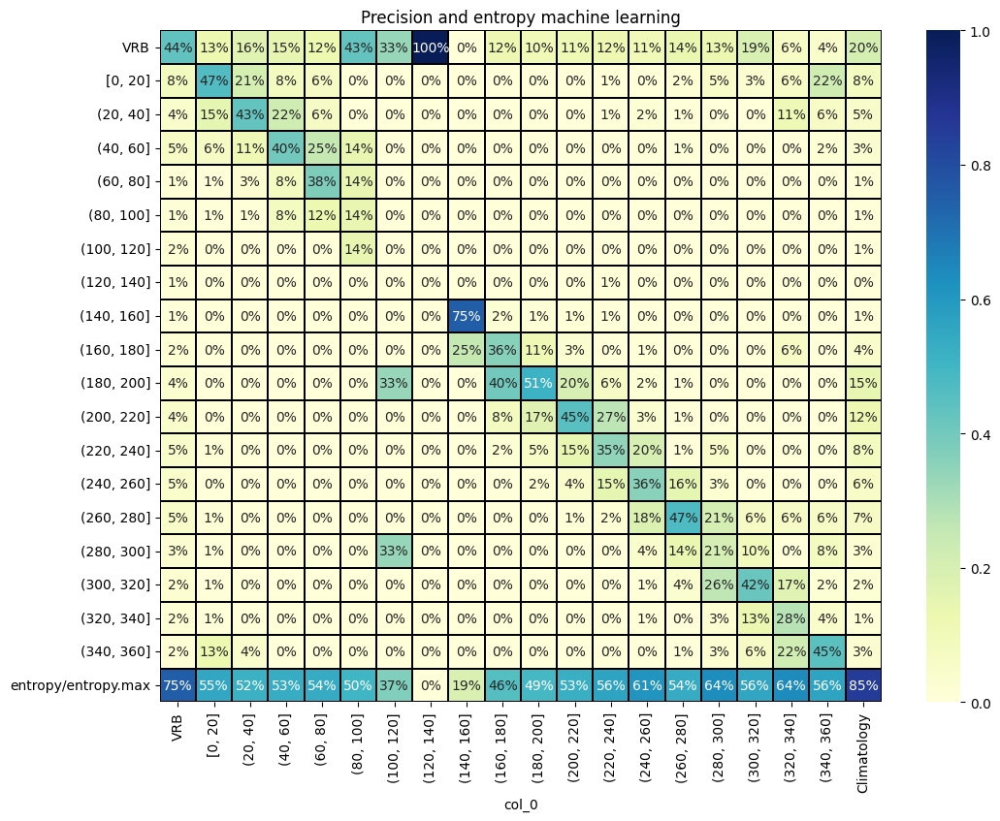

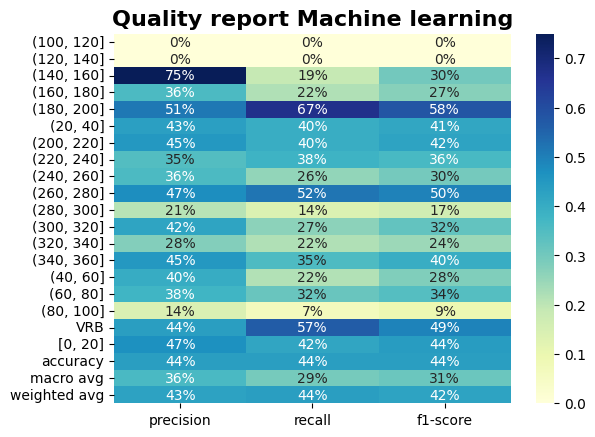

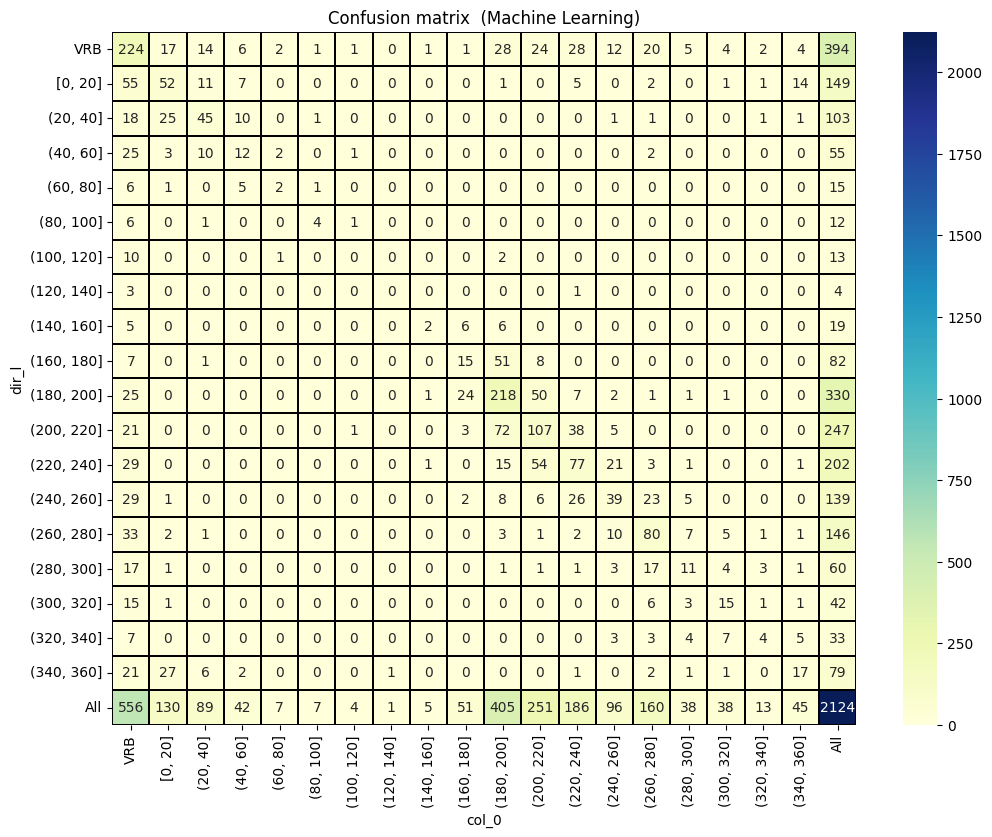

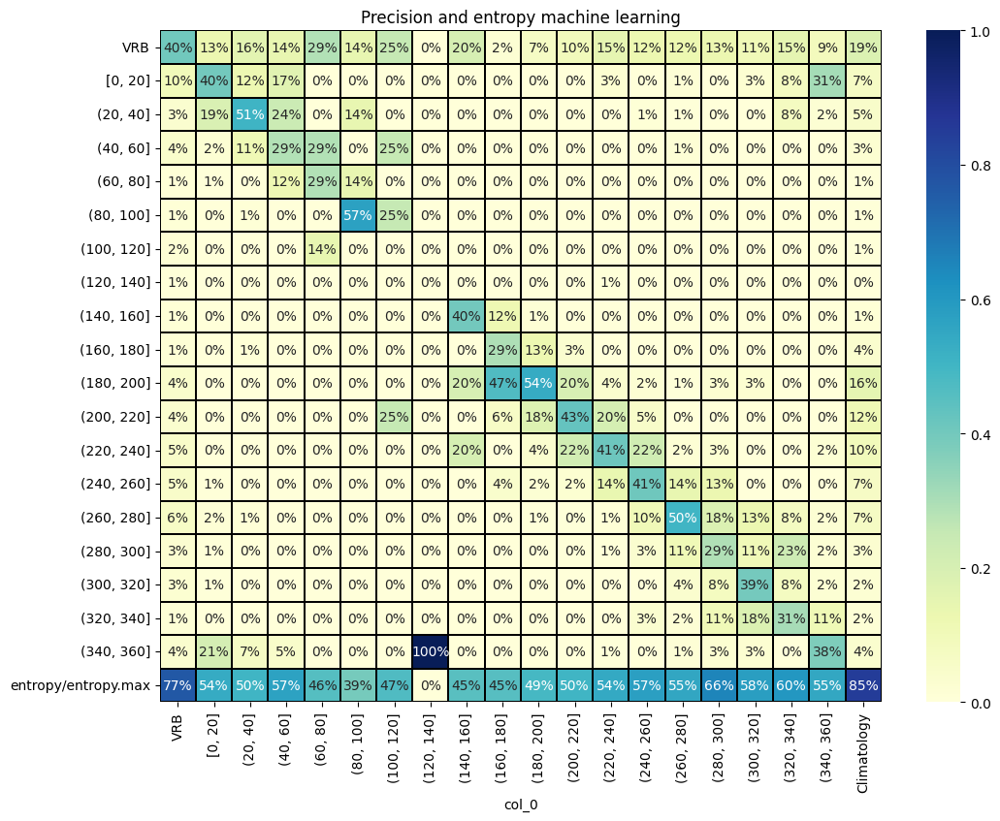

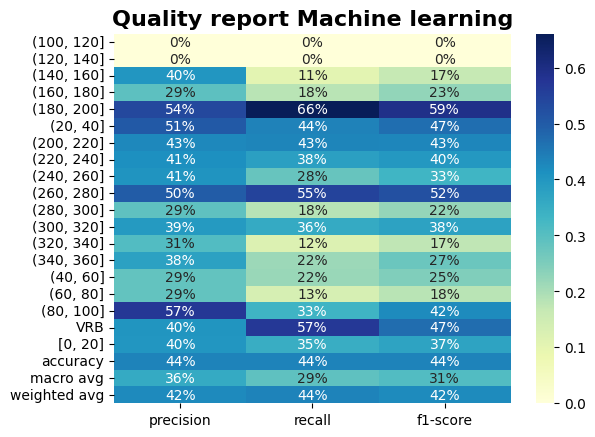


 accuracy mean of samples:  [0.44, 0.44, 0.44, 0.44, 0.44]


In [58]:
#@title ExtraTreesClassifier() with features from Harmonie, WRF and time variables
model_h_w = pd.concat([station,model_h,model_w],axis=1).drop(columns=["spd_o","spd_o_kt","dir_o"]).dropna()

model_h_w["hour"] = model_h_w.index.hour
model_h_w["month"] = model_h_w.index.month
model_h_w["dayofyear"] = model_h_w.index.dayofyear
model_h_w["weekofyear"] = model_h_w.index.isocalendar().week.astype(int)

Y = model_h_w.dir_l
X = model_h_w[['dir0_h', 'snow_prec0_h', 'isocero0_h', 'mod0_h', 'racha_u0_h',
       'racha_v0_h', 'mslp0_h', 'temp0_h', 'rh0_h', 'visibility0_h',
       'lhevapac0_h', 'lhsublac0_h', 'lwflx0_h', 'prec0_h', 'swflx0_h',
       'shflxac0_h', 'cape0_h', 'cin0_h', 'cfh0_h', 'cfl0_h', 'cfm0_h',
       'cft0_h', 'HGT5000_h', 'HGT8500_h', 'T5000_h', 'T8500_h', 'dir1_h',
       'snow_prec1_h', 'isocero1_h', 'mod1_h', 'racha_u1_h', 'racha_v1_h',
       'mslp1_h', 'temp1_h', 'rh1_h', 'visibility1_h', 'lhevapac1_h',
       'lhsublac1_h', 'lwflx1_h', 'prec1_h', 'swflx1_h', 'shflxac1_h',
       'cape1_h', 'cin1_h', 'cfh1_h', 'cfl1_h', 'cfm1_h', 'cft1_h',
       'HGT5001_h','T5001_h', 'T8501_h', 'dir0_w', 'snow_prec0_w', 'snowlevel0_w',
       'mod0_w', 'wind_gust0_w', 'mslp0_w', 'temp0_w', 'rh0_w',
       'visibility0_w', 'lhflx0_w', 'lwflx0_w', 'conv_prec0_w', 'prec0_w',
       'swflx0_w', 'shflx0_w', 'cape0_w', 'cin0_w', 'cfh0_w', 'cfl0_w',
       'cfm0_w', 'cft0_w', 'HGT5000_w', 'HGT8500_w', 'T5000_w', 'T8500_w',
       'dir1_w', 'snow_prec1_w', 'snowlevel1_w', 'mod1_w', 'wind_gust1_w',
       'mslp1_w', 'temp1_w', 'rh1_w', 'visibility1_w', 'lhflx1_w', 'lwflx1_w',
       'conv_prec1_w', 'prec1_w', 'swflx1_w', 'shflx1_w', 'cape1_w', 'cin1_w',
       'cfh1_w', 'cfl1_w', 'cfm1_w', 'cft1_w', 'HGT5001_w', 'HGT8501_w',
       'T5001_w', 'T8501_w', 'hour', 'month', 'dayofyear', 'weekofyear']]

# mean accuracy machine learning sample array
acc_ml_a = []

#seed random function to create TWO RELATED samples of scores
np.random.seed(1)

for t in range (0,5):
  #split variables
  X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size=0.20, )

  #ml_model = RandomForestClassifier().fit(X_train,y_train)
  ml_model = ExtraTreesClassifier().fit(X_train,y_train)

  y_pred = ml_model.predict(X_test)
  acc_ml_a.append(round(accuracy_score(y_test, y_pred),2))

  #Confusion matrix
  plt.figure(figsize=(12, 9))
  plt.title("Confusion matrix  (Machine Learning)")
  cm = pd.crosstab(y_test, ml_model.predict(X_test),margins=True,)
  comuns = [element for element in labels+["All"] if element in cm.columns]
  seab = sns.heatmap(cm[comuns],annot=True,cmap="YlGnBu",fmt='.0f',linewidths=.2,linecolor='black');
  plt.show()

  plt.figure(figsize=(12, 9))
  plt.title("Precision and entropy machine learning")
  column_sc = pd.crosstab(y_test, ml_model.predict(X_test), margins=True,normalize="columns")
  column_sc = column_sc.append(pd.DataFrame(entropy(column_sc,base=2)/(math.log2(column_sc.shape[0])),columns=["entropy/entropy.max"],
                    index=column_sc.columns).T).rename(columns={"All":"Climatology"})
  comuns = [element for element in labels+["Climatology"] if element in column_sc.columns]                  
  seab = sns.heatmap(column_sc[comuns],annot=True,cmap="YlGnBu",fmt='.0%',linewidths=.2,linecolor='black');
  plt.show()
  #quality report
  #print("\nQuality report (Machine Learning)\n")

  df_d = pd.DataFrame(classification_report(y_test, ml_model.predict(X_test),output_dict=True)).T.iloc[:, :3]
  seab = sns.heatmap(df_d,annot=True,cmap="YlGnBu",fmt='.0%',)
  seab.set_title("Quality report Machine learning", fontsize=16, fontweight='bold')
  plt.show()
  #print(pd.DataFrame(classification_report(y_test, ml_model.predict(X_test),output_dict=True)).T)


print("\n accuracy mean of samples: ",acc_ml_a)

In [59]:
#@title Feature importance
def format_as_percentage(value):
    return '{:.1%}'.format(value)
fea_imp =pd.DataFrame({"feature":X.columns,
                      "importance":[(importance/(sum(ml_model.feature_importances_))) for importance in ml_model.feature_importances_]})
fea_imp["feature_per"] =  fea_imp['importance'].map(format_as_percentage) 
fea_sort = fea_imp.sort_values(by="importance",ascending=False)
fea_sort[["feature","feature_per"]][:10]

,feature,feature_per
26,dir1_h,2.6%
76,dir1_w,2.5%
31,racha_v1_h,2.4%
5,racha_v0_h,2.3%
51,dir0_w,2.2%
0,dir0_h,2.1%
4,racha_u0_h,1.7%
30,racha_u1_h,1.6%
29,mod1_h,1.4%
3,mod0_h,1.4%
